# Run spec2 pipeline

The dispersed images for WFSS will be run through the [spec2 pipeline](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec2.html) after the image2 and image3 pipelines have been run on the corresponding direct images. As mentioned in the previous notebook, it is extremely helpful for this step if you have a source catalog that only includes the sources that you would like to look at. Any additional sources will take extra time to calibrate.

**Use case**: After creating a custom source catalog, spec2 should be run on the dispersed WFSS images.<br>
**Data**: JWST/NIRISS images and spectra from program 2079 obs 004. This should be stored in a single directory `data`, and can be downloaded from the notebook 00_niriss_mast_query_data_setup.ipynb.<br>
**Tools**: astropy, crds, glob, jdaviz, json, jwst, matplotlib, numpy, os, pandas, shutil, urllib, zipfile<br>
**Cross-instrument**: NIRISS<br>

**Content**
- [Imports & Data Setup](#imports)
- [Custom Spec2 Pipeline Run](#custom_spec2)
  - [Spec2 Association Files](#spec2_asn)
  - [Run Spec2](#spec2_run)
  - [Examine the Outputs of Spec2](#spec2_examine)
- [Explore Data Further](#explore)
  - [Find a Source](#source)
  - [Limit the Number of Extracted Sources](#limit_source)
  - [Final Visualization](#final_visualize)

**Author**: Rachel Plesha (rplesha@stsci.edu), Camilla Pacifici (cpacifici@stsci.edu), JWebbinar notebooks.<br>
**First Published**: May 2024<br>
**Last tested**: This notebook was last tested with JWST pipeline version 1.12.5 and the CRDS context jwst_1225.pmap.

<a id='imports'></a>
## Imports & Data Setup

[CRDS Documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html#crds)

In [1]:
# Update the CRDS path to your local directory
%env CRDS_PATH=crds_cache
%env CRDS_SERVER_URL=https://jwst-crds.stsci.edu

env: CRDS_PATH=crds_cache
env: CRDS_SERVER_URL=https://jwst-crds.stsci.edu


In [2]:
import glob
import json
import os
import shutil
import urllib
import zipfile
import numpy as np
import pandas as pd

from astropy.table import Table
from astropy.io import fits
from astropy import constants as const

from matplotlib import pyplot as plt
from matplotlib import patches
%matplotlib widget
# %matplotlib inline

from jwst.pipeline import Spec2Pipeline

Check what version of the JWST pipeline you are using. To see what the latest version of the pipeline is available or install a previous version, check [GitHub](https://github.com/spacetelescope/jwst#software-vs-dms-build-version-map"). Also verify what [CRDS version](https://jwst-crds.stsci.edu/) you are using. [CRDS documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html) explains how to set a specific context to use in the JWST pipeline. If either of these values are different from the last tested note above there may be differences in this notebook.

In [3]:
import jwst
import crds
print('JWST Pipeliene Version:', jwst.__version__)
print('CRDS Context:', crds.get_context_name('jwst'))

JWST Pipeliene Version: 1.14.0


CRDS Context: jwst_1237.pmap


#### Data Setup

The data directory, `data_dir` should contain all of the association and rate files in a single, flat directory. `custom_run_image3` should match the output directory for the custom image3 calibration in the notebook 01_niriss_wfss_image2_image3.ipynb.

For spec2, we need the rate files that we downloaded as well as the segmentation maps and source catalogs from image3. Because of that, we will create a new directory (defined by `custom_run_spec2`), change into it, and copy the relevant data over. 

*For a regular workflow, it is likely easier to leave all files in a single directory compared to the multiple directories we make here.*

Open up our data information file which will make parsing the rate files to copy over easier as we only need the dispersed images, i.e. those observed with GR150R or GR150C.

In [4]:
data_dir = 'data'
if not os.path.exists(data_dir):
    os.mkdir(data_dir)
    
custom_run_spec2 = 'custom_spec2' # saving files here in this notebook
custom_run_image3 = 'custom_image3_calibrated' # results of custom image3 calibration

# if the directories dont't exist yet, make it
for custom_dir in [custom_run_spec2, custom_run_image3]:
    if not os.path.exists(os.path.join(data_dir, custom_dir)):
        os.mkdir(os.path.join(data_dir, custom_dir))

In [5]:
# if you have not downloaded the data from notebook 00 or have not run notebook 01, run this cell. Otherwise, feel free to skip it.

# Download uncalibrated data from Box into the data directory:
boxlink = 'https://data.science.stsci.edu/redirect/JWST/jwst-data_analysis_tools/niriss_wfss_advanced/niriss_wfss_advanced_02_input.zip'
boxfile = os.path.basename(boxlink)
urllib.request.urlretrieve(boxlink, boxfile)

zf = zipfile.ZipFile(boxfile, 'r')
zf.extractall(path=data_dir)

# move the files downloaded from the box file into the top level data directory
box_download_dir = os.path.join(data_dir, boxfile.split('.zip')[0])

for filename in glob.glob(os.path.join(box_download_dir, '*')):
    if '.csv' in filename:
        # move to the current directory
        os.rename(filename, os.path.basename(filename))
    elif '_segm.fits' in filename or '_cat.ecsv' in filename:
        # move the image2 products to the appropriate directory
        os.rename(filename, os.path.join(data_dir, custom_run_spec2, os.path.basename(filename)))
    elif '_i2d.fits' in filename:
        # move image3 products to their directory, too
        os.rename(filename, os.path.join(data_dir, custom_run_image3, os.path.basename(filename)))
    else:
        # move to the data directory 
        os.rename(filename, os.path.join(data_dir, os.path.basename(filename)))
        
# remove unnecessary files now
os.remove(boxfile)
os.rmdir(box_download_dir)

In [6]:
# From the csv file we created earlier, find a list of all of the grism observations we will want to calibrate with spec2
listrate_file = 'list_ngdeep_rate.csv'
rate_df = pd.read_csv(listrate_file)

In [7]:
# copy all of the grism rate files
gr150r_files = list(rate_df[rate_df['FILTER'] == 'GR150R']['FILENAME'])
gr150c_files = list(rate_df[rate_df['FILTER'] == 'GR150C']['FILENAME'])

for grism_rate in gr150r_files + gr150c_files:
    if os.path.exists(grism_rate):
        shutil.copy(grism_rate, os.path.join(data_dir, custom_run_spec2, os.path.basename(grism_rate)))
    else:
        print(f'{grism_rate} does not exist. Not able to copy file.')

In [8]:
# copy all of the spec2 asn files
for asn in glob.glob(os.path.join(data_dir, '*spec2*asn*.json')):
    if os.path.exists(asn):
        shutil.copy(asn, os.path.join(data_dir, custom_run_spec2, os.path.basename(asn)))
    else:
        print(f'{asn} does not exist. Not able to copy file.')

In [9]:
# copy all of the necessary image3 output files
cats = glob.glob(os.path.join(data_dir, custom_run_image3, '*source*_cat.ecsv')) # copy both the source-match and source118 catalogs
segm = glob.glob(os.path.join(data_dir, custom_run_image3, '*_segm.fits'))

for image3_file in cats + segm:
    if os.path.exists(image3_file):
        shutil.copy(image3_file, os.path.join(data_dir, custom_run_spec2, os.path.basename(image3_file)))
    else:
        print(f'{image3_file} does not exist. Not able to copy file.')

In [10]:
cwd = os.getcwd() # get the current working directory 
if cwd != data_dir: # if you are not already in the location of the data, change into it
    try:
        os.chdir(data_dir)
    except FileNotFoundError:
        print(f"Not able to change into: {data_dir}.\nRemaining in: {cwd}")
        pass

if not os.path.exists(custom_run_spec2):
    os.mkdir(custom_run_spec2)

os.chdir(custom_run_spec2)

new_cwd = os.getcwd()
print('Now in:', new_cwd)

Now in: /home/runner/work/jdat_notebooks/jdat_notebooks/notebooks/NIRISS_WFSS_advanced/data/custom_spec2


In [11]:
# directories for calibrating later
source_outdir = 'new_catalog_calibrated'
if not os.path.exists(source_outdir):
    os.mkdir(source_outdir)


param_outdir = 'parameter_input_calibrated'
if not os.path.exists(param_outdir):
    os.mkdir(param_outdir)

<a id="custom_spec2"></a>
## Custom Spec2 Pipeline Run

Because this is a custom spec2 pipeline run, the first step is to make sure the correct source catalog is being used. This will define the spectral trace cutouts, and therefore inform the pipeline on where to extract the spectrum.

<a id="spec2_asn"></a>
### Spec2 Association Files

As with the imaging part of the pipeline, there are association files for spec2. These are a bit more complex in that they need to have the science (WFSS) data, direct image, source catalog, and segmentation map included as members. For the science data, the rate files are used as inputs, similarly to image2. Also like image2, there should be one asn file for each dispersed image dither position in an observing sequence. In this case, that should match the number of rate files where `FILTER=GR150R` or `FILTER=GR150C`. For this program and observation, there are three dithers per grism, and both GR150R and GR150C are used, totaling six exposures per observing sequence with five observing sequences in the observation using the blocking filters F115W -> F115W -> F150W -> F150W -> F200W.

#### Looking in a Spec2 Association File

In [12]:
spec2_asns = np.sort(glob.glob('*spec2*asn*.json'))
print(len(spec2_asns), 'Spec2 ASN files')
# number of asn files should match the number of dispersed images -- 30 for obs 004
print(len(rate_df[(rate_df['FILTER'] == 'GR150R') | (rate_df['FILTER'] == 'GR150C')]), 'Dispersed image rate files')

30 Spec2 ASN files
30 Dispersed image rate files


In [13]:
# look at one of the association files
asn_data = json.load(open(spec2_asns[0]))
for key, data in asn_data.items():
    print(f"{key} : {data}")

asn_type : spec2
asn_rule : candidate_Asn_Lv2WFSSNIS
version_id : 20231119t124442
code_version : 1.11.4
degraded_status : No known degraded exposures in association.
program : 02079
constraints : DMSAttrConstraint({'name': 'program', 'sources': ['program'], 'value': '2079'})
DMSAttrConstraint({'name': 'is_tso', 'sources': ['tsovisit'], 'value': None})
Constraint_Target({'name': 'target', 'sources': ['targetid'], 'value': '1'})
DMSAttrConstraint({'name': 'exp_type', 'sources': ['exp_type'], 'value': 'nis_wfss'})
DMSAttrConstraint({'name': 'image_exp_type', 'sources': ['exp_type'], 'value': 'nis_image'})
DMSAttrConstraint({'name': 'instrument', 'sources': ['instrume'], 'value': 'niriss'})
DMSAttrConstraint({'name': 'pupil', 'sources': ['pupil'], 'value': 'f200w'})
DMSAttrConstraint({'name': 'asn_candidate', 'sources': ['asn_candidate'], 'value': "\\('o004',\\ 'observation'\\)"})
asn_id : o004
asn_pool : jw02079_20231119t124442_pool.csv
target : 1
products : [{'name': 'jw02079004003_05101

In [14]:
# in particular, take a closer look at the product filenames with the association file:
for product in asn_data['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} : {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079004003_05101_00003_nis
members:
    jw02079004003_05101_00003_nis_rate.fits : science
    jw02079-o004_t001_niriss_clear-f200w_i2d.fits : direct_image
    jw02079-o004_t001_niriss_clear-f200w_cat.ecsv : sourcecat
    jw02079-o004_t001_niriss_clear-f200w_segm.fits : segmap


#### Modify the Association File to use Custom Source Catalog

What is currently in the association files uses the pipeline source catalog. In the previous notebook, we created a custom source catalog that we want to use with the extension `source-match_cat.ecsv`, so we need to point to that catalog instead in the association files.

In [15]:
new_source_ext = 'source-match_cat.ecsv'

# loop through all of the spec2 association files in the current directory
for asn in spec2_asns:
    asn_data = json.load(open(asn))
    for product in asn_data['products']: # for every product, check the members        
        for member in product['members']: # there are multiple members per product
            if member['exptype'] == 'sourcecat':
                cat_in_asn = member['expname']
                # check that we haven't already updated the source catalog name
                if new_source_ext not in cat_in_asn:
                    new_cat = cat_in_asn.replace('cat.ecsv', new_source_ext)
                    # actually update the association file member
                    if os.path.exists(new_cat):
                        member['expname'] = new_cat
                    else:
                        print(f"{new_cat} does not exist in the currenty working directory")

    # write out the new association file
    with open(asn, 'w', encoding='utf-8') as f:
        json.dump(asn_data, f, ensure_ascii=False, indent=4)

In [16]:
# double check that things still look ok:
asn_check = json.load(open(spec2_asns[0]))
for product in asn_check['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} : {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079004003_05101_00003_nis
members:
    jw02079004003_05101_00003_nis_rate.fits : science
    jw02079-o004_t001_niriss_clear-f200w_i2d.fits : direct_image
    jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv : sourcecat
    jw02079-o004_t001_niriss_clear-f200w_segm.fits : segmap


Alternatively, open the .json file in your favorite text editor and manually edit each of the catalog names

<a id="spec2_run"></a>
### Run spec2

Like the image pipeline, we can supply custom parameters for steps in the pipeline.

More information about everything that is run during the spec2 stage of the pipeline can be found [here](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec2.html).

To start, we are only going to run spec2 on one association file because spec2 can take a while to run if there are many sources. We are saving the outputs to the directory we are currently in, which should be the `custom_spec2` directory made above.

In [17]:
test_asn = spec2_asns[0]
print(f'Calibrating: {test_asn}')

Calibrating: jw02079-o004_20231119t124442_spec2_00001_asn.json


In [18]:
# check if the calibrated file already exists
asn_data = json.load(open(test_asn))
x1d_file = f"{asn_data['products'][0]['name']}_x1d.fits"

if os.path.exists(x1d_file):
    print(x1d_file, ': x1d file already exists.')
else:
    spec2 = Spec2Pipeline.call(test_asn, save_results=True)

2024-06-07 13:56:17,432 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_datalvl_0002.rmap       694 bytes  (1 / 189 files) (0 / 703.4 K bytes)


2024-06-07 13:56:17,508 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_calver_0036.rmap      4.6 K bytes  (2 / 189 files) (694 / 703.4 K bytes)


2024-06-07 13:56:17,587 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_0035.imap               385 bytes  (3 / 189 files) (5.3 K / 703.4 K bytes)


2024-06-07 13:56:17,653 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap    1.4 K bytes  (4 / 189 files) (5.7 K / 703.4 K bytes)


2024-06-07 13:56:17,795 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavecorr_0005.rmap      884 bytes  (5 / 189 files) (7.1 K / 703.4 K bytes)


2024-06-07 13:56:17,843 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_superbias_0072.rmap   31.8 K bytes  (6 / 189 files) (8.0 K / 703.4 K bytes)


2024-06-07 13:56:17,947 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_sflat_0024.rmap     20.6 K bytes  (7 / 189 files) (39.8 K / 703.4 K bytes)


2024-06-07 13:56:18,010 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_saturation_0018.rmap    2.0 K bytes  (8 / 189 files) (60.4 K / 703.4 K bytes)


2024-06-07 13:56:18,067 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_refpix_0015.rmap     1.6 K bytes  (9 / 189 files) (62.4 K / 703.4 K bytes)


2024-06-07 13:56:18,133 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_readnoise_0025.rmap    2.6 K bytes  (10 / 189 files) (64.0 K / 703.4 K bytes)


2024-06-07 13:56:18,180 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_photom_0013.rmap       958 bytes  (11 / 189 files) (66.5 K / 703.4 K bytes)


2024-06-07 13:56:18,233 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pathloss_0006.rmap    1.1 K bytes  (12 / 189 files) (67.5 K / 703.4 K bytes)


2024-06-07 13:56:18,352 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-whitelightstep_0001.rmap      777 bytes  (13 / 189 files) (68.6 K / 703.4 K bytes)


2024-06-07 13:56:18,476 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-spec2pipeline_0013.rmap    2.1 K bytes  (14 / 189 files) (69.3 K / 703.4 K bytes)


2024-06-07 13:56:18,532 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-outlierdetectionstep_0002.rmap      852 bytes  (15 / 189 files) (71.4 K / 703.4 K bytes)


2024-06-07 13:56:18,584 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-jumpstep_0005.rmap      810 bytes  (16 / 189 files) (72.3 K / 703.4 K bytes)


2024-06-07 13:56:18,640 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-image2pipeline_0008.rmap    1.0 K bytes  (17 / 189 files) (73.1 K / 703.4 K bytes)


2024-06-07 13:56:18,684 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-detector1pipeline_0003.rmap    1.1 K bytes  (18 / 189 files) (74.1 K / 703.4 K bytes)


2024-06-07 13:56:18,769 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkpipeline_0003.rmap      872 bytes  (19 / 189 files) (75.2 K / 703.4 K bytes)


2024-06-07 13:56:18,811 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ote_0030.rmap        1.3 K bytes  (20 / 189 files) (76.0 K / 703.4 K bytes)


2024-06-07 13:56:18,886 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msaoper_0014.rmap    1.4 K bytes  (21 / 189 files) (77.3 K / 703.4 K bytes)


2024-06-07 13:56:18,929 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msa_0027.rmap        1.3 K bytes  (22 / 189 files) (78.7 K / 703.4 K bytes)


2024-06-07 13:56:18,985 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_mask_0039.rmap       2.7 K bytes  (23 / 189 files) (80.0 K / 703.4 K bytes)


2024-06-07 13:56:19,052 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_linearity_0017.rmap    1.6 K bytes  (24 / 189 files) (82.7 K / 703.4 K bytes)


2024-06-07 13:56:19,102 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ipc_0006.rmap          876 bytes  (25 / 189 files) (84.2 K / 703.4 K bytes)


2024-06-07 13:56:19,144 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifuslicer_0017.rmap    1.5 K bytes  (26 / 189 files) (85.1 K / 703.4 K bytes)


2024-06-07 13:56:19,191 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifupost_0019.rmap    1.5 K bytes  (27 / 189 files) (86.6 K / 703.4 K bytes)


2024-06-07 13:56:19,230 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifufore_0017.rmap    1.5 K bytes  (28 / 189 files) (88.1 K / 703.4 K bytes)


2024-06-07 13:56:19,278 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_gain_0023.rmap       1.8 K bytes  (29 / 189 files) (89.6 K / 703.4 K bytes)


2024-06-07 13:56:19,326 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fpa_0028.rmap        1.3 K bytes  (30 / 189 files) (91.4 K / 703.4 K bytes)


2024-06-07 13:56:19,410 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fore_0026.rmap       5.0 K bytes  (31 / 189 files) (92.7 K / 703.4 K bytes)


2024-06-07 13:56:19,450 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_flat_0015.rmap       3.8 K bytes  (32 / 189 files) (97.6 K / 703.4 K bytes)


2024-06-07 13:56:19,559 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fflat_0024.rmap      7.2 K bytes  (33 / 189 files) (101.4 K / 703.4 K bytes)


2024-06-07 13:56:19,605 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_extract1d_0018.rmap    2.3 K bytes  (34 / 189 files) (108.6 K / 703.4 K bytes)


2024-06-07 13:56:19,645 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_disperser_0028.rmap    5.7 K bytes  (35 / 189 files) (111.0 K / 703.4 K bytes)


2024-06-07 13:56:19,694 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dflat_0007.rmap      1.1 K bytes  (36 / 189 files) (116.6 K / 703.4 K bytes)


2024-06-07 13:56:19,757 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dark_0067.rmap      30.5 K bytes  (37 / 189 files) (117.8 K / 703.4 K bytes)


2024-06-07 13:56:19,815 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_cubepar_0014.rmap      966 bytes  (38 / 189 files) (148.2 K / 703.4 K bytes)


2024-06-07 13:56:19,874 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_collimator_0026.rmap    1.3 K bytes  (39 / 189 files) (149.2 K / 703.4 K bytes)


2024-06-07 13:56:19,921 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_camera_0026.rmap     1.3 K bytes  (40 / 189 files) (150.6 K / 703.4 K bytes)


2024-06-07 13:56:19,967 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_barshadow_0007.rmap    1.8 K bytes  (41 / 189 files) (151.8 K / 703.4 K bytes)


2024-06-07 13:56:20,119 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_area_0018.rmap       6.3 K bytes  (42 / 189 files) (153.6 K / 703.4 K bytes)


2024-06-07 13:56:20,166 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_apcorr_0009.rmap     5.6 K bytes  (43 / 189 files) (159.9 K / 703.4 K bytes)


2024-06-07 13:56:20,231 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_0369.imap            5.4 K bytes  (44 / 189 files) (165.5 K / 703.4 K bytes)


2024-06-07 13:56:20,282 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wfssbkg_0007.rmap     3.1 K bytes  (45 / 189 files) (170.9 K / 703.4 K bytes)


2024-06-07 13:56:20,321 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavemap_0008.rmap     2.2 K bytes  (46 / 189 files) (174.0 K / 703.4 K bytes)


2024-06-07 13:56:20,360 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavelengthrange_0006.rmap      862 bytes  (47 / 189 files) (176.3 K / 703.4 K bytes)


2024-06-07 13:56:20,453 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trappars_0004.rmap      753 bytes  (48 / 189 files) (177.1 K / 703.4 K bytes)


2024-06-07 13:56:20,493 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trapdensity_0004.rmap      774 bytes  (49 / 189 files) (177.9 K / 703.4 K bytes)


2024-06-07 13:56:20,556 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_throughput_0005.rmap    1.3 K bytes  (50 / 189 files) (178.6 K / 703.4 K bytes)


2024-06-07 13:56:20,596 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_superbias_0028.rmap    6.5 K bytes  (51 / 189 files) (179.9 K / 703.4 K bytes)


2024-06-07 13:56:20,739 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specwcs_0012.rmap     3.1 K bytes  (52 / 189 files) (186.4 K / 703.4 K bytes)


2024-06-07 13:56:20,780 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_spectrace_0008.rmap    2.3 K bytes  (53 / 189 files) (189.5 K / 703.4 K bytes)


2024-06-07 13:56:20,830 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specprofile_0008.rmap    2.4 K bytes  (54 / 189 files) (191.8 K / 703.4 K bytes)


2024-06-07 13:56:20,869 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_speckernel_0006.rmap    1.0 K bytes  (55 / 189 files) (194.2 K / 703.4 K bytes)


2024-06-07 13:56:20,917 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_saturation_0015.rmap      829 bytes  (56 / 189 files) (195.2 K / 703.4 K bytes)


2024-06-07 13:56:20,969 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_readnoise_0011.rmap      987 bytes  (57 / 189 files) (196.1 K / 703.4 K bytes)


2024-06-07 13:56:21,020 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_photom_0035.rmap      1.3 K bytes  (58 / 189 files) (197.0 K / 703.4 K bytes)


2024-06-07 13:56:21,077 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_persat_0006.rmap        738 bytes  (59 / 189 files) (198.3 K / 703.4 K bytes)


2024-06-07 13:56:21,127 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pathloss_0003.rmap      758 bytes  (60 / 189 files) (199.0 K / 703.4 K bytes)


2024-06-07 13:56:21,178 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-undersamplecorrectionstep_0001.rmap      904 bytes  (61 / 189 files) (199.8 K / 703.4 K bytes)


2024-06-07 13:56:21,224 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-tweakregstep_0009.rmap    3.1 K bytes  (62 / 189 files) (200.7 K / 703.4 K bytes)


2024-06-07 13:56:21,273 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-spec2pipeline_0008.rmap      984 bytes  (63 / 189 files) (203.8 K / 703.4 K bytes)


2024-06-07 13:56:21,323 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-sourcecatalogstep_0002.rmap    2.3 K bytes  (64 / 189 files) (204.8 K / 703.4 K bytes)


2024-06-07 13:56:21,362 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-outlierdetectionstep_0004.rmap    2.7 K bytes  (65 / 189 files) (207.1 K / 703.4 K bytes)


2024-06-07 13:56:21,402 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-jumpstep_0007.rmap    6.4 K bytes  (66 / 189 files) (209.8 K / 703.4 K bytes)


2024-06-07 13:56:21,491 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-image2pipeline_0005.rmap    1.0 K bytes  (67 / 189 files) (216.1 K / 703.4 K bytes)


2024-06-07 13:56:21,540 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-detector1pipeline_0002.rmap    1.0 K bytes  (68 / 189 files) (217.2 K / 703.4 K bytes)


2024-06-07 13:56:21,592 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkpipeline_0002.rmap      868 bytes  (69 / 189 files) (218.2 K / 703.4 K bytes)


2024-06-07 13:56:21,644 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-chargemigrationstep_0002.rmap    5.7 K bytes  (70 / 189 files) (219.1 K / 703.4 K bytes)


2024-06-07 13:56:21,685 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_nrm_0002.rmap           663 bytes  (71 / 189 files) (224.7 K / 703.4 K bytes)


2024-06-07 13:56:21,725 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_mask_0020.rmap          859 bytes  (72 / 189 files) (225.4 K / 703.4 K bytes)


2024-06-07 13:56:21,773 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_linearity_0022.rmap      961 bytes  (73 / 189 files) (226.3 K / 703.4 K bytes)


2024-06-07 13:56:21,815 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_ipc_0007.rmap           651 bytes  (74 / 189 files) (227.2 K / 703.4 K bytes)


2024-06-07 13:56:21,877 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_gain_0011.rmap          797 bytes  (75 / 189 files) (227.9 K / 703.4 K bytes)


2024-06-07 13:56:21,917 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_flat_0023.rmap        5.9 K bytes  (76 / 189 files) (228.7 K / 703.4 K bytes)


2024-06-07 13:56:21,958 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_filteroffset_0010.rmap      853 bytes  (77 / 189 files) (234.5 K / 703.4 K bytes)


2024-06-07 13:56:22,006 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_extract1d_0007.rmap      905 bytes  (78 / 189 files) (235.4 K / 703.4 K bytes)


2024-06-07 13:56:22,053 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_drizpars_0004.rmap      519 bytes  (79 / 189 files) (236.3 K / 703.4 K bytes)


2024-06-07 13:56:22,099 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_distortion_0025.rmap    3.4 K bytes  (80 / 189 files) (236.8 K / 703.4 K bytes)


2024-06-07 13:56:22,147 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_dark_0031.rmap        6.8 K bytes  (81 / 189 files) (240.3 K / 703.4 K bytes)


2024-06-07 13:56:22,190 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_area_0014.rmap        2.7 K bytes  (82 / 189 files) (247.0 K / 703.4 K bytes)


2024-06-07 13:56:22,230 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_apcorr_0010.rmap      4.3 K bytes  (83 / 189 files) (249.7 K / 703.4 K bytes)


2024-06-07 13:56:22,277 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_abvegaoffset_0004.rmap    1.4 K bytes  (84 / 189 files) (254.0 K / 703.4 K bytes)


2024-06-07 13:56:22,329 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_0246.imap             5.5 K bytes  (85 / 189 files) (255.4 K / 703.4 K bytes)


2024-06-07 13:56:22,371 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wfssbkg_0004.rmap     7.2 K bytes  (86 / 189 files) (260.9 K / 703.4 K bytes)


2024-06-07 13:56:22,525 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wavelengthrange_0010.rmap      996 bytes  (87 / 189 files) (268.1 K / 703.4 K bytes)


2024-06-07 13:56:22,576 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_tsophot_0003.rmap       896 bytes  (88 / 189 files) (269.1 K / 703.4 K bytes)


2024-06-07 13:56:22,632 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trappars_0003.rmap    1.6 K bytes  (89 / 189 files) (270.0 K / 703.4 K bytes)


2024-06-07 13:56:22,682 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trapdensity_0003.rmap    1.6 K bytes  (90 / 189 files) (271.5 K / 703.4 K bytes)


2024-06-07 13:56:22,727 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_superbias_0017.rmap   16.1 K bytes  (91 / 189 files) (273.2 K / 703.4 K bytes)


2024-06-07 13:56:22,781 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_specwcs_0022.rmap     7.1 K bytes  (92 / 189 files) (289.2 K / 703.4 K bytes)


2024-06-07 13:56:22,828 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_saturation_0010.rmap    2.2 K bytes  (93 / 189 files) (296.4 K / 703.4 K bytes)


2024-06-07 13:56:22,866 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_readnoise_0024.rmap   23.1 K bytes  (94 / 189 files) (298.5 K / 703.4 K bytes)


2024-06-07 13:56:22,924 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_psfmask_0008.rmap    28.4 K bytes  (95 / 189 files) (321.6 K / 703.4 K bytes)


2024-06-07 13:56:22,978 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_photom_0025.rmap      3.4 K bytes  (96 / 189 files) (349.9 K / 703.4 K bytes)


2024-06-07 13:56:23,023 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_persat_0005.rmap      1.6 K bytes  (97 / 189 files) (353.3 K / 703.4 K bytes)


2024-06-07 13:56:23,064 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (98 / 189 files) (354.9 K / 703.4 K bytes)


2024-06-07 13:56:23,113 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap    4.5 K bytes  (99 / 189 files) (356.3 K / 703.4 K bytes)


2024-06-07 13:56:23,161 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap      984 bytes  (100 / 189 files) (360.8 K / 703.4 K bytes)


2024-06-07 13:56:23,208 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (101 / 189 files) (361.8 K / 703.4 K bytes)


2024-06-07 13:56:23,251 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (102 / 189 files) (366.4 K / 703.4 K bytes)


2024-06-07 13:56:23,299 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-jumpstep_0005.rmap      806 bytes  (103 / 189 files) (367.4 K / 703.4 K bytes)


2024-06-07 13:56:23,349 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-image2pipeline_0003.rmap    1.0 K bytes  (104 / 189 files) (368.2 K / 703.4 K bytes)


2024-06-07 13:56:23,390 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-detector1pipeline_0002.rmap    1.0 K bytes  (105 / 189 files) (369.2 K / 703.4 K bytes)


2024-06-07 13:56:23,492 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkpipeline_0002.rmap      868 bytes  (106 / 189 files) (370.2 K / 703.4 K bytes)


2024-06-07 13:56:23,539 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_mask_0010.rmap        2.9 K bytes  (107 / 189 files) (371.1 K / 703.4 K bytes)


2024-06-07 13:56:23,581 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_linearity_0011.rmap    2.4 K bytes  (108 / 189 files) (374.0 K / 703.4 K bytes)


2024-06-07 13:56:23,631 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_ipc_0003.rmap         2.0 K bytes  (109 / 189 files) (376.4 K / 703.4 K bytes)


2024-06-07 13:56:23,682 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_gain_0016.rmap        2.1 K bytes  (110 / 189 files) (378.4 K / 703.4 K bytes)


2024-06-07 13:56:23,733 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_flat_0025.rmap       51.6 K bytes  (111 / 189 files) (380.5 K / 703.4 K bytes)


2024-06-07 13:56:23,796 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_filteroffset_0004.rmap    1.4 K bytes  (112 / 189 files) (432.1 K / 703.4 K bytes)


2024-06-07 13:56:23,841 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_extract1d_0004.rmap      842 bytes  (113 / 189 files) (433.5 K / 703.4 K bytes)


2024-06-07 13:56:23,883 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_drizpars_0001.rmap      519 bytes  (114 / 189 files) (434.3 K / 703.4 K bytes)


2024-06-07 13:56:23,942 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_distortion_0033.rmap   53.4 K bytes  (115 / 189 files) (434.9 K / 703.4 K bytes)


2024-06-07 13:56:23,996 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_dark_0044.rmap       26.3 K bytes  (116 / 189 files) (488.2 K / 703.4 K bytes)


2024-06-07 13:56:24,054 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_area_0012.rmap       33.5 K bytes  (117 / 189 files) (514.5 K / 703.4 K bytes)


2024-06-07 13:56:24,116 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_apcorr_0008.rmap      4.3 K bytes  (118 / 189 files) (548.1 K / 703.4 K bytes)


2024-06-07 13:56:24,155 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_abvegaoffset_0003.rmap    1.3 K bytes  (119 / 189 files) (552.3 K / 703.4 K bytes)


2024-06-07 13:56:24,205 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_0285.imap             5.3 K bytes  (120 / 189 files) (553.6 K / 703.4 K bytes)


2024-06-07 13:56:24,246 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_wavelengthrange_0027.rmap      929 bytes  (121 / 189 files) (558.9 K / 703.4 K bytes)


2024-06-07 13:56:24,290 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_tsophot_0004.rmap         882 bytes  (122 / 189 files) (559.8 K / 703.4 K bytes)


2024-06-07 13:56:24,338 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_straymask_0009.rmap       987 bytes  (123 / 189 files) (560.7 K / 703.4 K bytes)


2024-06-07 13:56:24,383 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_specwcs_0040.rmap       5.8 K bytes  (124 / 189 files) (561.7 K / 703.4 K bytes)


2024-06-07 13:56:24,430 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_saturation_0015.rmap    1.2 K bytes  (125 / 189 files) (567.5 K / 703.4 K bytes)


2024-06-07 13:56:24,471 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_rscd_0008.rmap          1.0 K bytes  (126 / 189 files) (568.6 K / 703.4 K bytes)


2024-06-07 13:56:24,519 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_resol_0006.rmap           790 bytes  (127 / 189 files) (569.7 K / 703.4 K bytes)


2024-06-07 13:56:24,562 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_reset_0026.rmap         3.9 K bytes  (128 / 189 files) (570.5 K / 703.4 K bytes)


2024-06-07 13:56:24,628 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_regions_0033.rmap       5.2 K bytes  (129 / 189 files) (574.3 K / 703.4 K bytes)


2024-06-07 13:56:24,673 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_readnoise_0023.rmap     1.6 K bytes  (130 / 189 files) (579.6 K / 703.4 K bytes)


2024-06-07 13:56:24,714 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_psfmask_0009.rmap       2.1 K bytes  (131 / 189 files) (581.2 K / 703.4 K bytes)


2024-06-07 13:56:24,774 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_photom_0052.rmap        3.7 K bytes  (132 / 189 files) (583.3 K / 703.4 K bytes)


2024-06-07 13:56:24,815 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pathloss_0005.rmap        866 bytes  (133 / 189 files) (587.1 K / 703.4 K bytes)


2024-06-07 13:56:24,867 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-whitelightstep_0003.rmap      912 bytes  (134 / 189 files) (587.9 K / 703.4 K bytes)


2024-06-07 13:56:24,918 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-tweakregstep_0003.rmap    1.8 K bytes  (135 / 189 files) (588.8 K / 703.4 K bytes)


2024-06-07 13:56:24,967 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec3pipeline_0006.rmap      816 bytes  (136 / 189 files) (590.7 K / 703.4 K bytes)


2024-06-07 13:56:25,012 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec2pipeline_0010.rmap    1.3 K bytes  (137 / 189 files) (591.5 K / 703.4 K bytes)


2024-06-07 13:56:25,062 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-sourcecatalogstep_0003.rmap    1.9 K bytes  (138 / 189 files) (592.8 K / 703.4 K bytes)


2024-06-07 13:56:25,111 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-outlierdetectionstep_0015.rmap    3.4 K bytes  (139 / 189 files) (594.7 K / 703.4 K bytes)


2024-06-07 13:56:25,156 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-jumpstep_0009.rmap    1.4 K bytes  (140 / 189 files) (598.1 K / 703.4 K bytes)


2024-06-07 13:56:25,198 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-image2pipeline_0006.rmap      979 bytes  (141 / 189 files) (599.5 K / 703.4 K bytes)


2024-06-07 13:56:25,246 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-emicorrstep_0002.rmap      796 bytes  (142 / 189 files) (600.5 K / 703.4 K bytes)


2024-06-07 13:56:25,299 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-detector1pipeline_0007.rmap    1.4 K bytes  (143 / 189 files) (601.3 K / 703.4 K bytes)


2024-06-07 13:56:25,346 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkpipeline_0002.rmap      860 bytes  (144 / 189 files) (602.7 K / 703.4 K bytes)


2024-06-07 13:56:25,395 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsxartcorr_0002.rmap    2.2 K bytes  (145 / 189 files) (603.5 K / 703.4 K bytes)


2024-06-07 13:56:25,443 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsptcorr_0005.rmap     2.0 K bytes  (146 / 189 files) (605.7 K / 703.4 K bytes)


2024-06-07 13:56:25,496 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mask_0022.rmap          3.1 K bytes  (147 / 189 files) (607.7 K / 703.4 K bytes)


2024-06-07 13:56:25,537 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_linearity_0018.rmap     2.8 K bytes  (148 / 189 files) (610.8 K / 703.4 K bytes)


2024-06-07 13:56:25,580 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_ipc_0008.rmap             700 bytes  (149 / 189 files) (613.6 K / 703.4 K bytes)


2024-06-07 13:56:25,622 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_gain_0012.rmap          3.9 K bytes  (150 / 189 files) (614.3 K / 703.4 K bytes)


2024-06-07 13:56:25,670 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringefreq_0003.rmap    1.4 K bytes  (151 / 189 files) (618.2 K / 703.4 K bytes)


2024-06-07 13:56:25,717 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringe_0019.rmap        3.9 K bytes  (152 / 189 files) (619.7 K / 703.4 K bytes)


2024-06-07 13:56:25,779 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_flat_0064.rmap         15.5 K bytes  (153 / 189 files) (623.6 K / 703.4 K bytes)


2024-06-07 13:56:25,830 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_filteroffset_0025.rmap    2.5 K bytes  (154 / 189 files) (639.1 K / 703.4 K bytes)


2024-06-07 13:56:25,885 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_extract1d_0019.rmap     1.4 K bytes  (155 / 189 files) (641.6 K / 703.4 K bytes)


2024-06-07 13:56:25,928 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_emicorr_0003.rmap         663 bytes  (156 / 189 files) (642.9 K / 703.4 K bytes)


2024-06-07 13:56:25,970 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_drizpars_0002.rmap        511 bytes  (157 / 189 files) (643.6 K / 703.4 K bytes)


2024-06-07 13:56:26,020 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_distortion_0040.rmap    4.9 K bytes  (158 / 189 files) (644.1 K / 703.4 K bytes)


2024-06-07 13:56:26,061 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_dark_0035.rmap          4.4 K bytes  (159 / 189 files) (649.0 K / 703.4 K bytes)


2024-06-07 13:56:26,109 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_cubepar_0017.rmap         800 bytes  (160 / 189 files) (653.4 K / 703.4 K bytes)


2024-06-07 13:56:26,149 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_area_0015.rmap            866 bytes  (161 / 189 files) (654.2 K / 703.4 K bytes)


2024-06-07 13:56:26,201 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_apcorr_0017.rmap        5.0 K bytes  (162 / 189 files) (655.0 K / 703.4 K bytes)


2024-06-07 13:56:26,245 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_abvegaoffset_0002.rmap    1.3 K bytes  (163 / 189 files) (660.0 K / 703.4 K bytes)


2024-06-07 13:56:26,327 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_0396.imap               5.5 K bytes  (164 / 189 files) (661.3 K / 703.4 K bytes)


2024-06-07 13:56:26,369 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trappars_0004.rmap         903 bytes  (165 / 189 files) (666.7 K / 703.4 K bytes)


2024-06-07 13:56:26,409 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trapdensity_0006.rmap      930 bytes  (166 / 189 files) (667.6 K / 703.4 K bytes)


2024-06-07 13:56:26,459 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_superbias_0017.rmap      3.8 K bytes  (167 / 189 files) (668.6 K / 703.4 K bytes)


2024-06-07 13:56:26,510 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_saturation_0009.rmap       779 bytes  (168 / 189 files) (672.4 K / 703.4 K bytes)


2024-06-07 13:56:26,559 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_readnoise_0011.rmap      1.3 K bytes  (169 / 189 files) (673.1 K / 703.4 K bytes)


2024-06-07 13:56:26,609 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_photom_0014.rmap         1.1 K bytes  (170 / 189 files) (674.4 K / 703.4 K bytes)


2024-06-07 13:56:26,651 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_persat_0006.rmap           884 bytes  (171 / 189 files) (675.5 K / 703.4 K bytes)


2024-06-07 13:56:26,701 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-tweakregstep_0002.rmap      850 bytes  (172 / 189 files) (676.4 K / 703.4 K bytes)


2024-06-07 13:56:26,740 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-sourcecatalogstep_0001.rmap      636 bytes  (173 / 189 files) (677.2 K / 703.4 K bytes)


2024-06-07 13:56:26,781 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-outlierdetectionstep_0001.rmap      654 bytes  (174 / 189 files) (677.9 K / 703.4 K bytes)


2024-06-07 13:56:26,832 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-image2pipeline_0005.rmap      974 bytes  (175 / 189 files) (678.5 K / 703.4 K bytes)


2024-06-07 13:56:26,883 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-detector1pipeline_0002.rmap    1.0 K bytes  (176 / 189 files) (679.5 K / 703.4 K bytes)


2024-06-07 13:56:26,932 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-darkpipeline_0002.rmap      856 bytes  (177 / 189 files) (680.5 K / 703.4 K bytes)


2024-06-07 13:56:26,982 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_mask_0023.rmap           1.1 K bytes  (178 / 189 files) (681.4 K / 703.4 K bytes)


2024-06-07 13:56:27,056 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_linearity_0015.rmap        925 bytes  (179 / 189 files) (682.5 K / 703.4 K bytes)


2024-06-07 13:56:27,106 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_ipc_0003.rmap              614 bytes  (180 / 189 files) (683.4 K / 703.4 K bytes)


2024-06-07 13:56:27,155 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_gain_0010.rmap             890 bytes  (181 / 189 files) (684.0 K / 703.4 K bytes)


2024-06-07 13:56:27,196 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_flat_0009.rmap           1.1 K bytes  (182 / 189 files) (684.9 K / 703.4 K bytes)


2024-06-07 13:56:27,245 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_distortion_0011.rmap     1.2 K bytes  (183 / 189 files) (686.0 K / 703.4 K bytes)


2024-06-07 13:56:27,284 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_dark_0017.rmap           4.3 K bytes  (184 / 189 files) (687.2 K / 703.4 K bytes)


2024-06-07 13:56:27,323 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_area_0010.rmap           1.2 K bytes  (185 / 189 files) (691.5 K / 703.4 K bytes)


2024-06-07 13:56:27,371 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_apcorr_0004.rmap         4.0 K bytes  (186 / 189 files) (692.7 K / 703.4 K bytes)


2024-06-07 13:56:27,532 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_abvegaoffset_0002.rmap    1.3 K bytes  (187 / 189 files) (696.7 K / 703.4 K bytes)


2024-06-07 13:56:28,578 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_0115.imap                4.9 K bytes  (188 / 189 files) (697.9 K / 703.4 K bytes)


2024-06-07 13:56:28,629 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_1237.pmap                      580 bytes  (189 / 189 files) (702.8 K / 703.4 K bytes)


2024-06-07 13:56:29,187 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:56:29,212 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf    1.5 K bytes  (1 / 1 files) (0 / 1.5 K bytes)


2024-06-07 13:56:29,257 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:56:29,283 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:56:29,285 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:56:29,286 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:56:29,287 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:56:29,289 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:56:29,290 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:56:29,291 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:56:29,294 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:56:29,296 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:29,297 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:56:29,298 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:56:29,300 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:29,301 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:56:29,302 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:56:29,303 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:56:29,304 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:56:29,305 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:56:29,306 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:56:29,307 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:56:29,308 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:56:29,309 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:56:29,310 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:56:29,311 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:56:29,313 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:56:29,314 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:56:29,317 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:56:29,436 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00001_asn.json',).


2024-06-07 13:56:29,466 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output_file: None
      

2024-06-07 13:56:29,533 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_05101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:56:29,538 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits   20.2 K bytes  (1 / 9 files) (0 / 142.2 M bytes)


2024-06-07 13:56:29,591 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf    9.9 K bytes  (2 / 9 files) (20.2 K / 142.2 M bytes)


2024-06-07 13:56:29,648 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits    8.6 K bytes  (3 / 9 files) (30.0 K / 142.2 M bytes)


2024-06-07 13:56:29,696 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf    5.4 K bytes  (4 / 9 files) (38.7 K / 142.2 M bytes)


2024-06-07 13:56:29,743 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits   67.1 M bytes  (5 / 9 files) (44.1 K / 142.2 M bytes)


2024-06-07 13:56:30,487 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits    3.6 M bytes  (6 / 9 files) (67.2 M / 142.2 M bytes)


2024-06-07 13:56:30,600 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf   30.5 K bytes  (7 / 9 files) (70.8 M / 142.2 M bytes)


2024-06-07 13:56:30,663 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf    2.4 K bytes  (8 / 9 files) (70.8 M / 142.2 M bytes)


2024-06-07 13:56:30,715 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits   71.3 M bytes  (9 / 9 files) (70.8 M / 142.2 M bytes)


2024-06-07 13:56:31,357 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:56:31,358 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:56:31,358 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:56:31,358 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:56:31,359 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:56:31,359 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:56:31,360 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:56:31,360 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:56:31,360 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:56:31,361 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:56:31,363 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:56:31,363 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:56:31,364 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:56:31,364 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits'.


2024-06-07 13:56:31,365 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:56:31,366 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:56:31,366 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:56:31,367 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:56:31,367 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:56:31,368 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:56:31,368 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:56:31,369 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:56:31,370 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:56:31,370 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:56:31,371 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:56:31,371 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:56:31,372 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:56:31,373 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:56:31,373 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:56:31,374 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:56:31,374 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:56:31,375 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf'.


2024-06-07 13:56:31,375 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:56:31,376 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:56:31,377 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:56:31,377 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits'.


2024-06-07 13:56:31,379 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:56:31,386 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_05101_00003_nis


2024-06-07 13:56:31,387 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_05101_00003_nis_rate.fits ...


2024-06-07 13:56:31,438 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:56:31,439 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:56:31,440 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:56:31,555 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:56:31,811 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 13:56:31,881 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:56:32,019 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:56:32,020 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:56:32,189 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:56:32,233 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:56:32,362 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:56:32,363 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:56:32,489 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:56:32,491 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:56:32,615 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:56:32,615 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:56:32,731 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:56:32,755 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits


2024-06-07 13:56:32,755 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:56:32,836 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:56:32,963 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 1 order: 1


2024-06-07 13:56:32,993 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 5 order: 1


2024-06-07 13:56:33,013 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 7 order: 1


2024-06-07 13:56:33,101 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 16 order: 1


2024-06-07 13:56:33,283 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 36 order: 1


2024-06-07 13:56:33,788 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 99 order: 1


2024-06-07 13:56:34,050 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 133 order: 1


2024-06-07 13:56:34,090 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 139 order: 1


2024-06-07 13:56:34,367 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 171 order: 1


2024-06-07 13:56:34,406 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 175 order: 1


2024-06-07 13:56:34,456 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:56:34,466 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 182 order: 1


2024-06-07 13:56:34,541 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 190 order: 1


2024-06-07 13:56:34,719 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 216 order: 1


2024-06-07 13:56:35,134 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 276 order: 1


2024-06-07 13:56:35,144 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 277 order: 1


2024-06-07 13:56:35,164 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 234 grism objects defined


2024-06-07 13:56:35,530 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.4448824697571393


2024-06-07 13:56:35,535 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:56:35,665 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:56:35,761 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits


2024-06-07 13:56:35,762 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:56:35,762 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:56:35,763 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:56:35,975 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:56:36,112 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:56:36,129 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:56:36,141 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:56:36,267 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 1 order: 1


2024-06-07 13:56:36,304 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 5 order: 1


2024-06-07 13:56:36,327 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 7 order: 1


2024-06-07 13:56:36,439 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 16 order: 1


2024-06-07 13:56:36,666 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 36 order: 1


2024-06-07 13:56:37,290 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 99 order: 1


2024-06-07 13:56:37,625 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 133 order: 1


2024-06-07 13:56:37,672 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 139 order: 1


2024-06-07 13:56:38,008 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 171 order: 1


2024-06-07 13:56:38,056 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 175 order: 1


2024-06-07 13:56:38,117 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:56:38,129 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 182 order: 1


2024-06-07 13:56:38,230 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 190 order: 1


2024-06-07 13:56:38,457 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 216 order: 1


2024-06-07 13:56:38,981 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 276 order: 1


2024-06-07 13:56:38,994 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 277 order: 1


2024-06-07 13:56:39,023 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 100 grism objects defined


2024-06-07 13:56:39,026 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:56:39,027 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 100 grism objects


2024-06-07 13:56:39,125 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 75 order: 1:


2024-06-07 13:56:39,125 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:524, xmax:722), (ymin:567, ymax:646)


2024-06-07 13:56:39,330 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 278 order: 1:


2024-06-07 13:56:39,331 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:41, xmax:231), (ymin:2030, ymax:2040)


2024-06-07 13:56:39,523 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 14 order: 1:


2024-06-07 13:56:39,524 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:213, xmax:391), (ymin:131, ymax:184)


2024-06-07 13:56:39,722 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 268 order: 1:


2024-06-07 13:56:39,723 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1714, xmax:1888), (ymin:971, ymax:1036)


2024-06-07 13:56:40,086 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 99 order: 1:


2024-06-07 13:56:40,087 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:157), (ymin:798, ymax:841)


2024-06-07 13:56:40,284 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 208 order: 1:


2024-06-07 13:56:40,285 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1347, xmax:1552), (ymin:1613, ymax:1678)


2024-06-07 13:56:40,489 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 188 order: 1:


2024-06-07 13:56:40,490 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:427, xmax:613), (ymin:1426, ymax:1468)


2024-06-07 13:56:40,686 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 89 order: 1:


2024-06-07 13:56:40,686 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:313, xmax:479), (ymin:660, ymax:695)


2024-06-07 13:56:40,881 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 121 order: 1:


2024-06-07 13:56:40,882 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:851, xmax:1010), (ymin:925, ymax:1003)


2024-06-07 13:56:41,082 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 273 order: 1:


2024-06-07 13:56:41,083 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:294, xmax:453), (ymin:1214, ymax:1255)


2024-06-07 13:56:41,280 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 272 order: 1:


2024-06-07 13:56:41,281 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:294, xmax:453), (ymin:1214, ymax:1255)


2024-06-07 13:56:41,666 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 225 order: 1:


2024-06-07 13:56:41,667 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1255, xmax:1403), (ymin:1788, ymax:1835)


2024-06-07 13:56:41,862 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 6 order: 1:


2024-06-07 13:56:41,863 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1009, xmax:1167), (ymin:70, ymax:108)


2024-06-07 13:56:42,059 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 165 order: 1:


2024-06-07 13:56:42,060 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1279, xmax:1448), (ymin:1207, ymax:1249)


2024-06-07 13:56:42,260 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 146 order: 1:


2024-06-07 13:56:42,261 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1023, xmax:1187), (ymin:1091, ymax:1101)


2024-06-07 13:56:42,458 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 183 order: 1:


2024-06-07 13:56:42,458 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1683, xmax:1845), (ymin:1389, ymax:1399)


2024-06-07 13:56:42,652 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 266 order: 1:


2024-06-07 13:56:42,652 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:404, xmax:559), (ymin:858, ymax:885)


2024-06-07 13:56:42,848 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 155 order: 1:


2024-06-07 13:56:42,849 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1661, xmax:1808), (ymin:1125, ymax:1150)


2024-06-07 13:56:43,253 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 190 order: 1:


2024-06-07 13:56:43,254 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:121), (ymin:1446, ymax:1486)


2024-06-07 13:56:43,453 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 11 order: 1:


2024-06-07 13:56:43,453 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:23, xmax:176), (ymin:126, ymax:136)


2024-06-07 13:56:43,650 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 22 order: 1:


2024-06-07 13:56:43,650 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1751, xmax:1911), (ymin:217, ymax:244)


2024-06-07 13:56:43,846 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 270 order: 1:


2024-06-07 13:56:43,846 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1297, xmax:1451), (ymin:1111, ymax:1121)


2024-06-07 13:56:44,041 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 162 order: 1:


2024-06-07 13:56:44,042 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:571, xmax:736), (ymin:1151, ymax:1188)


2024-06-07 13:56:44,240 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 277 order: 1:


2024-06-07 13:56:44,241 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:41), (ymin:2008, ymax:2046)


2024-06-07 13:56:44,436 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 202 order: 1:


2024-06-07 13:56:44,436 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:806, xmax:966), (ymin:1566, ymax:1603)


2024-06-07 13:56:44,632 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 271 order: 1:


2024-06-07 13:56:44,633 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1294, xmax:1447), (ymin:1126, ymax:1179)


2024-06-07 13:56:45,050 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 237 order: 1:


2024-06-07 13:56:45,050 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:19, xmax:168), (ymin:1883, ymax:1906)


2024-06-07 13:56:45,245 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 160 order: 1:


2024-06-07 13:56:45,246 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:677, xmax:833), (ymin:1137, ymax:1167)


2024-06-07 13:56:45,444 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 262 order: 1:


2024-06-07 13:56:45,445 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1465, xmax:1623), (ymin:741, ymax:792)


2024-06-07 13:56:45,641 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 254 order: 1:


2024-06-07 13:56:45,641 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1573, xmax:1734), (ymin:564, ymax:603)


2024-06-07 13:56:45,835 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 85 order: 1:


2024-06-07 13:56:45,836 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1540, xmax:1697), (ymin:621, ymax:647)


2024-06-07 13:56:46,036 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 214 order: 1:


2024-06-07 13:56:46,037 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:514, xmax:668), (ymin:1665, ymax:1697)


2024-06-07 13:56:46,233 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 255 order: 1:


2024-06-07 13:56:46,234 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1581, xmax:1743), (ymin:577, ymax:619)


2024-06-07 13:56:46,434 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 76 order: 1:


2024-06-07 13:56:46,435 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:309, xmax:469), (ymin:576, ymax:601)


2024-06-07 13:56:46,881 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 236 order: 1:


2024-06-07 13:56:46,882 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:732, xmax:878), (ymin:1875, ymax:1899)


2024-06-07 13:56:47,080 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 238 order: 1:


2024-06-07 13:56:47,081 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:732, xmax:878), (ymin:1875, ymax:1899)


2024-06-07 13:56:47,286 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 43 order: 1:


2024-06-07 13:56:47,287 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1420, xmax:1567), (ymin:381, ymax:404)


2024-06-07 13:56:47,490 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 228 order: 1:


2024-06-07 13:56:47,491 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1867, xmax:2018), (ymin:1833, ymax:1864)


2024-06-07 13:56:47,690 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 258 order: 1:


2024-06-07 13:56:47,691 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1441, xmax:1591), (ymin:720, ymax:771)


2024-06-07 13:56:47,891 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 259 order: 1:


2024-06-07 13:56:47,891 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1431, xmax:1584), (ymin:766, ymax:802)


2024-06-07 13:56:48,090 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 133 order: 1:


2024-06-07 13:56:48,091 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:134), (ymin:975, ymax:1010)


2024-06-07 13:56:48,290 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 97 order: 1:


2024-06-07 13:56:48,291 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:838, xmax:994), (ymin:783, ymax:823)


2024-06-07 13:56:48,781 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 260 order: 1:


2024-06-07 13:56:48,782 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1652, xmax:1811), (ymin:735, ymax:773)


2024-06-07 13:56:48,987 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 191 order: 1:


2024-06-07 13:56:48,988 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1503, xmax:1661), (ymin:1454, ymax:1483)


2024-06-07 13:56:49,193 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 177 order: 1:


2024-06-07 13:56:49,193 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:13, xmax:168), (ymin:1278, ymax:1309)


2024-06-07 13:56:49,399 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 269 order: 1:


2024-06-07 13:56:49,400 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1691, xmax:1842), (ymin:987, ymax:1016)


2024-06-07 13:56:49,604 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 198 order: 1:


2024-06-07 13:56:49,605 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1557, xmax:1713), (ymin:1514, ymax:1538)


2024-06-07 13:56:49,805 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 71 order: 1:


2024-06-07 13:56:49,805 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1481, xmax:1624), (ymin:560, ymax:594)


2024-06-07 13:56:50,005 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 100 order: 1:


2024-06-07 13:56:50,006 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1174, xmax:1330), (ymin:826, ymax:853)


2024-06-07 13:56:50,207 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 174 order: 1:


2024-06-07 13:56:50,208 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:895, xmax:1042), (ymin:1255, ymax:1279)


2024-06-07 13:56:50,405 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 113 order: 1:


2024-06-07 13:56:50,406 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1042, xmax:1194), (ymin:908, ymax:938)


2024-06-07 13:56:50,604 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 234 order: 1:


2024-06-07 13:56:50,605 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1132, xmax:1287), (ymin:1862, ymax:1888)


2024-06-07 13:56:51,104 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 88 order: 1:


2024-06-07 13:56:51,104 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:203, xmax:342), (ymin:649, ymax:659)


2024-06-07 13:56:51,303 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 157 order: 1:


2024-06-07 13:56:51,303 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1582, xmax:1731), (ymin:1134, ymax:1157)


2024-06-07 13:56:51,504 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 109 order: 1:


2024-06-07 13:56:51,504 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1907, xmax:2046), (ymin:870, ymax:889)


2024-06-07 13:56:51,707 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 21 order: 1:


2024-06-07 13:56:51,708 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1168, xmax:1324), (ymin:197, ymax:229)


2024-06-07 13:56:51,911 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 28 order: 1:


2024-06-07 13:56:51,912 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:575, xmax:718), (ymin:286, ymax:296)


2024-06-07 13:56:52,111 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 239 order: 1:


2024-06-07 13:56:52,112 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:76, xmax:224), (ymin:1909, ymax:1919)


2024-06-07 13:56:52,307 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 230 order: 1:


2024-06-07 13:56:52,307 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1639, xmax:1796), (ymin:1846, ymax:1873)


2024-06-07 13:56:52,502 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 126 order: 1:


2024-06-07 13:56:52,503 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:658, xmax:804), (ymin:955, ymax:976)


2024-06-07 13:56:52,698 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 142 order: 1:


2024-06-07 13:56:52,699 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1873, xmax:2012), (ymin:1065, ymax:1087)


2024-06-07 13:56:52,895 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 276 order: 1:


2024-06-07 13:56:52,895 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:32), (ymin:1994, ymax:2023)


2024-06-07 13:56:53,422 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 34 order: 1:


2024-06-07 13:56:53,423 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:298, xmax:452), (ymin:322, ymax:338)


2024-06-07 13:56:53,627 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 102 order: 1:


2024-06-07 13:56:53,628 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1457, xmax:1597), (ymin:839, ymax:849)


2024-06-07 13:56:53,834 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 38 order: 1:


2024-06-07 13:56:53,835 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:354, xmax:502), (ymin:328, ymax:351)


2024-06-07 13:56:54,039 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 91 order: 1:


2024-06-07 13:56:54,039 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1772, xmax:1908), (ymin:682, ymax:692)


2024-06-07 13:56:54,236 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 42 order: 1:


2024-06-07 13:56:54,237 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:806, xmax:947), (ymin:370, ymax:391)


2024-06-07 13:56:54,434 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 67 order: 1:


2024-06-07 13:56:54,435 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1764, xmax:1908), (ymin:551, ymax:575)


2024-06-07 13:56:54,635 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 193 order: 1:


2024-06-07 13:56:54,636 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:797, xmax:937), (ymin:1469, ymax:1485)


2024-06-07 13:56:54,834 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 207 order: 1:


2024-06-07 13:56:54,835 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:118, xmax:258), (ymin:1603, ymax:1625)


2024-06-07 13:56:55,033 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 158 order: 1:


2024-06-07 13:56:55,034 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:298, xmax:443), (ymin:1129, ymax:1153)


2024-06-07 13:56:55,229 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 166 order: 1:


2024-06-07 13:56:55,230 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:441, xmax:582), (ymin:1204, ymax:1222)


2024-06-07 13:56:55,428 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 50 order: 1:


2024-06-07 13:56:55,429 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:672, xmax:814), (ymin:407, ymax:417)


2024-06-07 13:56:55,989 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 78 order: 1:


2024-06-07 13:56:55,990 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:199, xmax:343), (ymin:588, ymax:616)


2024-06-07 13:56:56,186 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 267 order: 1:


2024-06-07 13:56:56,187 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:388, xmax:535), (ymin:870, ymax:893)


2024-06-07 13:56:56,387 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 23 order: 1:


2024-06-07 13:56:56,388 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1038, xmax:1184), (ymin:221, ymax:238)


2024-06-07 13:56:56,587 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 167 order: 1:


2024-06-07 13:56:56,588 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1720, xmax:1858), (ymin:1218, ymax:1237)


2024-06-07 13:56:56,785 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 246 order: 1:


2024-06-07 13:56:56,786 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:153, xmax:294), (ymin:1967, ymax:1981)


2024-06-07 13:56:56,979 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 263 order: 1:


2024-06-07 13:56:56,980 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1492, xmax:1635), (ymin:748, ymax:778)


2024-06-07 13:56:57,175 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 86 order: 1:


2024-06-07 13:56:57,176 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:598, xmax:739), (ymin:634, ymax:651)


2024-06-07 13:56:57,374 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 227 order: 1:


2024-06-07 13:56:57,374 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:615, xmax:758), (ymin:1790, ymax:1809)


2024-06-07 13:56:57,575 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 209 order: 1:


2024-06-07 13:56:57,576 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:707, xmax:854), (ymin:1623, ymax:1641)


2024-06-07 13:56:57,779 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 275 order: 1:


2024-06-07 13:56:57,780 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:562, xmax:708), (ymin:1952, ymax:1971)


2024-06-07 13:56:58,033 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 63 order: 1:


2024-06-07 13:56:58,034 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:476, xmax:614), (ymin:523, ymax:549)


2024-06-07 13:56:58,608 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 17 order: 1:


2024-06-07 13:56:58,609 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:823, xmax:970), (ymin:163, ymax:181)


2024-06-07 13:56:58,808 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 4 order: 1:


2024-06-07 13:56:58,809 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1375, xmax:1520), (ymin:61, ymax:87)


2024-06-07 13:56:59,005 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 253 order: 1:


2024-06-07 13:56:59,006 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:602, xmax:755), (ymin:547, ymax:560)


2024-06-07 13:56:59,204 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 70 order: 1:


2024-06-07 13:56:59,205 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:368, xmax:508), (ymin:552, ymax:573)


2024-06-07 13:56:59,401 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 112 order: 1:


2024-06-07 13:56:59,402 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1477, xmax:1620), (ymin:892, ymax:910)


2024-06-07 13:56:59,600 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 26 order: 1:


2024-06-07 13:56:59,601 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:843, xmax:983), (ymin:276, ymax:294)


2024-06-07 13:56:59,796 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 60 order: 1:


2024-06-07 13:56:59,796 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1402, xmax:1546), (ymin:487, ymax:508)


2024-06-07 13:56:59,991 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 103 order: 1:


2024-06-07 13:56:59,992 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:110, xmax:247), (ymin:831, ymax:841)


2024-06-07 13:57:00,185 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 35 order: 1:


2024-06-07 13:57:00,186 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1376, xmax:1518), (ymin:330, ymax:345)


2024-06-07 13:57:00,377 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:57:00,378 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1356, xmax:1502), (ymin:1220, ymax:1237)


2024-06-07 13:57:00,573 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:57:00,573 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:624, xmax:766), (ymin:536, ymax:557)


2024-06-07 13:57:00,770 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:57:00,770 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1680, xmax:1817), (ymin:1434, ymax:1444)


2024-06-07 13:57:00,966 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:57:00,966 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1433, xmax:1571), (ymin:518, ymax:534)


2024-06-07 13:57:01,570 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:57:01,571 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:144), (ymin:1309, ymax:1327)


2024-06-07 13:57:01,772 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:57:01,773 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1608, xmax:1750), (ymin:924, ymax:942)


2024-06-07 13:57:01,970 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 81 order: 1:


2024-06-07 13:57:01,971 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1105, xmax:1248), (ymin:606, ymax:635)


2024-06-07 13:57:05,630 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:57:05,673 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:57:06,024 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:06,033 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:57:06,034 - stpipe.Spec2Pipeline.srctype - INFO - source_id=75, type=EXTENDED


2024-06-07 13:57:06,034 - stpipe.Spec2Pipeline.srctype - INFO - source_id=278, type=POINT


2024-06-07 13:57:06,035 - stpipe.Spec2Pipeline.srctype - INFO - source_id=14, type=EXTENDED


2024-06-07 13:57:06,036 - stpipe.Spec2Pipeline.srctype - INFO - source_id=268, type=EXTENDED


2024-06-07 13:57:06,037 - stpipe.Spec2Pipeline.srctype - INFO - source_id=99, type=EXTENDED


2024-06-07 13:57:06,038 - stpipe.Spec2Pipeline.srctype - INFO - source_id=208, type=EXTENDED


2024-06-07 13:57:06,038 - stpipe.Spec2Pipeline.srctype - INFO - source_id=188, type=EXTENDED


2024-06-07 13:57:06,039 - stpipe.Spec2Pipeline.srctype - INFO - source_id=89, type=EXTENDED


2024-06-07 13:57:06,040 - stpipe.Spec2Pipeline.srctype - INFO - source_id=121, type=EXTENDED


2024-06-07 13:57:06,041 - stpipe.Spec2Pipeline.srctype - INFO - source_id=273, type=EXTENDED


2024-06-07 13:57:06,041 - stpipe.Spec2Pipeline.srctype - INFO - source_id=272, type=EXTENDED


2024-06-07 13:57:06,042 - stpipe.Spec2Pipeline.srctype - INFO - source_id=225, type=EXTENDED


2024-06-07 13:57:06,043 - stpipe.Spec2Pipeline.srctype - INFO - source_id=6, type=EXTENDED


2024-06-07 13:57:06,044 - stpipe.Spec2Pipeline.srctype - INFO - source_id=165, type=EXTENDED


2024-06-07 13:57:06,044 - stpipe.Spec2Pipeline.srctype - INFO - source_id=146, type=POINT


2024-06-07 13:57:06,045 - stpipe.Spec2Pipeline.srctype - INFO - source_id=183, type=POINT


2024-06-07 13:57:06,046 - stpipe.Spec2Pipeline.srctype - INFO - source_id=266, type=EXTENDED


2024-06-07 13:57:06,046 - stpipe.Spec2Pipeline.srctype - INFO - source_id=155, type=EXTENDED


2024-06-07 13:57:06,047 - stpipe.Spec2Pipeline.srctype - INFO - source_id=190, type=EXTENDED


2024-06-07 13:57:06,048 - stpipe.Spec2Pipeline.srctype - INFO - source_id=11, type=POINT


2024-06-07 13:57:06,048 - stpipe.Spec2Pipeline.srctype - INFO - source_id=22, type=EXTENDED


2024-06-07 13:57:06,051 - stpipe.Spec2Pipeline.srctype - INFO - source_id=270, type=POINT


2024-06-07 13:57:06,051 - stpipe.Spec2Pipeline.srctype - INFO - source_id=162, type=EXTENDED


2024-06-07 13:57:06,052 - stpipe.Spec2Pipeline.srctype - INFO - source_id=277, type=EXTENDED


2024-06-07 13:57:06,053 - stpipe.Spec2Pipeline.srctype - INFO - source_id=202, type=EXTENDED


2024-06-07 13:57:06,054 - stpipe.Spec2Pipeline.srctype - INFO - source_id=271, type=EXTENDED


2024-06-07 13:57:06,054 - stpipe.Spec2Pipeline.srctype - INFO - source_id=237, type=EXTENDED


2024-06-07 13:57:06,055 - stpipe.Spec2Pipeline.srctype - INFO - source_id=160, type=EXTENDED


2024-06-07 13:57:06,056 - stpipe.Spec2Pipeline.srctype - INFO - source_id=262, type=EXTENDED


2024-06-07 13:57:06,057 - stpipe.Spec2Pipeline.srctype - INFO - source_id=254, type=EXTENDED


2024-06-07 13:57:06,057 - stpipe.Spec2Pipeline.srctype - INFO - source_id=85, type=EXTENDED


2024-06-07 13:57:06,058 - stpipe.Spec2Pipeline.srctype - INFO - source_id=214, type=EXTENDED


2024-06-07 13:57:06,059 - stpipe.Spec2Pipeline.srctype - INFO - source_id=255, type=EXTENDED


2024-06-07 13:57:06,060 - stpipe.Spec2Pipeline.srctype - INFO - source_id=76, type=EXTENDED


2024-06-07 13:57:06,060 - stpipe.Spec2Pipeline.srctype - INFO - source_id=236, type=EXTENDED


2024-06-07 13:57:06,061 - stpipe.Spec2Pipeline.srctype - INFO - source_id=238, type=EXTENDED


2024-06-07 13:57:06,062 - stpipe.Spec2Pipeline.srctype - INFO - source_id=43, type=EXTENDED


2024-06-07 13:57:06,063 - stpipe.Spec2Pipeline.srctype - INFO - source_id=228, type=EXTENDED


2024-06-07 13:57:06,064 - stpipe.Spec2Pipeline.srctype - INFO - source_id=258, type=EXTENDED


2024-06-07 13:57:06,064 - stpipe.Spec2Pipeline.srctype - INFO - source_id=259, type=EXTENDED


2024-06-07 13:57:06,065 - stpipe.Spec2Pipeline.srctype - INFO - source_id=133, type=EXTENDED


2024-06-07 13:57:06,066 - stpipe.Spec2Pipeline.srctype - INFO - source_id=97, type=EXTENDED


2024-06-07 13:57:06,067 - stpipe.Spec2Pipeline.srctype - INFO - source_id=260, type=EXTENDED


2024-06-07 13:57:06,067 - stpipe.Spec2Pipeline.srctype - INFO - source_id=191, type=EXTENDED


2024-06-07 13:57:06,068 - stpipe.Spec2Pipeline.srctype - INFO - source_id=177, type=EXTENDED


2024-06-07 13:57:06,069 - stpipe.Spec2Pipeline.srctype - INFO - source_id=269, type=EXTENDED


2024-06-07 13:57:06,070 - stpipe.Spec2Pipeline.srctype - INFO - source_id=198, type=EXTENDED


2024-06-07 13:57:06,070 - stpipe.Spec2Pipeline.srctype - INFO - source_id=71, type=EXTENDED


2024-06-07 13:57:06,071 - stpipe.Spec2Pipeline.srctype - INFO - source_id=100, type=EXTENDED


2024-06-07 13:57:06,072 - stpipe.Spec2Pipeline.srctype - INFO - source_id=174, type=EXTENDED


2024-06-07 13:57:06,073 - stpipe.Spec2Pipeline.srctype - INFO - source_id=113, type=EXTENDED


2024-06-07 13:57:06,073 - stpipe.Spec2Pipeline.srctype - INFO - source_id=234, type=EXTENDED


2024-06-07 13:57:06,074 - stpipe.Spec2Pipeline.srctype - INFO - source_id=88, type=POINT


2024-06-07 13:57:06,075 - stpipe.Spec2Pipeline.srctype - INFO - source_id=157, type=EXTENDED


2024-06-07 13:57:06,076 - stpipe.Spec2Pipeline.srctype - INFO - source_id=109, type=EXTENDED


2024-06-07 13:57:06,077 - stpipe.Spec2Pipeline.srctype - INFO - source_id=21, type=EXTENDED


2024-06-07 13:57:06,077 - stpipe.Spec2Pipeline.srctype - INFO - source_id=28, type=POINT


2024-06-07 13:57:06,078 - stpipe.Spec2Pipeline.srctype - INFO - source_id=239, type=POINT


2024-06-07 13:57:06,079 - stpipe.Spec2Pipeline.srctype - INFO - source_id=230, type=EXTENDED


2024-06-07 13:57:06,080 - stpipe.Spec2Pipeline.srctype - INFO - source_id=126, type=EXTENDED


2024-06-07 13:57:06,080 - stpipe.Spec2Pipeline.srctype - INFO - source_id=142, type=EXTENDED


2024-06-07 13:57:06,081 - stpipe.Spec2Pipeline.srctype - INFO - source_id=276, type=EXTENDED


2024-06-07 13:57:06,082 - stpipe.Spec2Pipeline.srctype - INFO - source_id=34, type=EXTENDED


2024-06-07 13:57:06,082 - stpipe.Spec2Pipeline.srctype - INFO - source_id=102, type=POINT


2024-06-07 13:57:06,083 - stpipe.Spec2Pipeline.srctype - INFO - source_id=38, type=EXTENDED


2024-06-07 13:57:06,084 - stpipe.Spec2Pipeline.srctype - INFO - source_id=91, type=POINT


2024-06-07 13:57:06,085 - stpipe.Spec2Pipeline.srctype - INFO - source_id=42, type=EXTENDED


2024-06-07 13:57:06,086 - stpipe.Spec2Pipeline.srctype - INFO - source_id=67, type=EXTENDED


2024-06-07 13:57:06,087 - stpipe.Spec2Pipeline.srctype - INFO - source_id=193, type=EXTENDED


2024-06-07 13:57:06,087 - stpipe.Spec2Pipeline.srctype - INFO - source_id=207, type=EXTENDED


2024-06-07 13:57:06,088 - stpipe.Spec2Pipeline.srctype - INFO - source_id=158, type=EXTENDED


2024-06-07 13:57:06,089 - stpipe.Spec2Pipeline.srctype - INFO - source_id=166, type=EXTENDED


2024-06-07 13:57:06,090 - stpipe.Spec2Pipeline.srctype - INFO - source_id=50, type=POINT


2024-06-07 13:57:06,091 - stpipe.Spec2Pipeline.srctype - INFO - source_id=78, type=EXTENDED


2024-06-07 13:57:06,091 - stpipe.Spec2Pipeline.srctype - INFO - source_id=267, type=EXTENDED


2024-06-07 13:57:06,092 - stpipe.Spec2Pipeline.srctype - INFO - source_id=23, type=EXTENDED


2024-06-07 13:57:06,093 - stpipe.Spec2Pipeline.srctype - INFO - source_id=167, type=EXTENDED


2024-06-07 13:57:06,093 - stpipe.Spec2Pipeline.srctype - INFO - source_id=246, type=EXTENDED


2024-06-07 13:57:06,094 - stpipe.Spec2Pipeline.srctype - INFO - source_id=263, type=EXTENDED


2024-06-07 13:57:06,095 - stpipe.Spec2Pipeline.srctype - INFO - source_id=86, type=EXTENDED


2024-06-07 13:57:06,096 - stpipe.Spec2Pipeline.srctype - INFO - source_id=227, type=EXTENDED


2024-06-07 13:57:06,096 - stpipe.Spec2Pipeline.srctype - INFO - source_id=209, type=EXTENDED


2024-06-07 13:57:06,097 - stpipe.Spec2Pipeline.srctype - INFO - source_id=275, type=EXTENDED


2024-06-07 13:57:06,098 - stpipe.Spec2Pipeline.srctype - INFO - source_id=63, type=EXTENDED


2024-06-07 13:57:06,098 - stpipe.Spec2Pipeline.srctype - INFO - source_id=17, type=EXTENDED


2024-06-07 13:57:06,099 - stpipe.Spec2Pipeline.srctype - INFO - source_id=4, type=EXTENDED


2024-06-07 13:57:06,100 - stpipe.Spec2Pipeline.srctype - INFO - source_id=253, type=EXTENDED


2024-06-07 13:57:06,101 - stpipe.Spec2Pipeline.srctype - INFO - source_id=70, type=EXTENDED


2024-06-07 13:57:06,102 - stpipe.Spec2Pipeline.srctype - INFO - source_id=112, type=EXTENDED


2024-06-07 13:57:06,102 - stpipe.Spec2Pipeline.srctype - INFO - source_id=26, type=EXTENDED


2024-06-07 13:57:06,103 - stpipe.Spec2Pipeline.srctype - INFO - source_id=60, type=EXTENDED


2024-06-07 13:57:06,104 - stpipe.Spec2Pipeline.srctype - INFO - source_id=103, type=POINT


2024-06-07 13:57:06,104 - stpipe.Spec2Pipeline.srctype - INFO - source_id=35, type=EXTENDED


2024-06-07 13:57:06,105 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:57:06,106 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:57:06,107 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:57:06,107 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:57:06,108 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:57:06,109 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:57:06,109 - stpipe.Spec2Pipeline.srctype - INFO - source_id=81, type=EXTENDED


2024-06-07 13:57:06,111 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:57:06,462 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:06,463 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:57:06,786 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:06,787 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:57:07,128 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:07,129 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:57:07,465 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:07,466 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:57:07,786 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:07,787 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:57:08,130 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:09,321 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:57:09,322 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:57:13,854 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:57:13,854 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:57:13,855 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:57:13,855 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:57:13,856 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:57:13,875 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:57:13,875 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:57:13,909 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 75, order 1


2024-06-07 13:57:13,910 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,914 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 278, order 1


2024-06-07 13:57:13,915 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,919 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 14, order 1


2024-06-07 13:57:13,919 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,924 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 268, order 1


2024-06-07 13:57:13,925 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,929 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 99, order 1


2024-06-07 13:57:13,930 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,933 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 208, order 1


2024-06-07 13:57:13,934 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,939 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 188, order 1


2024-06-07 13:57:13,939 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,943 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 89, order 1


2024-06-07 13:57:13,944 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,948 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 121, order 1


2024-06-07 13:57:13,949 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,953 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 273, order 1


2024-06-07 13:57:13,954 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,958 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 272, order 1


2024-06-07 13:57:13,959 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,962 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 225, order 1


2024-06-07 13:57:13,963 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,967 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 6, order 1


2024-06-07 13:57:13,968 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,972 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 165, order 1


2024-06-07 13:57:13,973 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,977 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 146, order 1


2024-06-07 13:57:13,977 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,981 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 183, order 1


2024-06-07 13:57:13,982 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,986 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 266, order 1


2024-06-07 13:57:13,986 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,990 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 155, order 1


2024-06-07 13:57:13,991 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,995 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 190, order 1


2024-06-07 13:57:13,996 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:13,999 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 11, order 1


2024-06-07 13:57:14,000 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,004 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 22, order 1


2024-06-07 13:57:14,004 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,008 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 270, order 1


2024-06-07 13:57:14,009 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,012 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 162, order 1


2024-06-07 13:57:14,013 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,017 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 277, order 1


2024-06-07 13:57:14,017 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,022 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 202, order 1


2024-06-07 13:57:14,022 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,026 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 271, order 1


2024-06-07 13:57:14,027 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,031 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 237, order 1


2024-06-07 13:57:14,032 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,035 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 160, order 1


2024-06-07 13:57:14,036 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,040 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 262, order 1


2024-06-07 13:57:14,041 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,045 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 254, order 1


2024-06-07 13:57:14,045 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,049 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 85, order 1


2024-06-07 13:57:14,050 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,054 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 214, order 1


2024-06-07 13:57:14,054 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,058 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 255, order 1


2024-06-07 13:57:14,059 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,063 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 76, order 1


2024-06-07 13:57:14,063 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,067 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 236, order 1


2024-06-07 13:57:14,068 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,072 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 238, order 1


2024-06-07 13:57:14,073 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,076 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 43, order 1


2024-06-07 13:57:14,077 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,081 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 228, order 1


2024-06-07 13:57:14,081 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,085 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 258, order 1


2024-06-07 13:57:14,086 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,090 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 259, order 1


2024-06-07 13:57:14,090 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,094 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 133, order 1


2024-06-07 13:57:14,095 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,098 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 97, order 1


2024-06-07 13:57:14,099 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,103 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 260, order 1


2024-06-07 13:57:14,104 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,108 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 191, order 1


2024-06-07 13:57:14,108 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,112 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 177, order 1


2024-06-07 13:57:14,113 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,117 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 269, order 1


2024-06-07 13:57:14,118 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,122 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 198, order 1


2024-06-07 13:57:14,122 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,126 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 71, order 1


2024-06-07 13:57:14,127 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,131 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 100, order 1


2024-06-07 13:57:14,132 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,135 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 174, order 1


2024-06-07 13:57:14,136 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,140 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 113, order 1


2024-06-07 13:57:14,141 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,144 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 234, order 1


2024-06-07 13:57:14,145 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,149 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 88, order 1


2024-06-07 13:57:14,150 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,154 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 157, order 1


2024-06-07 13:57:14,155 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,159 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 109, order 1


2024-06-07 13:57:14,160 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,163 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 21, order 1


2024-06-07 13:57:14,164 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,168 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 28, order 1


2024-06-07 13:57:14,169 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,173 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 239, order 1


2024-06-07 13:57:14,173 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,177 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 230, order 1


2024-06-07 13:57:14,178 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,182 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 126, order 1


2024-06-07 13:57:14,182 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,186 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 142, order 1


2024-06-07 13:57:14,187 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,191 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 276, order 1


2024-06-07 13:57:14,191 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,195 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 34, order 1


2024-06-07 13:57:14,196 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,199 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 102, order 1


2024-06-07 13:57:14,200 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,204 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 38, order 1


2024-06-07 13:57:14,205 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,208 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 91, order 1


2024-06-07 13:57:14,209 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,213 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 42, order 1


2024-06-07 13:57:14,214 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,217 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 67, order 1


2024-06-07 13:57:14,218 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,222 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 193, order 1


2024-06-07 13:57:14,222 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,226 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 207, order 1


2024-06-07 13:57:14,227 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,230 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 158, order 1


2024-06-07 13:57:14,231 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,235 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 166, order 1


2024-06-07 13:57:14,236 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,239 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 50, order 1


2024-06-07 13:57:14,240 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,244 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 78, order 1


2024-06-07 13:57:14,244 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,248 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 267, order 1


2024-06-07 13:57:14,249 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,253 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 23, order 1


2024-06-07 13:57:14,253 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,257 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 167, order 1


2024-06-07 13:57:14,258 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,261 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 246, order 1


2024-06-07 13:57:14,262 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,266 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 263, order 1


2024-06-07 13:57:14,266 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,270 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 86, order 1


2024-06-07 13:57:14,271 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,274 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 227, order 1


2024-06-07 13:57:14,275 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,279 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 209, order 1


2024-06-07 13:57:14,280 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,283 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 275, order 1


2024-06-07 13:57:14,284 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,288 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 63, order 1


2024-06-07 13:57:14,289 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,292 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 17, order 1


2024-06-07 13:57:14,293 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,297 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 4, order 1


2024-06-07 13:57:14,298 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,301 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 253, order 1


2024-06-07 13:57:14,302 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,306 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 70, order 1


2024-06-07 13:57:14,306 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,310 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 112, order 1


2024-06-07 13:57:14,311 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,315 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 26, order 1


2024-06-07 13:57:14,316 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,319 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 60, order 1


2024-06-07 13:57:14,320 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,323 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 103, order 1


2024-06-07 13:57:14,324 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,328 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 35, order 1


2024-06-07 13:57:14,328 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,332 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:57:14,333 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,336 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:57:14,337 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,340 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:57:14,341 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,344 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:57:14,345 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,349 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:57:14,350 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,353 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:57:14,354 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,358 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 81, order 1


2024-06-07 13:57:14,358 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:57:14,364 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:57:14,854 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:14,855 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:57:19,718 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_cal.fits>,).


2024-06-07 13:57:19,857 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:57:20,226 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:57:20,260 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 75


2024-06-07 13:57:20,260 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,262 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=198, ystart=0, ystop=79


2024-06-07 13:57:20,331 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 278


2024-06-07 13:57:20,332 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=190, ystart=0, ystop=10


2024-06-07 13:57:20,395 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:20,516 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 14


2024-06-07 13:57:20,517 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,519 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=178, ystart=0, ystop=53


2024-06-07 13:57:20,584 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 268


2024-06-07 13:57:20,585 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,587 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=174, ystart=0, ystop=65


2024-06-07 13:57:20,651 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 99


2024-06-07 13:57:20,652 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,654 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=157, ystart=0, ystop=43


2024-06-07 13:57:20,719 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 208


2024-06-07 13:57:20,719 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,721 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=205, ystart=0, ystop=65


2024-06-07 13:57:20,788 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 188


2024-06-07 13:57:20,789 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,791 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=186, ystart=0, ystop=42


2024-06-07 13:57:20,856 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 89


2024-06-07 13:57:20,857 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,859 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=166, ystart=0, ystop=35


2024-06-07 13:57:20,925 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 121


2024-06-07 13:57:20,925 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,928 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=78


2024-06-07 13:57:20,993 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 273


2024-06-07 13:57:20,993 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:20,995 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=41


2024-06-07 13:57:21,061 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 272


2024-06-07 13:57:21,062 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,064 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=41


2024-06-07 13:57:21,129 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 225


2024-06-07 13:57:21,130 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,132 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=148, ystart=0, ystop=47


2024-06-07 13:57:21,196 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 6


2024-06-07 13:57:21,196 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,198 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=158, ystart=0, ystop=38


2024-06-07 13:57:21,265 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 165


2024-06-07 13:57:21,265 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,267 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=169, ystart=0, ystop=42


2024-06-07 13:57:21,334 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 146


2024-06-07 13:57:21,336 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=164, ystart=0, ystop=10


2024-06-07 13:57:21,399 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:21,502 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 183


2024-06-07 13:57:21,503 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=162, ystart=0, ystop=10


2024-06-07 13:57:21,563 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:21,662 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 266


2024-06-07 13:57:21,663 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,665 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=155, ystart=0, ystop=27


2024-06-07 13:57:21,729 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 155


2024-06-07 13:57:21,730 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,732 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=25


2024-06-07 13:57:21,796 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 190


2024-06-07 13:57:21,797 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:21,799 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=121, ystart=0, ystop=40


2024-06-07 13:57:21,860 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 11


2024-06-07 13:57:21,862 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=153, ystart=0, ystop=10


2024-06-07 13:57:21,921 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:22,016 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 22


2024-06-07 13:57:22,016 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,018 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=160, ystart=0, ystop=27


2024-06-07 13:57:22,083 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 270


2024-06-07 13:57:22,085 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=154, ystart=0, ystop=10


2024-06-07 13:57:22,146 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:22,242 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 162


2024-06-07 13:57:22,243 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,244 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=165, ystart=0, ystop=37


2024-06-07 13:57:22,307 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 277


2024-06-07 13:57:22,308 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,309 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=41, ystart=0, ystop=38


2024-06-07 13:57:22,359 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 202


2024-06-07 13:57:22,360 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,362 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=160, ystart=0, ystop=37


2024-06-07 13:57:22,427 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 271


2024-06-07 13:57:22,428 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,429 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=153, ystart=0, ystop=53


2024-06-07 13:57:22,493 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 237


2024-06-07 13:57:22,494 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,496 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=149, ystart=0, ystop=23


2024-06-07 13:57:22,561 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 160


2024-06-07 13:57:22,562 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,564 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=156, ystart=0, ystop=30


2024-06-07 13:57:22,627 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 262


2024-06-07 13:57:22,628 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,629 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=158, ystart=0, ystop=51


2024-06-07 13:57:22,694 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 254


2024-06-07 13:57:22,695 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,697 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=161, ystart=0, ystop=39


2024-06-07 13:57:22,761 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 85


2024-06-07 13:57:22,762 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,764 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=157, ystart=0, ystop=26


2024-06-07 13:57:22,829 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 214


2024-06-07 13:57:22,830 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,833 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=154, ystart=0, ystop=32


2024-06-07 13:57:22,896 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 255


2024-06-07 13:57:22,897 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,899 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=162, ystart=0, ystop=42


2024-06-07 13:57:22,962 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 76


2024-06-07 13:57:22,963 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:22,965 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=160, ystart=0, ystop=25


2024-06-07 13:57:23,028 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 236


2024-06-07 13:57:23,028 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,030 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=24


2024-06-07 13:57:23,093 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 238


2024-06-07 13:57:23,094 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,096 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=24


2024-06-07 13:57:23,159 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 43


2024-06-07 13:57:23,160 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,161 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=23


2024-06-07 13:57:23,224 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 228


2024-06-07 13:57:23,224 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,226 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=151, ystart=0, ystop=31


2024-06-07 13:57:23,289 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 258


2024-06-07 13:57:23,289 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,291 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=150, ystart=0, ystop=51


2024-06-07 13:57:23,354 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 259


2024-06-07 13:57:23,355 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,357 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=153, ystart=0, ystop=36


2024-06-07 13:57:23,422 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 133


2024-06-07 13:57:23,423 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,425 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=134, ystart=0, ystop=35


2024-06-07 13:57:23,488 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 97


2024-06-07 13:57:23,489 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,491 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=156, ystart=0, ystop=40


2024-06-07 13:57:23,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 260


2024-06-07 13:57:23,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,558 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=38


2024-06-07 13:57:23,623 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 191


2024-06-07 13:57:23,623 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,625 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=158, ystart=0, ystop=29


2024-06-07 13:57:23,689 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 177


2024-06-07 13:57:23,690 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,692 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=155, ystart=0, ystop=31


2024-06-07 13:57:23,755 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 269


2024-06-07 13:57:23,756 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,757 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=151, ystart=0, ystop=29


2024-06-07 13:57:23,821 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 198


2024-06-07 13:57:23,822 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,824 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=156, ystart=0, ystop=24


2024-06-07 13:57:23,887 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 71


2024-06-07 13:57:23,888 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,889 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=34


2024-06-07 13:57:23,952 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 100


2024-06-07 13:57:23,953 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:23,954 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=156, ystart=0, ystop=27


2024-06-07 13:57:24,018 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 174


2024-06-07 13:57:24,019 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,021 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=24


2024-06-07 13:57:24,085 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 113


2024-06-07 13:57:24,086 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,088 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=152, ystart=0, ystop=30


2024-06-07 13:57:24,160 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 234


2024-06-07 13:57:24,161 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,162 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=155, ystart=0, ystop=26


2024-06-07 13:57:24,225 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 88


2024-06-07 13:57:24,227 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=139, ystart=0, ystop=10


2024-06-07 13:57:24,284 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:24,371 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 157


2024-06-07 13:57:24,371 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,373 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=149, ystart=0, ystop=23


2024-06-07 13:57:24,436 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 109


2024-06-07 13:57:24,437 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,438 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=139, ystart=0, ystop=19


2024-06-07 13:57:24,500 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 21


2024-06-07 13:57:24,501 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,502 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=156, ystart=0, ystop=32


2024-06-07 13:57:24,564 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 28


2024-06-07 13:57:24,566 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=10


2024-06-07 13:57:24,625 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:24,716 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 239


2024-06-07 13:57:24,718 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=148, ystart=0, ystop=10


2024-06-07 13:57:24,776 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:24,873 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 230


2024-06-07 13:57:24,874 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,876 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=157, ystart=0, ystop=27


2024-06-07 13:57:24,939 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 126


2024-06-07 13:57:24,940 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:24,942 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=21


2024-06-07 13:57:25,004 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 142


2024-06-07 13:57:25,005 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,007 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=139, ystart=0, ystop=22


2024-06-07 13:57:25,069 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 276


2024-06-07 13:57:25,070 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,072 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=32, ystart=0, ystop=29


2024-06-07 13:57:25,122 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 34


2024-06-07 13:57:25,123 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,124 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=154, ystart=0, ystop=16


2024-06-07 13:57:25,187 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 102


2024-06-07 13:57:25,189 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=140, ystart=0, ystop=10


2024-06-07 13:57:25,247 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:25,333 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 38


2024-06-07 13:57:25,334 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,336 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=148, ystart=0, ystop=23


2024-06-07 13:57:25,399 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 91


2024-06-07 13:57:25,401 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=136, ystart=0, ystop=10


2024-06-07 13:57:25,459 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:25,546 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 42


2024-06-07 13:57:25,547 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,548 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=141, ystart=0, ystop=21


2024-06-07 13:57:25,612 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 67


2024-06-07 13:57:25,613 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,615 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=144, ystart=0, ystop=24


2024-06-07 13:57:25,678 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 193


2024-06-07 13:57:25,678 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,680 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=140, ystart=0, ystop=16


2024-06-07 13:57:25,744 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 207


2024-06-07 13:57:25,745 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,747 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=140, ystart=0, ystop=22


2024-06-07 13:57:25,810 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 158


2024-06-07 13:57:25,811 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,812 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=145, ystart=0, ystop=24


2024-06-07 13:57:25,882 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 166


2024-06-07 13:57:25,883 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:25,885 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=141, ystart=0, ystop=18


2024-06-07 13:57:25,947 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 50


2024-06-07 13:57:25,949 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=10


2024-06-07 13:57:26,007 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:26,095 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 78


2024-06-07 13:57:26,096 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,098 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=144, ystart=0, ystop=28


2024-06-07 13:57:26,160 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 267


2024-06-07 13:57:26,161 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,162 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=23


2024-06-07 13:57:26,224 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 23


2024-06-07 13:57:26,224 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,226 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=17


2024-06-07 13:57:26,287 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 167


2024-06-07 13:57:26,288 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,289 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=19


2024-06-07 13:57:26,352 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 246


2024-06-07 13:57:26,353 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,355 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=141, ystart=0, ystop=14


2024-06-07 13:57:26,419 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 263


2024-06-07 13:57:26,420 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,422 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=30


2024-06-07 13:57:26,485 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 86


2024-06-07 13:57:26,485 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,487 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=141, ystart=0, ystop=17


2024-06-07 13:57:26,551 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 227


2024-06-07 13:57:26,552 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,554 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=19


2024-06-07 13:57:26,617 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 209


2024-06-07 13:57:26,618 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,620 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=18


2024-06-07 13:57:26,685 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 275


2024-06-07 13:57:26,686 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,688 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=19


2024-06-07 13:57:26,752 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 63


2024-06-07 13:57:26,753 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,755 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=26


2024-06-07 13:57:26,820 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 17


2024-06-07 13:57:26,821 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,822 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=147, ystart=0, ystop=18


2024-06-07 13:57:26,887 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 4


2024-06-07 13:57:26,888 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,890 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=145, ystart=0, ystop=26


2024-06-07 13:57:26,953 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 253


2024-06-07 13:57:26,954 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:26,956 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=153, ystart=0, ystop=13


2024-06-07 13:57:27,019 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 70


2024-06-07 13:57:27,020 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,021 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=140, ystart=0, ystop=21


2024-06-07 13:57:27,083 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 112


2024-06-07 13:57:27,084 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,086 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=18


2024-06-07 13:57:27,147 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 26


2024-06-07 13:57:27,148 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,149 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=140, ystart=0, ystop=18


2024-06-07 13:57:27,213 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 60


2024-06-07 13:57:27,214 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,215 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=144, ystart=0, ystop=21


2024-06-07 13:57:27,282 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 103


2024-06-07 13:57:27,284 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=137, ystart=0, ystop=10


2024-06-07 13:57:27,340 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:27,426 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 35


2024-06-07 13:57:27,427 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,429 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=15


2024-06-07 13:57:27,490 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:57:27,491 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,493 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=17


2024-06-07 13:57:27,553 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:57:27,554 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=21


2024-06-07 13:57:27,616 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:57:27,617 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=137, ystart=0, ystop=10


2024-06-07 13:57:27,675 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:57:27,762 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:57:27,763 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,764 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=16


2024-06-07 13:57:27,828 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:57:27,828 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,830 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=144, ystart=0, ystop=18


2024-06-07 13:57:27,899 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:57:27,899 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,901 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=18


2024-06-07 13:57:27,963 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 81


2024-06-07 13:57:27,963 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:57:27,965 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=29


2024-06-07 13:57:32,071 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in jw02079004003_05101_00003_nis_x1d.fits


2024-06-07 13:57:32,072 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:57:32,074 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_05101_00003_nis


2024-06-07 13:57:32,082 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:57:32,083 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:57:48,637 - stpipe.Spec2Pipeline - INFO - Saved model in jw02079004003_05101_00003_nis_cal.fits


2024-06-07 13:57:48,638 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


<a id="spec2_examine"></a>
### Examining the Outputs of Spec2

The outputs of spec2 are `cal.fits` and `x1d.fits` files. Here we do a quick look into some important parts of these files.
- [cal further reading](https://jwst-pipeline.readthedocs.io/en/latest/jwst/data_products/science_products.html#calibrated-data-cal-and-calints)
- [x1d further reading](https://jwst-pipeline.readthedocs.io/en/latest/jwst/data_products/science_products.html#extracted-1-d-spectroscopic-data-x1d-and-x1dints)

In [19]:
asn_example = json.load(open(spec2_asns[0]))
rate_file = asn_example['products'][0]['members'][0]['expname']
source_cat = asn_example['products'][0]['members'][2]['expname']
cal_file = rate_file.replace('rate', 'cal')
x1d_file = rate_file.replace('rate', 'x1d')

In [20]:
# open all of the files to look at
rate_hdu = fits.open(rate_file)
cal_hdu = fits.open(cal_file)
x1d_hdu = fits.open(x1d_file)
cat = Table.read(source_cat)

# first look at how many sources we expect from the catalog
print(f'There are {len(cat)} sources identified in the current catalog.\n')

# then look at how long the cal and x1d files are for comparison
print(f'The x1d file has {len(x1d_hdu)} extensions & the cal file has {len(cal_hdu)} extensions')

There are 234 sources identified in the current catalog.



The x1d file has 102 extensions & the cal file has 702 extensions


Note that the 0th and final extension in each file do not contain science data, but the remaining extensions correspond to each source. The `x1d` file contains the extracted spectrum for each source, while the `cal` file contains the 2D cutout information in seven extensions for each source (SCI, DQ, ERR, WAVELENGTH, VAR_POISSON, VAR_RNOISE, VAR_FLAT).

This in part is why it is so important to have a refined source catalog. If there are sources that are not useful for your research, there is no reason to create a cutout and extract them.

Notice that there are more sources than there are extensions in the files. This is because the pipeline defaults to only extracting the 100 brightest sources. To change this behavior, supply the pipeline with the paramter `wfss_nbright`, which we do [below](#limit_source).

In [21]:
print(x1d_hdu.info())

Filename: jw02079004003_05101_00003_nis_x1d.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     351   ()      
  1  EXTRACT1D     1 BinTableHDU     80   199R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  2  EXTRACT1D     2 BinTableHDU     80   191R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  3  EXTRACT1D     3 BinTableHDU     80   179R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  4  EXTRACT1D     4 BinTableHDU     80   175R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  5  EXTRACT1D     5 BinTableHDU     80   158R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  6  EXTRACT1D     6 BinTableHDU     80   206R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  7  EXTRACT1D     7 BinTableHDU     80   187R x 18C   [D, D, D, D, D, D, D, D, D, D, D, J, D, D, D, D, D, D]   
  8  EXTRACT1D     8 BinTableHDU     80   167R 

None


In [22]:
print(cal_hdu.info())

Filename: jw02079004003_05101_00003_nis_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     350   ()      
  1  SCI           1 ImageHDU        64   (199, 80)   float32   
  2  DQ            1 ImageHDU        11   (199, 80)   int32 (rescales to uint32)   
  3  ERR           1 ImageHDU        10   (199, 80)   float32   
  4  WAVELENGTH    1 ImageHDU         9   (199, 80)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (199, 80)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (199, 80)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (199, 80)   float32   
  8  SCI           2 ImageHDU        38   (191, 11)   float32   
  9  DQ            2 ImageHDU        11   (191, 11)   int32 (rescales to uint32)   
 10  ERR           2 ImageHDU        10   (191, 11)   float32   
 11  WAVELENGTH    2 ImageHDU         9   (191, 11)   float32   
 12  VAR_POISSON    2 ImageHDU         9   (191, 11)   float32   
 13  VAR_RNOISE   

None


The `x1d` file is a BinTable, so there are additional columns contained inside each of the data extensions. [x1d further reading](https://jwst-pipeline.readthedocs.io/en/latest/jwst/data_products/science_products.html#extracted-1-d-spectroscopic-data-x1d-and-x1dints) goes through what is contained in each column, but we can also take a quick look by looking at one of the data columns.

In [23]:
# a quick look at the columns also available in the x1d file
print(x1d_hdu[1].data.columns)

ColDefs(
    name = 'WAVELENGTH'; format = 'D'; unit = 'um'
    name = 'FLUX'; format = 'D'; unit = 'Jy'
    name = 'FLUX_ERROR'; format = 'D'; unit = 'Jy'
    name = 'FLUX_VAR_POISSON'; format = 'D'; unit = 'Jy^2'
    name = 'FLUX_VAR_RNOISE'; format = 'D'; unit = 'Jy^2'
    name = 'FLUX_VAR_FLAT'; format = 'D'; unit = 'Jy^2'
    name = 'SURF_BRIGHT'; format = 'D'; unit = 'MJy/sr'
    name = 'SB_ERROR'; format = 'D'; unit = 'MJy/sr'
    name = 'SB_VAR_POISSON'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'SB_VAR_RNOISE'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'SB_VAR_FLAT'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'DQ'; format = 'J'; bzero = 2147483648
    name = 'BACKGROUND'; format = 'D'; unit = 'MJy/sr'
    name = 'BKGD_ERROR'; format = 'D'; unit = 'MJy/sr'
    name = 'BKGD_VAR_POISSON'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'BKGD_VAR_RNOISE'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'BKGD_VAR_FLAT'; format = 'D'; unit = 'MJy^2 / sr^2'
    name = 'NP

<a id="explore"></a>
## Explore Spec2 Data Further

<a id="source"></a>
### Find a Source in the Spec2 Data

Each extension of the cal and x1d files has a source ID in the header. These values should match with the values in the source catalog.

In [24]:
def find_source_ext(x1d_hdu, cal_hdu, source_id, info=True):
    # x1d extension first
    x1d_source_ids = np.array([x1d_hdu[ext].header['SOURCEID'] for ext in range(len(x1d_hdu))[1:-1]]) # cut off the 0th and last data extensions
    wh_x1d = np.where(x1d_source_ids == source_id)[0][0] + 1 # need to add 1 for the primary header
    
    # look for cal extension, too, but only in the SCI extension; 
    # fill in with a source ID of -999 for all other extensions to get the right extension value
    cal_source_ids = np.array([cal_hdu[ext].header['SOURCEID'] if cal_hdu[ext].header['EXTNAME'] == 'SCI'
                               else -999 for ext in range(len(cal_hdu))[1:-1]]) 
    wh_cal = np.where(cal_source_ids == source_id)[0][0] + 1 # need to add 1 for the primary header

    if info:
        print(f"All source IDs in x1d file:\n{x1d_source_ids}\n")
        print(f"Extension {wh_x1d} in {x1d_hdu[0].header['FILENAME']} contains the data for source {source_id} from our catalog")
        print(f"Extension {wh_cal} in {cal_hdu[0].header['FILENAME']} contains the data for source {source_id} from our catalog")

    return wh_x1d, wh_cal

In [25]:
# Let's look for source 118 that we identified in the previous notebook.
source_id = 118
wh_x1d_118, wh_cal_118 = find_source_ext(x1d_hdu, cal_hdu, source_id)

x1d_data_118 = x1d_hdu[wh_x1d_118].data 
cal_data_118 = cal_hdu[wh_cal_118].data

All source IDs in x1d file:
[ 75 278  14 268  99 208 188  89 121 273 272 225   6 165 146 183 266 155
 190  11  22 270 162 277 202 271 237 160 262 254  85 214 255  76 236 238
  43 228 258 259 133  97 260 191 177 269 198  71 100 174 113 234  88 157
 109  21  28 239 230 126 142 276  34 102  38  91  42  67 193 207 158 166
  50  78 267  23 167 246 263  86 227 209 275  63  17   4 253  70 112  26
  60 103  35 168 252 189  61 181 118  81]

Extension 99 in jw02079004003_05101_00003_nis_x1d.fits contains the data for source 118 from our catalog
Extension 687 in jw02079004003_05101_00003_nis_cal.fits contains the data for source 118 from our catalog


First, let's look at the extraction box as it appears on the rate image. This will help us get a global feel for how much we can trust the pipeline's extraction. 

*Note: In this example, the extraction box isn't fully cenetered around the spectrum. There is an ongoing calibration effort to better account for difference in the spectral trace shape across the NIRISS detector. Updates about the status of this calibration can be found on the [NIRISS jdox](https://jwst-docs.stsci.edu/jwst-calibration-pipeline-caveats/jwst-wide-field-slitless-spectroscopy-pipeline-caveats#JWSTWideFieldSlitlessSpectroscopyPipelineCaveats-NIRISSWFSS)*

Text(0.5, 0.98, 'GR150C F200W')

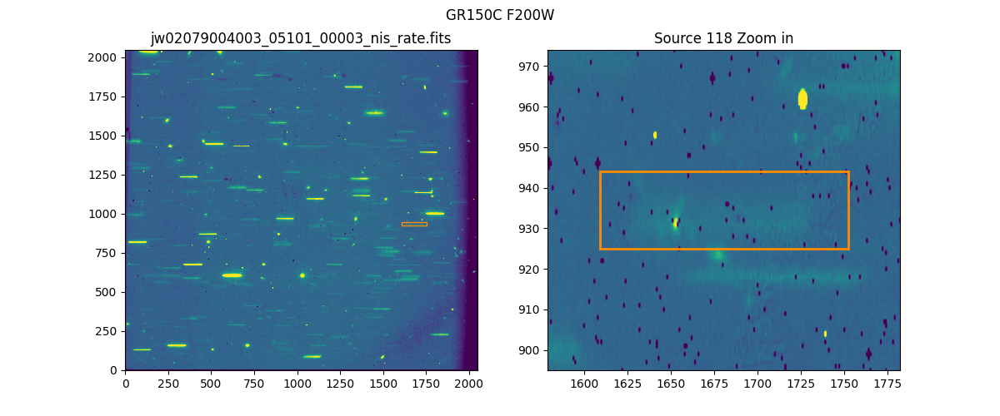

In [26]:
# fill in the nan values from the bad pixels with zero to make it easier to look at
rate_data = rate_hdu[1].data
rate_data[np.isnan(rate_data)] = 0

# extraction box parameters from the header of the cal data:
cal_header = cal_hdu[wh_cal_118].header
sx_left = cal_header['SLTSTRT1']
swidth = cal_header['SLTSIZE1']
sx_right = cal_header['SLTSTRT1'] + swidth
sy_bottom = cal_header['SLTSTRT2']
sheight = cal_header['SLTSIZE2']
sy_top = cal_header['SLTSTRT2'] + sheight

# plot the rate file and the extraction box
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(rate_data, origin='lower', vmin=0.2, vmax=1, aspect='auto') # the scaling may need some adjustment
ax2.imshow(rate_data, origin='lower', vmin=0.2, vmax=1, aspect='auto') # the scaling may need some adjustment

rectangle = patches.Rectangle((sx_left, sy_bottom), swidth, sheight, edgecolor='darkorange', facecolor="None", linewidth=1)
ax1.add_patch(rectangle)
ax1.set_title(rate_file)

rectangle2 = patches.Rectangle((sx_left, sy_bottom), swidth, sheight, edgecolor='darkorange', facecolor="None", linewidth=2)
ax2.add_patch(rectangle2)
ax2.set_xlim(sx_left-30, sx_right+30)
ax2.set_ylim(sy_bottom-30, sy_top+30)
ax2.set_title(f'Source {source_id} Zoom in')

plt.suptitle(f"{cal_hdu[0].header['FILTER']} {cal_hdu[0].header['PUPIL']}")

We can then take a look at the extracted spectrum in this box both in the cal file and the x1d file. In the extracted spectrum below you can see the [OII] and H$\beta$ emission lines from the galaxy.

*Note: The upturned edge effects seen in the 1-D spectrum are due to interpolation at the edges of the extraction box for the current flux calibration. This is also part of an ongoing calibration effort.*

*Additional note: The default units of flux from the pipeline are in Jansky. However, in these extracted spectra we show units of erg/s/cm^2/Angstrom. To turn this off, set `convert=False` in `plot_cutout_and_spectrum`*

In [27]:
def Fnu_to_Flam(wave_micron, flux_jansky):
    # convert Jansky flux units to erg/s/cm^2/Angstrom with an input wavelength in microns
    f_lambda = 1E-19 * flux_jansky * (const.c.value) / (wave_micron**2) # erg/s/cm^2/Angstom
    return f_lambda

In [28]:
def plot_cutout_and_spectrum(cal_data, x1d_data, cal_file, x1d_file, source_id, convert=True):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    
    # plot the cal image
    ax1.imshow(cal_data, origin='lower', vmin=0, vmax=np.nanmax(cal_data)*.01, aspect='auto')
    ax1.set_title(os.path.basename(cal_file))
    
    # plot the spectrum
    wave = x1d_data['WAVELENGTH'].ravel()
    flux = x1d_data['FLUX'].ravel()

    if convert:
        flux = Fnu_to_Flam(wave, flux)
        fluxunit = 'egs/s/cm^2/Angstrom'
    else:
        fluxunit = 'Jy'

    ax2.plot(wave, flux)
    ax2.set_title(os.path.basename(x1d_file))

    edge_buffer = int(len(flux) * .25)
    max_flux = np.nanmax(flux[edge_buffer:edge_buffer*-1])
    ax2.set_ylim(0,  max_flux+(max_flux*0.1)) # cutting the flux of the edges & adding 10% buffer to the limits
    ax2.set_xlabel('Wavelength (Microns)')
    ax2.set_ylabel(f'Flux ({fluxunit})')

    if fits.getval(cal_file, 'FILTER') == 'GR150C':
        ax1.set_xlabel('X Pixels (<--- dispersion direction)')
        ax1.set_ylabel('Y Pixels')
    else:
        ax1.set_xlabel('X Pixels')
        ax1.set_ylabel('Y Pixels (<--- dispersion direction)')        
    
    plt.suptitle(f"{fits.getval(cal_file, 'FILTER')} {fits.getval(cal_file, 'PUPIL')} Source {source_id}", x=0.5, y=1)

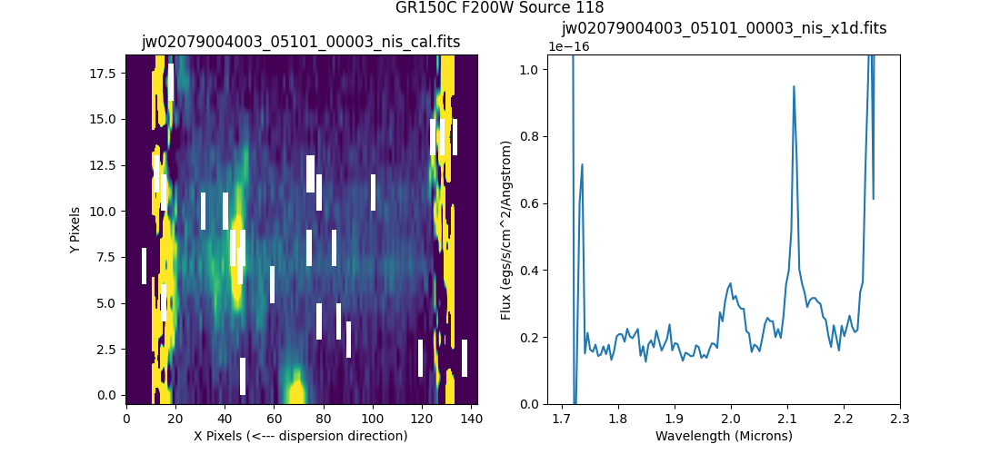

In [29]:
plot_cutout_and_spectrum(cal_data_118, x1d_data_118, cal_file, x1d_file, source_id)

<a id="limit_source"></a>
### Limit the Number of Extracted Sources

Because it takes so long to extract so many sources, let's see if we can pair down the number of sources being extracted. We'll do this with parameter inputs (for bright point sources) and with a further refined source catalog.

#### Limit Extraction Using Parameter Inputs
For this calibration, we are explicitly calling out parameters the following step:
- `extract_2d` where we are setting `wfss_nbright` which limits the number of bright sources that are extracted and `wfss_mmag_extract` which sets a limit on the faintest magnitude we want extracted. [Further Reading](https://jwst-pipeline.readthedocs.io/en/latest/jwst/extract_2d/main.html#nircam-and-niriss-wfss)

In this case, we'll limit the extractions to only the 10 brightest objects.

In [30]:
# check if the calibrated file already exists
asn_data = json.load(open(spec2_asns[0]))
x1d_file = os.path.join(param_outdir, f"{asn_data['products'][0]['name']}_x1d.fits")

if os.path.exists(x1d_file):
    print(x1d_file, ': x1d file already exists.')
else:
    spec2 = Spec2Pipeline.call(spec2_asns[0],
                               steps={'extract_2d': {'wfss_nbright': 10}, },
                               save_results=True,
                               output_dir=param_outdir)

2024-06-07 13:57:49,829 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:57:49,854 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:57:49,876 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:57:49,878 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:57:49,879 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:57:49,880 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:57:49,881 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:57:49,883 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:57:49,884 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:57:49,887 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:57:49,888 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:49,889 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:57:49,890 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:57:49,891 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:49,892 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:57:49,893 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:57:49,895 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:57:49,896 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:57:49,897 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:57:49,898 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:57:49,899 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:57:49,900 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:57:49,901 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:57:49,902 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:57:49,903 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:57:49,906 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:57:49,908 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:57:49,910 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:57:50,778 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00001_asn.json',).


2024-06-07 13:57:50,807 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: parameter_input_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      ou

2024-06-07 13:57:50,870 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_05101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:57:50,875 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:57:50,875 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:57:50,876 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:57:50,876 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:57:50,877 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:57:50,877 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:57:50,878 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:57:50,879 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:57:50,880 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:57:50,880 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:57:50,881 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:57:50,881 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:57:50,882 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:57:50,883 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits'.


2024-06-07 13:57:50,883 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:57:50,884 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:57:50,884 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:57:50,884 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:57:50,885 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:57:50,885 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:57:50,886 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:57:50,886 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:57:50,887 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:57:50,887 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:57:50,890 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:57:50,890 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:57:50,890 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:57:50,891 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:57:50,891 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:57:50,892 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:57:50,892 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:57:50,893 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf'.


2024-06-07 13:57:50,893 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:57:50,894 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:57:50,895 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:57:50,896 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits'.


2024-06-07 13:57:50,897 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:57:50,904 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_05101_00003_nis


2024-06-07 13:57:50,904 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_05101_00003_nis_rate.fits ...


2024-06-07 13:57:50,954 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:57:50,955 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:57:50,956 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:57:51,266 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:51,555 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 13:57:51,639 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:51,752 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:57:51,754 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:57:51,925 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:57:51,962 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:57:52,279 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:52,280 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:57:52,583 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:52,584 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:57:52,895 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:57:52,896 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:57:53,203 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:57:53,226 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits


2024-06-07 13:57:53,227 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:57:53,282 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:57:53,405 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 1 order: 1


2024-06-07 13:57:53,435 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 5 order: 1


2024-06-07 13:57:53,456 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 7 order: 1


2024-06-07 13:57:53,542 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 16 order: 1


2024-06-07 13:57:53,725 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 36 order: 1


2024-06-07 13:57:54,229 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 99 order: 1


2024-06-07 13:57:54,493 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 133 order: 1


2024-06-07 13:57:54,532 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 139 order: 1


2024-06-07 13:57:54,804 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 171 order: 1


2024-06-07 13:57:54,844 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 175 order: 1


2024-06-07 13:57:54,893 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:57:54,903 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 182 order: 1


2024-06-07 13:57:54,979 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 190 order: 1


2024-06-07 13:57:55,159 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 216 order: 1


2024-06-07 13:57:55,590 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 276 order: 1


2024-06-07 13:57:55,600 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 277 order: 1


2024-06-07 13:57:55,620 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 234 grism objects defined


2024-06-07 13:57:55,970 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.4448824697571393


2024-06-07 13:57:55,974 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:57:56,314 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:56,401 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits


2024-06-07 13:57:56,401 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:57:56,402 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:57:56,402 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:57:56,647 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:57:56,965 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:57:56,981 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:57:56,993 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:57:57,118 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 1 order: 1


2024-06-07 13:57:57,156 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 5 order: 1


2024-06-07 13:57:57,182 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 7 order: 1


2024-06-07 13:57:57,301 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 16 order: 1


2024-06-07 13:57:57,538 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 36 order: 1


2024-06-07 13:57:58,211 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 99 order: 1


2024-06-07 13:57:58,562 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 133 order: 1


2024-06-07 13:57:58,613 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 139 order: 1


2024-06-07 13:57:58,987 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 171 order: 1


2024-06-07 13:57:59,037 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 175 order: 1


2024-06-07 13:57:59,096 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:57:59,110 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 182 order: 1


2024-06-07 13:57:59,226 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 190 order: 1


2024-06-07 13:57:59,459 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 216 order: 1


2024-06-07 13:58:00,013 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 276 order: 1


2024-06-07 13:58:00,027 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 277 order: 1


2024-06-07 13:58:00,058 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 10 grism objects defined


2024-06-07 13:58:00,063 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


2024-06-07 13:58:00,064 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 10 grism objects


2024-06-07 13:58:00,200 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 75 order: 1:


2024-06-07 13:58:00,200 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:524, xmax:722), (ymin:567, ymax:646)


2024-06-07 13:58:00,446 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 278 order: 1:


2024-06-07 13:58:00,447 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:41, xmax:231), (ymin:2030, ymax:2040)


2024-06-07 13:58:00,688 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 14 order: 1:


2024-06-07 13:58:00,689 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:213, xmax:391), (ymin:131, ymax:184)


2024-06-07 13:58:00,934 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 268 order: 1:


2024-06-07 13:58:00,935 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1714, xmax:1888), (ymin:971, ymax:1036)


2024-06-07 13:58:01,183 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 99 order: 1:


2024-06-07 13:58:01,183 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:157), (ymin:798, ymax:841)


2024-06-07 13:58:01,433 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 208 order: 1:


2024-06-07 13:58:01,434 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1347, xmax:1552), (ymin:1613, ymax:1678)


2024-06-07 13:58:01,681 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 188 order: 1:


2024-06-07 13:58:01,682 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:427, xmax:613), (ymin:1426, ymax:1468)


2024-06-07 13:58:02,327 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 89 order: 1:


2024-06-07 13:58:02,328 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:313, xmax:479), (ymin:660, ymax:695)


2024-06-07 13:58:02,569 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 121 order: 1:


2024-06-07 13:58:02,570 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:851, xmax:1010), (ymin:925, ymax:1003)


2024-06-07 13:58:02,824 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 273 order: 1:


2024-06-07 13:58:02,825 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:294, xmax:453), (ymin:1214, ymax:1255)


2024-06-07 13:58:03,260 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:03,267 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:03,631 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:03,639 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:03,640 - stpipe.Spec2Pipeline.srctype - INFO - source_id=75, type=EXTENDED


2024-06-07 13:58:03,641 - stpipe.Spec2Pipeline.srctype - INFO - source_id=278, type=POINT


2024-06-07 13:58:03,642 - stpipe.Spec2Pipeline.srctype - INFO - source_id=14, type=EXTENDED


2024-06-07 13:58:03,642 - stpipe.Spec2Pipeline.srctype - INFO - source_id=268, type=EXTENDED


2024-06-07 13:58:03,643 - stpipe.Spec2Pipeline.srctype - INFO - source_id=99, type=EXTENDED


2024-06-07 13:58:03,644 - stpipe.Spec2Pipeline.srctype - INFO - source_id=208, type=EXTENDED


2024-06-07 13:58:03,645 - stpipe.Spec2Pipeline.srctype - INFO - source_id=188, type=EXTENDED


2024-06-07 13:58:03,645 - stpipe.Spec2Pipeline.srctype - INFO - source_id=89, type=EXTENDED


2024-06-07 13:58:03,646 - stpipe.Spec2Pipeline.srctype - INFO - source_id=121, type=EXTENDED


2024-06-07 13:58:03,647 - stpipe.Spec2Pipeline.srctype - INFO - source_id=273, type=EXTENDED


2024-06-07 13:58:03,648 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:03,993 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:03,994 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:58:04,338 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:04,339 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:58:04,678 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:04,679 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:58:05,016 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:05,017 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:58:05,358 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:05,359 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:58:05,700 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:05,728 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:58:05,729 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:58:06,327 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:58:06,328 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:58:06,328 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:58:06,329 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:58:06,329 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:58:06,347 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:58:06,348 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:58:06,352 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 75, order 1


2024-06-07 13:58:06,353 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,357 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 278, order 1


2024-06-07 13:58:06,358 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,362 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 14, order 1


2024-06-07 13:58:06,363 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,367 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 268, order 1


2024-06-07 13:58:06,367 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,372 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 99, order 1


2024-06-07 13:58:06,373 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,377 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 208, order 1


2024-06-07 13:58:06,377 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,382 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 188, order 1


2024-06-07 13:58:06,382 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,386 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 89, order 1


2024-06-07 13:58:06,387 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,391 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 121, order 1


2024-06-07 13:58:06,391 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,395 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 273, order 1


2024-06-07 13:58:06,397 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:06,402 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:58:06,766 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:06,767 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:58:07,650 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from parameter_input_calibrated/jw02079004003_05101_00003_nis_cal.fits>,).


2024-06-07 13:58:07,785 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:58:07,797 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:58:07,824 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 75


2024-06-07 13:58:07,825 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:07,827 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=198, ystart=0, ystop=79


2024-06-07 13:58:07,892 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 278


2024-06-07 13:58:07,893 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=190, ystart=0, ystop=10


2024-06-07 13:58:07,953 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:58:08,074 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 14


2024-06-07 13:58:08,075 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,077 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=178, ystart=0, ystop=53


2024-06-07 13:58:08,141 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 268


2024-06-07 13:58:08,142 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,143 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=174, ystart=0, ystop=65


2024-06-07 13:58:08,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 99


2024-06-07 13:58:08,209 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,211 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=157, ystart=0, ystop=43


2024-06-07 13:58:08,273 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 208


2024-06-07 13:58:08,274 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,276 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=205, ystart=0, ystop=65


2024-06-07 13:58:08,341 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 188


2024-06-07 13:58:08,342 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,344 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=186, ystart=0, ystop=42


2024-06-07 13:58:08,408 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 89


2024-06-07 13:58:08,409 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,410 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=166, ystart=0, ystop=35


2024-06-07 13:58:08,475 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 121


2024-06-07 13:58:08,475 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,477 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=78


2024-06-07 13:58:08,540 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 273


2024-06-07 13:58:08,541 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:08,543 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=159, ystart=0, ystop=41


2024-06-07 13:58:08,923 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in parameter_input_calibrated/jw02079004003_05101_00003_nis_x1d.fits


2024-06-07 13:58:08,924 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:58:08,924 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_05101_00003_nis


2024-06-07 13:58:08,926 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:58:08,926 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:58:09,994 - stpipe.Spec2Pipeline - INFO - Saved model in parameter_input_calibrated/jw02079004003_05101_00003_nis_cal.fits


2024-06-07 13:58:09,994 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


In [31]:
# open the x1d to examine how many sources were extracted
x1ds = glob.glob(os.path.join(param_outdir, '*x1d.fits*'))
with fits.open(x1ds[0]) as temp_x1d:
    print(f'The x1d file has {len(temp_x1d)-2} extracted sources')

The x1d file has 10 extracted sources


#### Limit Extraction Using the Source Catalog
In the last notebook we limited the catalog a couple of different ways. Here, let's limit the catalog to a specific magnitude range, and then use that new catalog to extract the data.

In [32]:
source_match_cats = np.sort(glob.glob('*source-match_cat.ecsv'))
source_match_cat = Table.read(source_cat)

# look at the possible magnitude ranges to look at
mags = cat['isophotal_vegamag']
min_vegmag = mags.min()
max_vegmag = mags.max()
print(f"Magnitude range: {min_vegmag} -  {max_vegmag}")

# source 118 should have a Vega mag of ~21.68
source_id = 118
source_mag = source_match_cat[source_match_cat['label'] == source_id]['isophotal_vegamag'][0]
print(f"Magnitude for source in previous notebook (source {source_id}) : {source_mag}")

Magnitude range: 16.807408531814602 -  23.391334279594304
Magnitude for source in previous notebook (source 118) : 21.187874405404454


In [33]:
# find the catalog for how many sources are between a specific magnitude (21.18 to make sure to include our example source)
min_mag = 21.1
max_mag = 21.2
mag_cat = source_match_cat[(source_match_cat['isophotal_vegamag'] >= min_mag) & (source_match_cat['isophotal_vegamag'] <= max_mag)]

mag_cat['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
61,1707.9152,698.4336,"53.14778735673547,-27.777016220708354",True,22.834403,21.145561
118,1884.9410,1105.8847,"53.15448382098334,-27.771507053932087",True,22.876716,21.187874
168,1635.6684,1404.2944,"53.16198324600842,-27.773979545668706",True,22.798009,21.109167
181,275.9721,1501.9624,"53.17319530602644,-27.79673805601646",True,22.844190,21.155348
189,1954.4414,1614.1534,"53.16387283248776,-27.767233113338857",False,22.834361,21.145519
252,904.0798,722.7042,"53.15376389689458,-27.790674370388835",True,22.819120,21.130278


In [34]:
mag_source_ext = 'mag-limit_cat.ecsv'

new_cat = Table(mag_cat) # turn the row instance into a dataframe again

# save the new catalog with a unique name
new_cat_name = source_cat.replace('cat.ecsv', mag_source_ext)
new_cat.write(new_cat_name, overwrite=True)
print('Saved:', new_cat_name)

Saved: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


Once we have a source catalog that we've limited to specific sources, let's match the remaining catalogs to those sources

In [35]:
for cat_name in source_match_cats:

    if cat_name == source_cat:
        # the base one has already been saved
        continue

    # match the source IDs between the current catalog and the base catalog above
    cat = Table.read(cat_name)
    cat.add_index('label')
    new_cat = cat.loc[list(mag_cat['label'])]

    # check to ensure the sources are all there
    print(repr(new_cat['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']))
    
    # save the new catalog with a unique name
    new_cat_name = cat_name.replace('cat.ecsv', mag_source_ext)
    new_cat.write(new_cat_name, overwrite=True)
    print('Saved:', new_cat_name)
    print()

<Table length=6>
label xcentroid ycentroid ... is_extended isophotal_abmag isophotal_vegamag
                          ...                                              
int64  float64   float64  ...     bool        float64          float64     
----- --------- --------- ... ----------- --------------- -----------------
   61 1557.9390  544.2569 ...       False       23.275578         22.511001
  118 1734.8784  951.5311 ...        True       23.427316         22.662739
  168 1485.4698 1250.0310 ...        True       22.760066         21.995489
  181  126.6692 1347.6798 ...        True       22.971025         22.206448
  189 1804.4356 1460.0093 ...       False       22.647510         21.882933
  252  754.2525  567.9827 ...        True       23.305126         22.540549


Saved: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv

<Table length=6>
label xcentroid ycentroid ... is_extended isophotal_abmag isophotal_vegamag
                          ...                                              
int64  float64   float64  ...     bool        float64          float64     
----- --------- --------- ... ----------- --------------- -----------------
   61 1611.3364  600.9759 ...       False       23.013741         21.816214
  118 1788.5141 1008.3014 ...        True       22.882449         21.684922
  168 1539.1447 1306.9287 ...        True       22.854437         21.656910
  181  178.7200 1404.9587 ...        True       23.025066         21.827539
  189 1857.8353 1516.7363 ...       False       22.666687         21.469160
  252  807.4883  624.9301 ...        True       23.109502         21.911975


Saved: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv



Once the new catalogs have been made, we have to update the association files to use the new catalogs. **Note: the association files will need to be updated again if you want to calibrate again with the previous source catalogs**

In [36]:
new_source_ext = mag_source_ext

# loop through all of the spec2 association files in the current directory
for asn in spec2_asns:
    asn_data = json.load(open(asn))
    for product in asn_data['products']: # for every product, check the members        
        for member in product['members']: # there are multiple members per product
            if member['exptype'] == 'sourcecat':
                cat_in_asn = member['expname']
                # check that we haven't already updated the source catalog name
                if new_source_ext not in cat_in_asn:
                    new_cat = cat_in_asn.replace('cat.ecsv', new_source_ext)
                    # actually update the association file member
                    if os.path.exists(new_cat):
                        member['expname'] = new_cat
                    else:
                        print(f"{new_cat} does not exist in the currenty working directory")

    # write out the new association file
    with open(asn, 'w', encoding='utf-8') as f:
        json.dump(asn_data, f, ensure_ascii=False, indent=4)

In [37]:
# double check that the source catalog has been changed
for spec2_asn in spec2_asns:
    asn_check = json.load(open(spec2_asn))
    for product in asn_check['products']:
        for key, value in product.items():
            if key == 'members':
                for member in value:
                    if member['exptype'] == 'sourcecat':
                        print(f"    {member['exptype']}: {member['expname']}")
            else:
                print(f"{key}: {value}")

name: jw02079004003_05101_00003_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004003_05101_00002_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004003_05101_00001_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004003_03101_00003_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004003_03101_00002_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004003_03101_00001_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv
name: jw02079004002_11101_00003_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv
name: jw02079004002_11101_00002_nis
    sourcecat: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv
name: jw02079004002_11101_00001_nis
    

Now when we calibrate everything, for a single file it should take a lot less time because there are a limited number of sources. However, we will calibrate all of the files in this visit, so this cell might take a bit of time to run.

In [38]:
# calibrate with the new source catalog
for spec2_asn in spec2_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(spec2_asn))
    x1d_file = os.path.join(source_outdir, f"{asn_data['products'][0]['name']}_x1d.fits")
    
    if os.path.exists(x1d_file):
        print(x1d_file, ': x1d file already exists.')
    else:
        spec2 = Spec2Pipeline.call(spec2_asn, save_results=True, output_dir=source_outdir)

2024-06-07 13:58:10,388 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:58:10,412 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:58:10,434 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:58:10,436 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:58:10,437 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:58:10,437 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:58:10,439 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:58:10,439 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:58:10,441 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:58:10,443 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:58:10,444 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:10,445 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:10,447 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:10,448 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:10,449 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:58:10,450 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:10,451 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:58:10,452 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:58:10,454 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:58:10,455 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:58:10,456 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:10,457 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:10,458 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:58:10,460 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:10,460 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:58:10,462 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:58:10,464 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:58:10,465 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:58:11,069 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00001_asn.json',).


2024-06-07 13:58:11,099 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:58:11,164 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_05101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:58:11,168 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:58:11,169 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:58:11,169 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:58:11,170 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:58:11,170 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:58:11,171 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:58:11,171 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:58:11,171 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:58:11,172 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:58:11,173 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:58:11,174 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:58:11,174 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:58:11,174 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:58:11,175 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits'.


2024-06-07 13:58:11,176 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:58:11,176 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:58:11,176 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:58:11,177 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:58:11,178 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:58:11,178 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:58:11,178 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:58:11,179 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:58:11,179 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:58:11,180 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:58:11,180 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:58:11,181 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:58:11,181 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:58:11,182 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:58:11,182 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:58:11,182 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:58:11,183 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:58:11,184 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf'.


2024-06-07 13:58:11,184 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:58:11,184 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:58:11,185 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:58:11,185 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits'.


2024-06-07 13:58:11,187 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:58:11,195 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_05101_00003_nis


2024-06-07 13:58:11,196 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_05101_00003_nis_rate.fits ...


2024-06-07 13:58:11,248 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:11,249 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:58:11,249 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:58:11,465 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:11,765 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 13:58:11,848 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:11,965 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:58:11,966 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:58:12,140 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:12,178 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:58:12,402 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:12,403 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:58:12,612 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:12,613 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:58:12,827 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:58:12,828 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:58:13,046 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>, []).


2024-06-07 13:58:13,070 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits


2024-06-07 13:58:13,071 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:58:13,128 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:13,221 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:58:13,242 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:58:13,605 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.4474857095058849


2024-06-07 13:58:13,610 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:58:13,835 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:13,917 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits


2024-06-07 13:58:13,918 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:58:13,919 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:58:13,919 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:58:14,142 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:58:14,377 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:14,394 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:58:14,408 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:14,514 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:58:14,547 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:58:14,547 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:14,548 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:58:14,682 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:58:14,683 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1356, xmax:1502), (ymin:1220, ymax:1237)


2024-06-07 13:58:14,933 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:58:14,934 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:624, xmax:766), (ymin:536, ymax:557)


2024-06-07 13:58:15,179 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:58:15,179 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1680, xmax:1817), (ymin:1434, ymax:1444)


2024-06-07 13:58:15,435 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:58:15,436 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1433, xmax:1571), (ymin:518, ymax:534)


2024-06-07 13:58:15,682 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:58:15,683 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:144), (ymin:1309, ymax:1327)


2024-06-07 13:58:15,926 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:58:15,927 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1608, xmax:1750), (ymin:924, ymax:942)


2024-06-07 13:58:16,534 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:16,539 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:16,785 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:16,793 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:16,794 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:58:16,795 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:58:16,796 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:58:16,796 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:58:16,797 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:58:16,798 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:58:16,799 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:17,040 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:17,041 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:58:17,284 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:17,285 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:58:17,524 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:17,525 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:58:17,767 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:17,767 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:58:18,008 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:18,009 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:58:18,245 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:18,274 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:58:18,274 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:58:18,703 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:58:18,704 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:58:18,704 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:58:18,705 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:58:18,706 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:58:18,723 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:58:18,724 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:58:18,727 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:58:18,727 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,732 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:58:18,733 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,737 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:58:18,737 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,741 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:58:18,742 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,745 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:58:18,746 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,749 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:58:18,750 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:18,755 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:58:19,008 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_05101_00003_nis_rate.fits>,).


2024-06-07 13:58:19,009 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:58:19,637 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_05101_00003_nis_cal.fits>,).


2024-06-07 13:58:19,772 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:58:19,783 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:58:19,811 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:58:19,812 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:19,813 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=17


2024-06-07 13:58:19,878 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:58:19,879 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:19,881 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=21


2024-06-07 13:58:19,944 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:58:19,946 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=137, ystart=0, ystop=10


2024-06-07 13:58:20,005 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:58:20,094 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:58:20,095 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:20,097 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=16


2024-06-07 13:58:20,159 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:58:20,160 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:20,162 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=144, ystart=0, ystop=18


2024-06-07 13:58:20,225 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:58:20,225 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:20,227 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=18


2024-06-07 13:58:20,514 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00003_nis_x1d.fits


2024-06-07 13:58:20,514 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:58:20,515 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_05101_00003_nis


2024-06-07 13:58:20,516 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:58:20,517 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:58:21,229 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00003_nis_cal.fits


2024-06-07 13:58:21,230 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:58:21,296 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:58:21,322 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:58:21,343 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:58:21,345 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:58:21,346 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:58:21,347 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:58:21,348 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:58:21,349 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:58:21,350 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:58:21,353 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:58:21,354 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:21,355 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:21,356 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:21,356 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:21,357 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:58:21,360 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:21,361 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:58:21,362 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:58:21,363 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:58:21,364 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:58:21,365 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:21,366 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:21,367 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:58:21,368 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:21,369 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:58:21,370 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:58:21,372 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:58:21,373 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:58:21,709 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00002_asn.json',).


2024-06-07 13:58:21,738 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:58:21,802 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_05101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:58:21,806 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:58:21,807 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:58:21,808 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:58:21,809 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:58:21,809 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:58:21,810 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:58:21,810 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:58:21,810 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:58:21,811 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:58:21,812 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:58:21,813 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:58:21,813 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:58:21,813 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:58:21,814 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits'.


2024-06-07 13:58:21,815 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:58:21,815 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:58:21,815 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:58:21,816 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:58:21,816 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:58:21,817 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:58:21,817 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:58:21,817 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:58:21,818 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:58:21,818 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:58:21,818 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:58:21,819 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:58:21,821 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:58:21,821 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:58:21,821 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:58:21,822 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:58:21,822 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:58:21,823 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf'.


2024-06-07 13:58:21,823 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:58:21,823 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:58:21,825 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:58:21,826 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits'.


2024-06-07 13:58:21,827 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:58:21,834 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_05101_00002_nis


2024-06-07 13:58:21,835 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_05101_00002_nis_rate.fits ...


2024-06-07 13:58:21,885 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:21,886 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:58:21,887 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:58:22,098 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:22,401 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282763888806


2024-06-07 13:58:22,482 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:22,604 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:58:22,606 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:58:22,781 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:22,823 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:58:23,044 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:23,045 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:58:23,259 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:23,260 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:58:23,480 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>, []).


2024-06-07 13:58:23,480 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:58:23,695 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>, []).


2024-06-07 13:58:23,719 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits


2024-06-07 13:58:23,719 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:58:23,775 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:23,888 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:58:24,255 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.44643736360432923


2024-06-07 13:58:24,260 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:58:24,482 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:24,568 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits


2024-06-07 13:58:24,569 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:58:24,570 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:58:24,570 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:58:24,793 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:58:25,020 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:25,037 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:58:25,049 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:25,185 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:58:25,185 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:25,186 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:58:25,320 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:58:25,321 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1373, xmax:1519), (ymin:1256, ymax:1272)


2024-06-07 13:58:25,566 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:58:25,566 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:641, xmax:783), (ymin:571, ymax:592)


2024-06-07 13:58:25,809 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:58:25,810 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1698, xmax:1834), (ymin:1470, ymax:1480)


2024-06-07 13:58:26,051 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:58:26,052 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1450, xmax:1588), (ymin:553, ymax:569)


2024-06-07 13:58:26,293 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:58:26,294 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:6, xmax:161), (ymin:1345, ymax:1362)


2024-06-07 13:58:26,822 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:58:26,823 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1625, xmax:1768), (ymin:959, ymax:977)


2024-06-07 13:58:27,139 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:27,144 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:27,390 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:27,398 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:27,399 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:58:27,400 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:58:27,401 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:58:27,401 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:58:27,402 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:58:27,403 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:58:27,404 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:27,632 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:27,633 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:58:27,859 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:27,860 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:58:28,086 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:28,086 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:58:28,321 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:28,322 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:58:28,556 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:28,556 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:58:28,797 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:28,824 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:58:28,824 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:58:29,239 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:58:29,239 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:58:29,240 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:58:29,240 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:58:29,241 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:58:29,259 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:58:29,260 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:58:29,262 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:58:29,264 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,268 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:58:29,269 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,273 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:58:29,274 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,277 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:58:29,278 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,282 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:58:29,283 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,287 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:58:29,287 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:29,293 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:58:29,547 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_05101_00002_nis_rate.fits>,).


2024-06-07 13:58:29,548 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:58:30,179 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_05101_00002_nis_cal.fits>,).


2024-06-07 13:58:30,313 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:58:30,323 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:58:30,351 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:58:30,352 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:30,353 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=16


2024-06-07 13:58:30,416 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:58:30,417 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:30,419 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=21


2024-06-07 13:58:30,481 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:58:30,483 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=136, ystart=0, ystop=10


2024-06-07 13:58:30,542 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:58:30,631 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:58:30,632 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:30,634 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=16


2024-06-07 13:58:30,696 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:58:30,697 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:30,698 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=155, ystart=0, ystop=17


2024-06-07 13:58:30,761 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:58:30,762 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:30,764 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=143, ystart=0, ystop=18


2024-06-07 13:58:31,039 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00002_nis_x1d.fits


2024-06-07 13:58:31,040 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:58:31,040 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_05101_00002_nis


2024-06-07 13:58:31,042 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:58:31,042 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:58:31,751 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00002_nis_cal.fits


2024-06-07 13:58:31,752 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:58:31,819 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:58:31,843 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:58:31,865 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:58:31,866 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:58:31,867 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:58:31,869 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:58:31,870 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:58:31,870 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:58:31,872 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:58:31,875 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:58:31,876 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:31,877 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:31,879 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:31,880 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:31,881 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:58:31,883 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:31,883 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:58:31,885 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:58:31,886 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:58:31,887 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:58:31,888 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:31,889 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:31,891 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:58:31,892 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:31,893 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:58:31,894 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:58:31,896 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:58:31,898 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:58:32,212 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00003_asn.json',).


2024-06-07 13:58:32,241 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:58:32,304 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_05101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:58:32,308 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:58:32,309 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:58:32,309 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:58:32,310 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:58:32,310 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:58:32,310 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:58:32,311 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:58:32,311 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:58:32,312 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:58:32,312 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:58:32,313 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:58:32,313 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:58:32,314 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:58:32,314 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits'.


2024-06-07 13:58:32,314 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:58:32,315 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:58:32,315 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:58:32,315 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:58:32,316 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:58:32,316 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:58:32,317 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:58:32,317 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:58:32,317 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:58:32,318 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:58:32,318 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:58:32,318 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:58:32,319 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:58:32,320 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:58:32,320 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:58:32,320 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:58:32,321 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:58:32,321 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0051.asdf'.


2024-06-07 13:58:32,322 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:58:32,323 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:58:32,323 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:58:32,323 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits'.


2024-06-07 13:58:32,324 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:58:32,333 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_05101_00001_nis


2024-06-07 13:58:32,333 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_05101_00001_nis_rate.fits ...


2024-06-07 13:58:32,383 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:32,384 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:58:32,385 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:58:32,578 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:32,871 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 13:58:32,952 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:33,066 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:58:33,068 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:58:33,240 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:33,282 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:58:33,502 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:33,503 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:58:33,713 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:33,714 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:58:33,918 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>, []).


2024-06-07 13:58:33,918 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:58:34,115 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>, []).


2024-06-07 13:58:34,138 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0021.fits


2024-06-07 13:58:34,139 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:58:34,195 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:34,291 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:58:34,311 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:58:34,681 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.44730144785835285


2024-06-07 13:58:34,685 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:58:34,907 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:34,989 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0265.fits


2024-06-07 13:58:34,990 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:58:34,991 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:58:34,991 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:58:35,217 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:58:35,445 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:35,461 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:58:35,473 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:35,581 - stpipe.Spec2Pipeline.extract_2d - INFO - Partial order on detector for obj: 181 order: 1


2024-06-07 13:58:35,612 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:58:35,613 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:35,614 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:58:35,750 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:58:35,751 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1365, xmax:1511), (ymin:1238, ymax:1255)


2024-06-07 13:58:35,997 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:58:35,998 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:632, xmax:774), (ymin:553, ymax:574)


2024-06-07 13:58:36,240 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:58:36,241 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1689, xmax:1826), (ymin:1452, ymax:1462)


2024-06-07 13:58:36,483 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:58:36,483 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1442, xmax:1580), (ymin:536, ymax:552)


2024-06-07 13:58:36,725 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:58:36,726 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:0, xmax:152), (ymin:1327, ymax:1344)


2024-06-07 13:58:37,252 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:58:37,253 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1617, xmax:1759), (ymin:941, ymax:959)


2024-06-07 13:58:37,564 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:37,569 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:37,809 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:37,818 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:37,819 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:58:37,820 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:58:37,820 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:58:37,821 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:58:37,822 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:58:37,823 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:58:37,824 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:38,070 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:38,071 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:58:38,308 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:38,309 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:58:38,553 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:38,553 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:58:38,817 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:38,818 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:58:39,042 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:39,043 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:58:39,263 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:39,290 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:58:39,290 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:58:39,697 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:58:39,698 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:58:39,698 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:58:39,699 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:58:39,699 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:58:39,717 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:58:39,717 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:58:39,720 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:58:39,721 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,725 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:58:39,726 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,730 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:58:39,731 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,734 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:58:39,735 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,738 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:58:39,739 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,743 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:58:39,744 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.0105


2024-06-07 13:58:39,749 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:58:40,000 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_05101_00001_nis_rate.fits>,).


2024-06-07 13:58:40,001 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:58:40,612 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_05101_00001_nis_cal.fits>,).


2024-06-07 13:58:40,746 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:58:40,756 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:58:40,783 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:58:40,784 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:40,785 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=146, ystart=0, ystop=17


2024-06-07 13:58:40,848 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:58:40,848 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:40,850 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=21


2024-06-07 13:58:40,912 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:58:40,914 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=137, ystart=0, ystop=10


2024-06-07 13:58:40,971 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:58:41,058 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:58:41,059 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:41,060 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=138, ystart=0, ystop=16


2024-06-07 13:58:41,123 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:58:41,124 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:41,125 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=152, ystart=0, ystop=17


2024-06-07 13:58:41,187 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:58:41,188 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:41,189 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=142, ystart=0, ystop=18


2024-06-07 13:58:41,463 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00001_nis_x1d.fits


2024-06-07 13:58:41,463 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:58:41,464 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_05101_00001_nis


2024-06-07 13:58:41,465 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:58:41,465 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:58:42,161 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_05101_00001_nis_cal.fits


2024-06-07 13:58:42,161 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:58:42,226 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:58:42,250 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:58:42,271 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:58:42,272 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:58:42,273 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:58:42,274 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:58:42,275 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:58:42,276 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:58:42,277 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:58:42,280 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:58:42,281 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:42,282 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:42,282 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:42,283 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:42,284 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:58:42,285 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:42,286 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:58:42,287 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:58:42,288 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:58:42,289 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:58:42,290 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:42,292 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:42,293 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:58:42,294 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:42,296 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:58:42,297 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:58:42,299 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:58:42,301 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:58:42,615 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00004_asn.json',).


2024-06-07 13:58:42,645 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:58:42,708 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_03101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:58:42,713 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits   67.1 M bytes  (1 / 3 files) (0 / 138.5 M bytes)


2024-06-07 13:58:43,437 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0052.asdf   27.5 K bytes  (2 / 3 files) (67.1 M / 138.5 M bytes)


2024-06-07 13:58:43,489 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits   71.3 M bytes  (3 / 3 files) (67.2 M / 138.5 M bytes)


2024-06-07 13:58:44,234 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:58:44,236 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:58:44,236 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:58:44,237 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:58:44,237 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:58:44,238 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:58:44,239 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:58:44,239 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:58:44,239 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:58:44,240 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:58:44,241 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:58:44,241 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:58:44,242 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:58:44,242 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits'.


2024-06-07 13:58:44,243 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:58:44,243 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:58:44,244 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:58:44,244 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:58:44,244 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:58:44,245 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:58:44,245 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:58:44,246 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:58:44,246 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:58:44,246 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:58:44,247 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:58:44,247 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:58:44,247 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:58:44,248 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:58:44,248 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:58:44,249 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:58:44,249 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:58:44,249 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0052.asdf'.


2024-06-07 13:58:44,250 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:58:44,250 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:58:44,251 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:58:44,251 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits'.


2024-06-07 13:58:44,253 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:58:44,263 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_03101_00003_nis


2024-06-07 13:58:44,263 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_03101_00003_nis_rate.fits ...


2024-06-07 13:58:44,313 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:44,314 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:58:44,314 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:58:44,504 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:44,780 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282763888806


2024-06-07 13:58:44,864 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:44,973 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:58:44,975 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:58:45,146 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:45,182 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:58:45,394 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:45,395 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:58:45,599 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:45,600 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:58:45,810 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>, []).


2024-06-07 13:58:45,811 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:58:46,013 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>, []).


2024-06-07 13:58:46,036 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits


2024-06-07 13:58:46,036 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:58:46,093 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:46,206 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:58:46,549 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.44880062239328244


2024-06-07 13:58:46,553 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:58:46,766 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:46,850 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits


2024-06-07 13:58:46,851 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:58:46,851 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:58:46,852 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:58:47,068 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:58:47,292 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:47,308 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:58:47,320 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:47,452 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:58:47,452 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:47,453 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:58:47,576 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:58:47,577 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1464, xmax:1487), (ymin:1105, ymax:1245)


2024-06-07 13:58:47,807 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:58:47,808 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:732, xmax:752), (ymin:423, ymax:567)


2024-06-07 13:58:48,033 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:58:48,033 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1790, xmax:1800), (ymin:1317, ymax:1453)


2024-06-07 13:58:48,257 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:58:48,258 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1540, xmax:1556), (ymin:404, ymax:543)


2024-06-07 13:58:48,482 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:58:48,483 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:100, xmax:132), (ymin:1194, ymax:1335)


2024-06-07 13:58:48,708 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:58:48,709 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1715, xmax:1735), (ymin:808, ymax:949)


2024-06-07 13:58:49,296 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:49,301 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:49,531 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:49,540 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:49,541 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:58:49,541 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:58:49,542 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:58:49,543 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:58:49,544 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:58:49,544 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:58:49,545 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:49,776 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:49,777 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:58:49,999 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:49,999 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:58:50,221 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:50,222 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:58:50,438 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:50,439 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:58:50,674 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:50,675 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:58:50,915 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:50,943 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:58:50,943 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:58:51,351 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:58:51,352 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:58:51,352 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:58:51,353 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 13:58:51,353 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:58:51,371 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:58:51,372 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:58:51,375 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:58:51,376 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,380 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:58:51,381 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,384 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:58:51,385 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,389 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:58:51,390 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,394 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:58:51,395 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,399 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:58:51,400 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:58:51,406 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:58:51,660 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_03101_00003_nis_rate.fits>,).


2024-06-07 13:58:51,661 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:58:52,268 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_03101_00003_nis_cal.fits>,).


2024-06-07 13:58:52,396 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:58:52,407 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:58:52,434 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:58:52,434 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:52,436 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=23, ystart=0, ystop=140


2024-06-07 13:58:52,499 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:58:52,500 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:52,502 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=144


2024-06-07 13:58:52,563 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:58:52,565 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=136


2024-06-07 13:58:52,624 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:58:52,710 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:58:52,711 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:52,713 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=16, ystart=0, ystop=139


2024-06-07 13:58:52,776 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:58:52,776 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:52,778 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=32, ystart=0, ystop=141


2024-06-07 13:58:52,840 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:58:52,841 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:58:52,843 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=141


2024-06-07 13:58:53,119 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00003_nis_x1d.fits


2024-06-07 13:58:53,119 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:58:53,120 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_03101_00003_nis


2024-06-07 13:58:53,121 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:58:53,122 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:58:53,811 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00003_nis_cal.fits


2024-06-07 13:58:53,812 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:58:53,878 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:58:53,903 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:58:53,924 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:58:53,926 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:58:53,927 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:58:53,928 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:58:53,929 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:58:53,930 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:58:53,931 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:58:53,934 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:58:53,936 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:53,938 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:53,939 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:53,940 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:53,940 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:58:53,942 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:58:53,943 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:58:53,944 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:58:53,945 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:58:53,946 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:58:53,947 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:58:53,948 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:58:53,950 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:58:53,951 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:58:53,953 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:58:53,954 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:58:53,955 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:58:53,957 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:58:54,249 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00005_asn.json',).


2024-06-07 13:58:54,279 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:58:54,343 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_03101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:58:54,347 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:58:54,348 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:58:54,348 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:58:54,349 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:58:54,349 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:58:54,349 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:58:54,350 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:58:54,350 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:58:54,351 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:58:54,351 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:58:54,351 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:58:54,352 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:58:54,352 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:58:54,353 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits'.


2024-06-07 13:58:54,353 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:58:54,354 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:58:54,354 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:58:54,354 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:58:54,355 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:58:54,355 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:58:54,355 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:58:54,356 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:58:54,356 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:58:54,357 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:58:54,357 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:58:54,357 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:58:54,358 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:58:54,358 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:58:54,359 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:58:54,359 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:58:54,360 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:58:54,360 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0052.asdf'.


2024-06-07 13:58:54,360 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:58:54,361 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:58:54,361 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:58:54,361 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits'.


2024-06-07 13:58:54,363 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:58:54,375 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_03101_00002_nis


2024-06-07 13:58:54,376 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_03101_00002_nis_rate.fits ...


2024-06-07 13:58:54,425 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:54,426 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:58:54,426 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:58:54,625 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:54,904 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282763888806


2024-06-07 13:58:54,988 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:55,097 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:58:55,098 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:58:55,269 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:58:55,306 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:58:55,513 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:55,513 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:58:55,707 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:55,708 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:58:55,900 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>, []).


2024-06-07 13:58:55,901 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:58:56,103 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>, []).


2024-06-07 13:58:56,129 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits


2024-06-07 13:58:56,129 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:58:56,185 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:56,298 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:58:56,637 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.4491444126006325


2024-06-07 13:58:56,641 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:58:56,845 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:56,927 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits


2024-06-07 13:58:56,928 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:58:56,928 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:58:56,929 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:58:57,141 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:58:57,346 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:57,363 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:58:57,376 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:57,507 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:58:57,508 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:58:57,508 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:58:57,632 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:58:57,633 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1482, xmax:1505), (ymin:1140, ymax:1280)


2024-06-07 13:58:57,858 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:58:57,859 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:750, xmax:769), (ymin:458, ymax:602)


2024-06-07 13:58:58,092 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:58:58,093 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1807, xmax:1817), (ymin:1352, ymax:1488)


2024-06-07 13:58:58,323 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:58:58,324 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1557, xmax:1573), (ymin:439, ymax:578)


2024-06-07 13:58:58,549 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:58:58,550 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:117, xmax:149), (ymin:1229, ymax:1371)


2024-06-07 13:58:58,781 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:58:58,782 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1732, xmax:1752), (ymin:844, ymax:985)


2024-06-07 13:58:59,364 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:58:59,369 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:58:59,602 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:59,611 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:58:59,612 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:58:59,612 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:58:59,613 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:58:59,614 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:58:59,615 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:58:59,615 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:58:59,616 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:58:59,859 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:58:59,860 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:00,097 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:00,097 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:00,319 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:00,320 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:00,552 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:00,552 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:00,783 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:00,783 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:01,022 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:01,050 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:01,051 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:01,460 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:01,461 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:01,461 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:01,462 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 13:59:01,462 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:59:01,481 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:01,481 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:01,484 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:01,485 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,489 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:01,489 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,493 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:01,494 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,498 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:01,499 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,503 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:01,503 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,507 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:01,508 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:01,513 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:01,772 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_03101_00002_nis_rate.fits>,).


2024-06-07 13:59:01,773 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:02,398 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_03101_00002_nis_cal.fits>,).


2024-06-07 13:59:02,524 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:02,535 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:02,562 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:02,562 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:02,564 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=23, ystart=0, ystop=140


2024-06-07 13:59:02,628 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:02,629 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:02,630 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=144


2024-06-07 13:59:02,693 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:02,695 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=136


2024-06-07 13:59:02,753 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:02,841 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:02,842 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:02,844 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=16, ystart=0, ystop=139


2024-06-07 13:59:02,906 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:02,906 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:02,908 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=32, ystart=0, ystop=142


2024-06-07 13:59:02,975 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:02,975 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:02,977 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=141


2024-06-07 13:59:03,253 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00002_nis_x1d.fits


2024-06-07 13:59:03,253 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:03,254 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_03101_00002_nis


2024-06-07 13:59:03,255 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:03,256 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:03,939 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00002_nis_cal.fits


2024-06-07 13:59:03,939 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:04,006 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:04,031 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:04,052 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:04,053 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:04,055 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:04,056 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:04,057 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:04,058 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:04,059 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:04,062 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:04,064 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:04,065 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:04,066 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:04,067 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:04,068 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:04,069 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:04,070 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:04,071 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:04,072 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:04,073 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:04,074 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:04,075 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:04,076 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:04,077 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:04,078 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:04,079 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:04,081 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:04,082 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:04,393 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00006_asn.json',).


2024-06-07 13:59:04,421 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:04,485 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_03101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:04,489 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:04,490 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:04,491 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:04,491 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:04,492 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:04,492 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:04,492 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:04,494 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:04,494 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-06-07 13:59:04,495 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:04,496 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:04,496 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:04,497 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:04,497 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits'.


2024-06-07 13:59:04,498 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:04,499 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:04,499 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:04,500 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:04,500 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:04,501 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:04,501 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:04,502 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:04,502 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:04,503 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:04,503 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:04,504 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:04,504 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:04,506 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:04,506 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:04,507 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:04,507 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:04,508 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0052.asdf'.


2024-06-07 13:59:04,509 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:04,509 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:04,510 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:04,510 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits'.


2024-06-07 13:59:04,512 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:04,518 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004003_03101_00001_nis


2024-06-07 13:59:04,518 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004003_03101_00001_nis_rate.fits ...


2024-06-07 13:59:04,568 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:04,569 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-06-07 13:59:04,570 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-06-07 13:59:04,759 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:05,037 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282763888806


2024-06-07 13:59:05,118 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:59:05,226 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:05,228 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:05,399 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-06-07 13:59:05,436 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:05,653 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:05,654 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:05,867 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:05,867 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:06,069 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>, []).


2024-06-07 13:59:06,070 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:06,263 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>, []).


2024-06-07 13:59:06,287 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0027.fits


2024-06-07 13:59:06,288 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:06,346 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:06,459 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:06,819 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.44867108360398644


2024-06-07 13:59:06,824 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:07,038 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:07,121 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0271.fits


2024-06-07 13:59:07,122 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:07,122 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:07,123 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:07,337 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:07,563 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:07,580 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:07,592 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:07,725 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:07,726 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f200w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:07,727 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:07,855 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:07,856 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1473, xmax:1496), (ymin:1122, ymax:1262)


2024-06-07 13:59:08,089 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:59:08,090 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:741, xmax:760), (ymin:440, ymax:585)


2024-06-07 13:59:08,318 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:08,319 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1798, xmax:1808), (ymin:1334, ymax:1471)


2024-06-07 13:59:08,550 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:08,551 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1548, xmax:1564), (ymin:422, ymax:560)


2024-06-07 13:59:08,784 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:08,785 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:109, xmax:140), (ymin:1212, ymax:1353)


2024-06-07 13:59:09,017 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:09,017 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1724, xmax:1744), (ymin:826, ymax:967)


2024-06-07 13:59:09,629 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:59:09,634 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:59:09,889 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:09,898 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:59:09,898 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:59:09,899 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:59:09,900 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:59:09,901 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=EXTENDED


2024-06-07 13:59:09,901 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:59:09,902 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:59:09,903 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:59:10,156 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:10,157 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:10,407 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:10,407 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:10,655 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:10,655 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:10,885 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:10,886 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:11,125 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:11,125 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:11,345 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:11,373 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:11,373 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:11,776 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:11,777 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:11,777 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:11,778 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 13:59:11,779 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F200W


2024-06-07 13:59:11,796 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:11,796 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:11,799 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:11,800 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,804 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:11,805 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,808 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:11,809 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,814 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:11,814 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,818 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:11,819 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,822 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:11,823 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 49.086


2024-06-07 13:59:11,828 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:12,087 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004003_03101_00001_nis_rate.fits>,).


2024-06-07 13:59:12,088 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:12,708 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004003_03101_00001_nis_cal.fits>,).


2024-06-07 13:59:12,838 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:12,849 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:12,876 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:12,877 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:12,879 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=23, ystart=0, ystop=140


2024-06-07 13:59:12,942 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:12,942 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:12,944 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=145


2024-06-07 13:59:13,005 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:13,007 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=137


2024-06-07 13:59:13,064 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:13,152 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:13,152 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:13,154 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=16, ystart=0, ystop=138


2024-06-07 13:59:13,217 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:13,217 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:13,219 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=31, ystart=0, ystop=141


2024-06-07 13:59:13,281 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:13,281 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:13,283 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=141


2024-06-07 13:59:13,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00001_nis_x1d.fits


2024-06-07 13:59:13,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:13,557 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004003_03101_00001_nis


2024-06-07 13:59:13,558 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:13,559 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:14,232 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004003_03101_00001_nis_cal.fits


2024-06-07 13:59:14,233 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:14,301 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:14,326 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:14,348 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:14,350 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:14,351 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:14,352 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:14,353 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:14,354 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:14,355 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:14,359 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:14,360 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:14,362 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:14,363 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:14,364 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:14,365 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:14,366 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:14,367 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:14,368 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:14,370 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:14,371 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:14,372 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:14,373 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:14,374 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:14,375 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:14,376 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:14,378 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:14,379 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:14,381 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:14,728 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00007_asn.json',).


2024-06-07 13:59:14,758 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:14,831 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_11101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:14,836 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf    9.9 K bytes  (1 / 4 files) (0 / 138.5 M bytes)


2024-06-07 13:59:14,890 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits   67.1 M bytes  (2 / 4 files) (9.9 K / 138.5 M bytes)


2024-06-07 13:59:15,591 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0043.asdf   20.6 K bytes  (3 / 4 files) (67.1 M / 138.5 M bytes)


2024-06-07 13:59:15,653 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits   71.3 M bytes  (4 / 4 files) (67.2 M / 138.5 M bytes)


2024-06-07 13:59:16,495 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:16,495 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:16,496 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:16,496 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:16,497 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:16,497 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:16,498 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:16,498 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:16,498 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:59:16,500 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:16,501 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:16,501 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:16,501 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:16,502 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits'.


2024-06-07 13:59:16,503 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:16,503 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:16,503 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:16,504 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:16,504 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:16,504 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:16,505 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:16,505 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:16,506 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:16,506 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:16,506 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:16,507 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:16,509 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:16,509 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:16,510 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:16,510 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:16,511 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:16,511 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0043.asdf'.


2024-06-07 13:59:16,512 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:16,513 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:16,513 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:16,513 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits'.


2024-06-07 13:59:16,515 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:16,522 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_11101_00003_nis


2024-06-07 13:59:16,522 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_11101_00003_nis_rate.fits ...


2024-06-07 13:59:16,573 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:16,573 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 13:59:16,574 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 13:59:16,776 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:17,009 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282914638152


2024-06-07 13:59:17,089 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:17,194 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:17,196 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:17,367 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:17,404 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:17,609 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:17,610 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:17,812 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:17,813 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:18,012 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>, []).


2024-06-07 13:59:18,013 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:18,205 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>, []).


2024-06-07 13:59:18,229 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits


2024-06-07 13:59:18,229 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:18,285 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:18,397 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:18,748 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6114327540815162


2024-06-07 13:59:18,753 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:18,958 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:19,042 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits


2024-06-07 13:59:19,042 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:19,043 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:19,044 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:19,245 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:19,457 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:19,473 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:19,485 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:19,622 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:19,623 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:19,623 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:19,728 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:19,729 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1705, xmax:1808), (ymin:1427, ymax:1437)


2024-06-07 13:59:19,922 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:19,922 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1381, xmax:1492), (ymin:1214, ymax:1230)


2024-06-07 13:59:20,115 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:20,116 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1633, xmax:1741), (ymin:917, ymax:934)


2024-06-07 13:59:20,311 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:20,312 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1457, xmax:1561), (ymin:513, ymax:523)


2024-06-07 13:59:20,506 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:20,506 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:15, xmax:133), (ymin:1304, ymax:1320)


2024-06-07 13:59:20,700 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:59:20,701 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:648, xmax:756), (ymin:530, ymax:549)


2024-06-07 13:59:20,954 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:59:20,959 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:59:21,252 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:21,261 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:59:21,262 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:59:21,263 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:59:21,264 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:59:21,264 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 13:59:21,265 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:59:21,266 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:59:21,267 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:59:21,511 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:21,512 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:21,749 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:21,750 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:22,002 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:22,002 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:22,237 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:22,238 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:22,467 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:22,468 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:22,680 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:22,706 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:22,707 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:23,074 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:23,075 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:23,075 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:23,076 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:59:23,076 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:59:23,096 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:23,096 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:23,099 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:23,100 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,104 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:23,105 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,109 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:23,109 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,113 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:23,114 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,117 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:23,118 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,121 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:23,122 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:23,127 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:23,361 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_11101_00003_nis_rate.fits>,).


2024-06-07 13:59:23,362 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:23,937 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_11101_00003_nis_cal.fits>,).


2024-06-07 13:59:24,053 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:24,064 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:24,092 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:24,093 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=103, ystart=0, ystop=10


2024-06-07 13:59:24,148 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:24,222 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:24,223 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:24,225 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=111, ystart=0, ystop=16


2024-06-07 13:59:24,284 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:24,285 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:24,287 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=17


2024-06-07 13:59:24,346 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:24,348 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=104, ystart=0, ystop=10


2024-06-07 13:59:24,403 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:24,470 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:24,471 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:24,473 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=118, ystart=0, ystop=16


2024-06-07 13:59:24,532 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:24,533 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:24,535 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 13:59:24,804 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00003_nis_x1d.fits


2024-06-07 13:59:24,805 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:24,805 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_11101_00003_nis


2024-06-07 13:59:24,807 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:24,807 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:25,451 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00003_nis_cal.fits


2024-06-07 13:59:25,452 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:25,519 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:25,543 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:25,565 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:25,567 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:25,568 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:25,570 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:25,570 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:25,572 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:25,573 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:25,576 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:25,577 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:25,578 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:25,579 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:25,580 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:25,582 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:25,584 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:25,585 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:25,586 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:25,587 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:25,588 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:25,589 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:25,590 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:25,591 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:25,593 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:25,594 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:25,596 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:25,597 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:25,599 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:25,911 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00008_asn.json',).


2024-06-07 13:59:25,941 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:26,005 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_11101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:26,009 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:26,010 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:26,011 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:26,011 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:26,012 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:26,012 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:26,012 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:26,013 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:26,013 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:59:26,014 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:26,014 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:26,014 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:26,015 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:26,016 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits'.


2024-06-07 13:59:26,017 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:26,017 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:26,018 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:26,018 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:26,019 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:26,019 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:26,019 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:26,020 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:26,020 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:26,020 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:26,021 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:26,021 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:26,023 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:26,023 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:26,024 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:26,024 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:26,024 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:26,025 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0043.asdf'.


2024-06-07 13:59:26,025 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:26,026 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:26,026 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:26,027 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits'.


2024-06-07 13:59:26,028 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:26,036 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_11101_00002_nis


2024-06-07 13:59:26,036 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_11101_00002_nis_rate.fits ...


2024-06-07 13:59:26,086 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:26,087 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 13:59:26,088 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 13:59:26,283 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:26,518 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282895627726


2024-06-07 13:59:26,603 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:26,701 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:26,703 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:26,877 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:26,919 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:27,121 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:27,121 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:27,322 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:27,323 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:27,517 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>, []).


2024-06-07 13:59:27,518 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:27,703 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>, []).


2024-06-07 13:59:27,727 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits


2024-06-07 13:59:27,728 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:27,783 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:27,896 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:28,223 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6113418017009391


2024-06-07 13:59:28,227 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:28,431 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:28,514 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits


2024-06-07 13:59:28,514 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:28,515 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:28,515 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:28,709 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:28,922 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:28,938 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:28,950 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:29,088 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:29,089 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:29,089 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:29,192 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:29,192 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1722, xmax:1825), (ymin:1462, ymax:1472)


2024-06-07 13:59:29,383 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:29,384 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1399, xmax:1510), (ymin:1249, ymax:1266)


2024-06-07 13:59:29,576 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:29,577 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1650, xmax:1759), (ymin:952, ymax:969)


2024-06-07 13:59:29,769 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:29,769 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1475, xmax:1578), (ymin:548, ymax:558)


2024-06-07 13:59:29,962 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:29,962 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:33, xmax:150), (ymin:1339, ymax:1355)


2024-06-07 13:59:30,155 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:59:30,155 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:666, xmax:773), (ymin:565, ymax:585)


2024-06-07 13:59:30,410 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:59:30,415 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:59:30,673 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:30,682 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:59:30,683 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:59:30,683 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:59:30,684 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:59:30,685 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 13:59:30,685 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:59:30,686 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:59:30,688 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:59:30,915 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:30,915 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:31,143 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:31,144 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:31,366 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:31,367 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:31,586 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:31,586 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:31,806 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:31,806 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:32,021 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:32,048 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:32,048 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:32,423 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:32,424 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:32,424 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:32,424 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:59:32,425 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:59:32,444 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:32,444 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:32,447 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:32,448 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,451 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:32,452 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,456 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:32,456 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,460 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:32,461 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,464 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:32,465 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,469 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:32,469 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:32,474 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:32,722 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_11101_00002_nis_rate.fits>,).


2024-06-07 13:59:32,723 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:33,289 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_11101_00002_nis_cal.fits>,).


2024-06-07 13:59:33,405 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:33,416 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:33,443 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:33,445 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=103, ystart=0, ystop=10


2024-06-07 13:59:33,501 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:33,569 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:33,570 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:33,571 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=111, ystart=0, ystop=17


2024-06-07 13:59:33,632 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:33,632 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:33,634 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=109, ystart=0, ystop=17


2024-06-07 13:59:33,695 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:33,696 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=103, ystart=0, ystop=10


2024-06-07 13:59:33,753 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:33,821 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:33,822 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:33,823 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=117, ystart=0, ystop=16


2024-06-07 13:59:33,883 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:33,884 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:33,885 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=107, ystart=0, ystop=20


2024-06-07 13:59:34,152 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00002_nis_x1d.fits


2024-06-07 13:59:34,152 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:34,153 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_11101_00002_nis


2024-06-07 13:59:34,154 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:34,155 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:34,793 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00002_nis_cal.fits


2024-06-07 13:59:34,793 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:34,859 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:34,884 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:34,905 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:34,907 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:34,908 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:34,909 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:34,910 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:34,911 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:34,912 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:34,915 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:34,917 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:34,918 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:34,919 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:34,920 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:34,921 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:34,922 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:34,923 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:34,925 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:34,926 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:34,928 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:34,929 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:34,930 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:34,931 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:34,932 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:34,933 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:34,934 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:34,936 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:34,938 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:35,239 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00009_asn.json',).


2024-06-07 13:59:35,268 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:35,332 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_11101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:35,336 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:35,336 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:35,337 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:35,337 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:35,338 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:35,338 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:35,339 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:35,339 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:35,339 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:59:35,340 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:35,341 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:35,341 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:35,342 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:35,342 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits'.


2024-06-07 13:59:35,343 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:35,343 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:35,344 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:35,344 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:35,344 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:35,345 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:35,345 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:35,346 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:35,346 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:35,346 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:35,347 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:35,347 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:35,348 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:35,348 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:35,348 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:35,349 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:35,349 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:35,350 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0043.asdf'.


2024-06-07 13:59:35,352 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:35,352 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:35,353 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:35,353 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits'.


2024-06-07 13:59:35,354 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:35,361 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_11101_00001_nis


2024-06-07 13:59:35,361 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_11101_00001_nis_rate.fits ...


2024-06-07 13:59:35,412 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:35,412 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 13:59:35,413 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 13:59:35,616 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:35,852 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282876950816


2024-06-07 13:59:35,933 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:36,031 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:36,032 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:36,208 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:36,246 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:36,449 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:36,450 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:36,639 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:36,640 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:36,835 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>, []).


2024-06-07 13:59:36,835 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:37,035 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>, []).


2024-06-07 13:59:37,060 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0025.fits


2024-06-07 13:59:37,061 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:37,119 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:37,233 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:37,572 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6112366030761892


2024-06-07 13:59:37,576 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:37,792 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:37,875 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0262.fits


2024-06-07 13:59:37,876 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:37,877 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:37,877 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:38,073 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:38,300 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:38,317 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:38,329 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:38,466 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:38,467 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:38,467 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:38,572 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:38,574 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1713, xmax:1816), (ymin:1444, ymax:1454)


2024-06-07 13:59:38,768 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:38,769 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1390, xmax:1501), (ymin:1232, ymax:1248)


2024-06-07 13:59:38,963 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:38,964 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1641, xmax:1750), (ymin:934, ymax:952)


2024-06-07 13:59:39,157 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:39,158 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1466, xmax:1569), (ymin:531, ymax:541)


2024-06-07 13:59:39,350 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:39,351 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:24, xmax:142), (ymin:1321, ymax:1338)


2024-06-07 13:59:39,553 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:59:39,553 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:657, xmax:764), (ymin:547, ymax:567)


2024-06-07 13:59:39,806 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:59:39,811 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:59:40,072 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:40,081 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:59:40,082 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:59:40,082 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:59:40,083 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:59:40,084 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 13:59:40,084 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:59:40,085 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:59:40,086 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:59:40,320 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:40,321 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:40,546 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:40,547 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:40,772 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:40,773 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:40,993 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:40,994 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:41,203 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:41,204 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:41,411 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:41,438 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:41,438 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:41,817 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:41,818 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:41,818 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:41,819 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 13:59:41,819 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:59:41,838 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:41,839 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:41,841 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:41,842 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,846 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:41,847 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,850 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:41,851 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,855 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:41,855 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,859 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:41,860 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,863 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:41,864 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 22.832


2024-06-07 13:59:41,869 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:42,107 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_11101_00001_nis_rate.fits>,).


2024-06-07 13:59:42,108 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:42,680 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_11101_00001_nis_cal.fits>,).


2024-06-07 13:59:42,796 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:42,806 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:42,833 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:42,834 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=103, ystart=0, ystop=10


2024-06-07 13:59:42,889 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:42,959 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:42,960 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:42,962 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=111, ystart=0, ystop=16


2024-06-07 13:59:43,021 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:43,022 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:43,024 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=109, ystart=0, ystop=18


2024-06-07 13:59:43,083 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:43,085 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=103, ystart=0, ystop=10


2024-06-07 13:59:43,139 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:43,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:43,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:43,210 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=118, ystart=0, ystop=17


2024-06-07 13:59:43,268 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:43,269 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:43,271 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=107, ystart=0, ystop=20


2024-06-07 13:59:43,544 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00001_nis_x1d.fits


2024-06-07 13:59:43,545 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:43,545 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_11101_00001_nis


2024-06-07 13:59:43,547 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:43,547 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:44,197 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_11101_00001_nis_cal.fits


2024-06-07 13:59:44,198 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:44,264 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:44,289 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:44,310 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:44,311 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:44,312 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:44,313 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:44,314 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:44,315 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:44,316 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:44,319 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:44,319 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:44,320 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:44,321 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:44,322 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:44,323 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:44,326 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:44,327 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:44,328 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:44,329 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:44,330 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:44,331 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:44,332 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:44,333 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:44,334 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:44,335 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:44,337 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:44,338 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:44,340 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:44,667 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00010_asn.json',).


2024-06-07 13:59:44,696 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:44,762 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_09101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:44,766 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits   67.1 M bytes  (1 / 3 files) (0 / 138.5 M bytes)


2024-06-07 13:59:45,602 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0048.asdf   20.6 K bytes  (2 / 3 files) (67.1 M / 138.5 M bytes)


2024-06-07 13:59:45,660 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits   71.3 M bytes  (3 / 3 files) (67.2 M / 138.5 M bytes)


2024-06-07 13:59:46,274 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:46,275 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:46,275 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:46,276 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:46,276 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:46,276 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:46,277 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:46,278 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:46,278 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:59:46,279 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:46,279 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:46,280 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:46,280 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:46,281 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits'.


2024-06-07 13:59:46,281 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:46,282 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:46,282 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:46,283 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:46,283 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:46,283 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:46,284 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:46,284 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:46,284 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:46,285 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:46,285 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:46,285 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:46,286 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:46,286 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:46,287 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:46,287 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:46,288 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:46,288 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0048.asdf'.


2024-06-07 13:59:46,288 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:46,289 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:46,289 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:46,290 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits'.


2024-06-07 13:59:46,292 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:46,299 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_09101_00003_nis


2024-06-07 13:59:46,300 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_09101_00003_nis_rate.fits ...


2024-06-07 13:59:46,350 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:46,351 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 13:59:46,352 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 13:59:46,566 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:46,803 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.999928285794039


2024-06-07 13:59:46,887 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:46,986 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:46,988 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:47,161 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:47,198 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:47,418 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:47,419 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:47,619 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:47,620 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:47,822 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>, []).


2024-06-07 13:59:47,823 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:48,038 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>, []).


2024-06-07 13:59:48,063 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits


2024-06-07 13:59:48,063 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:48,119 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:48,231 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:48,550 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6149810242550581


2024-06-07 13:59:48,555 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:48,770 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:48,854 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits


2024-06-07 13:59:48,854 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:48,855 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:48,855 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:49,051 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:49,272 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:49,288 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:49,301 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:49,441 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:49,442 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:49,443 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:49,547 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:49,548 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1787, xmax:1797), (ymin:1341, ymax:1445)


2024-06-07 13:59:49,742 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:49,743 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1462, xmax:1483), (ymin:1130, ymax:1236)


2024-06-07 13:59:49,937 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:49,937 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1713, xmax:1732), (ymin:834, ymax:940)


2024-06-07 13:59:50,130 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:50,131 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1539, xmax:1549), (ymin:429, ymax:532)


2024-06-07 13:59:50,325 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:50,326 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:96, xmax:124), (ymin:1220, ymax:1325)


2024-06-07 13:59:50,526 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 13:59:50,527 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:728, xmax:746), (ymin:447, ymax:556)


2024-06-07 13:59:50,789 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 13:59:50,794 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 13:59:51,063 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:51,071 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 13:59:51,072 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 13:59:51,073 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 13:59:51,073 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 13:59:51,074 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 13:59:51,075 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 13:59:51,075 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 13:59:51,076 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 13:59:51,304 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:51,306 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 13:59:51,530 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:51,531 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 13:59:51,767 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:51,768 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 13:59:51,991 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:51,991 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 13:59:52,215 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:52,216 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 13:59:52,427 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:52,454 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 13:59:52,455 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 13:59:52,834 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 13:59:52,834 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 13:59:52,835 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 13:59:52,835 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 13:59:52,836 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 13:59:52,855 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 13:59:52,855 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 13:59:52,858 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 13:59:52,859 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,862 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 13:59:52,863 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,867 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 13:59:52,868 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,871 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 13:59:52,872 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,875 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 13:59:52,876 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,880 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 13:59:52,880 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 13:59:52,885 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 13:59:53,129 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_09101_00003_nis_rate.fits>,).


2024-06-07 13:59:53,130 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 13:59:53,707 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_09101_00003_nis_cal.fits>,).


2024-06-07 13:59:53,824 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 13:59:53,834 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 13:59:53,861 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 13:59:53,863 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=104


2024-06-07 13:59:53,917 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:53,985 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 13:59:53,986 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:53,988 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=21, ystart=0, ystop=106


2024-06-07 13:59:54,046 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 13:59:54,047 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:54,048 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=106


2024-06-07 13:59:54,106 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 13:59:54,108 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=103


2024-06-07 13:59:54,163 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 13:59:54,231 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 13:59:54,232 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:54,234 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=105


2024-06-07 13:59:54,293 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 13:59:54,293 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 13:59:54,295 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=18, ystart=0, ystop=109


2024-06-07 13:59:54,565 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00003_nis_x1d.fits


2024-06-07 13:59:54,565 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 13:59:54,566 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_09101_00003_nis


2024-06-07 13:59:54,567 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 13:59:54,568 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 13:59:55,203 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00003_nis_cal.fits


2024-06-07 13:59:55,204 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 13:59:55,270 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 13:59:55,295 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 13:59:55,317 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 13:59:55,318 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 13:59:55,319 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 13:59:55,321 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 13:59:55,321 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 13:59:55,323 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 13:59:55,324 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 13:59:55,327 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 13:59:55,328 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:55,329 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:55,330 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:55,331 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:55,333 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 13:59:55,334 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 13:59:55,335 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 13:59:55,336 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 13:59:55,337 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 13:59:55,339 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 13:59:55,340 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 13:59:55,341 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 13:59:55,342 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 13:59:55,343 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 13:59:55,344 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 13:59:55,346 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 13:59:55,348 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 13:59:55,350 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 13:59:55,647 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00011_asn.json',).


2024-06-07 13:59:55,677 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 13:59:55,741 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_09101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 13:59:55,745 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 13:59:55,746 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 13:59:55,746 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 13:59:55,747 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 13:59:55,747 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 13:59:55,748 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 13:59:55,748 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 13:59:55,748 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 13:59:55,749 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 13:59:55,749 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 13:59:55,750 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 13:59:55,750 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 13:59:55,750 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 13:59:55,751 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits'.


2024-06-07 13:59:55,751 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 13:59:55,752 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 13:59:55,752 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 13:59:55,752 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 13:59:55,753 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 13:59:55,753 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 13:59:55,754 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 13:59:55,754 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 13:59:55,754 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 13:59:55,755 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 13:59:55,755 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 13:59:55,755 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 13:59:55,756 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 13:59:55,756 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 13:59:55,757 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 13:59:55,757 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 13:59:55,757 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 13:59:55,758 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0048.asdf'.


2024-06-07 13:59:55,759 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 13:59:55,759 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 13:59:55,759 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 13:59:55,760 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits'.


2024-06-07 13:59:55,761 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 13:59:55,773 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_09101_00002_nis


2024-06-07 13:59:55,774 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_09101_00002_nis_rate.fits ...


2024-06-07 13:59:55,823 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:55,824 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 13:59:55,824 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 13:59:56,012 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 13:59:56,255 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.999928283926348


2024-06-07 13:59:56,341 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:56,441 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 13:59:56,442 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 13:59:56,619 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 13:59:56,661 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 13:59:56,881 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 13:59:56,882 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 13:59:57,093 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 13:59:57,094 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 13:59:57,303 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>, []).


2024-06-07 13:59:57,304 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 13:59:57,498 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>, []).


2024-06-07 13:59:57,523 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits


2024-06-07 13:59:57,524 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 13:59:57,580 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:57,693 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 13:59:58,010 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6136143390373833


2024-06-07 13:59:58,015 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 13:59:58,232 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 13:59:58,315 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits


2024-06-07 13:59:58,316 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 13:59:58,316 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 13:59:58,317 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 13:59:58,513 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 13:59:58,731 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 13:59:58,747 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 13:59:58,760 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:58,909 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 13:59:58,909 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 13:59:58,910 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 13:59:59,019 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 13:59:59,020 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1804, xmax:1814), (ymin:1377, ymax:1480)


2024-06-07 13:59:59,218 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 13:59:59,219 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1479, xmax:1501), (ymin:1165, ymax:1271)


2024-06-07 13:59:59,409 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 13:59:59,410 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1730, xmax:1750), (ymin:869, ymax:976)


2024-06-07 13:59:59,605 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 13:59:59,606 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1557, xmax:1567), (ymin:464, ymax:567)


2024-06-07 13:59:59,817 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 13:59:59,818 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:113, xmax:142), (ymin:1255, ymax:1361)


2024-06-07 14:00:00,025 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:00,026 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:745, xmax:764), (ymin:482, ymax:591)


2024-06-07 14:00:00,307 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:00,313 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:00,618 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:00,628 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:00,629 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:00,630 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:00,630 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:00,631 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:00,632 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:00,633 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:00,634 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:00,874 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:00,874 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:01,115 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:01,116 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:01,358 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:01,359 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:01,602 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:01,602 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:01,849 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:01,850 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:02,073 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:02,101 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:02,102 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:02,487 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:02,488 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:02,488 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:02,489 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:00:02,489 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 14:00:02,508 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:02,509 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:02,512 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:02,513 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,517 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:02,517 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,521 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:02,522 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,526 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:02,527 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,530 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:02,531 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,535 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:02,536 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:02,541 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:02,797 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_09101_00002_nis_rate.fits>,).


2024-06-07 14:00:02,797 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:03,378 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_09101_00002_nis_cal.fits>,).


2024-06-07 14:00:03,496 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:03,507 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:03,534 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:03,536 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=103


2024-06-07 14:00:03,591 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:03,660 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:03,660 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:03,662 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=22, ystart=0, ystop=106


2024-06-07 14:00:03,725 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:03,726 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:03,728 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=107


2024-06-07 14:00:03,786 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:03,788 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=103


2024-06-07 14:00:03,843 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:03,911 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:03,912 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:03,914 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=29, ystart=0, ystop=106


2024-06-07 14:00:03,974 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:03,974 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:03,976 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=109


2024-06-07 14:00:04,252 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00002_nis_x1d.fits


2024-06-07 14:00:04,252 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:04,253 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_09101_00002_nis


2024-06-07 14:00:04,254 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:04,255 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:04,931 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00002_nis_cal.fits


2024-06-07 14:00:04,932 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:05,002 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:05,028 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:05,049 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:05,051 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:05,052 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:05,053 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:05,054 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:05,055 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:05,056 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:05,059 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:05,060 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:05,061 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:05,062 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:05,063 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:05,064 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:05,066 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:05,067 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:05,068 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:05,069 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:05,070 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:05,071 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:05,073 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:05,074 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:05,075 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:05,076 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:05,078 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:05,079 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:05,081 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:05,382 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00012_asn.json',).


2024-06-07 14:00:05,412 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:05,478 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_09101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:05,482 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:05,483 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:05,484 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:05,484 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:05,485 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:05,485 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:05,486 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:05,486 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:05,488 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-06-07 14:00:05,488 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:05,489 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:05,489 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:05,489 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:05,490 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits'.


2024-06-07 14:00:05,491 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:05,492 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:05,492 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:05,493 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:05,493 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:05,493 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:05,494 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:05,494 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:05,495 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:05,495 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:05,495 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:05,496 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:05,496 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:05,497 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:05,497 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:05,498 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:05,498 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:05,499 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0048.asdf'.


2024-06-07 14:00:05,500 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:05,501 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:05,501 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:05,502 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits'.


2024-06-07 14:00:05,503 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:05,511 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_09101_00001_nis


2024-06-07 14:00:05,513 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_09101_00001_nis_rate.fits ...


2024-06-07 14:00:05,563 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:05,564 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-06-07 14:00:05,565 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-06-07 14:00:05,776 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:06,016 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282826589861


2024-06-07 14:00:06,098 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 14:00:06,198 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:06,199 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:06,372 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-06-07 14:00:06,409 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:06,615 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:06,616 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:06,824 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:06,825 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:07,036 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>, []).


2024-06-07 14:00:07,037 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:07,240 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>, []).


2024-06-07 14:00:07,264 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0016.fits


2024-06-07 14:00:07,264 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:07,322 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:07,434 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:07,759 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6135407691035366


2024-06-07 14:00:07,764 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:07,973 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:08,057 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0281.fits


2024-06-07 14:00:08,057 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:08,058 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:08,059 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:08,254 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:08,472 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:08,489 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:08,501 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:08,637 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:00:08,638 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f150w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:08,639 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:00:08,750 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:00:08,751 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1795, xmax:1805), (ymin:1359, ymax:1462)


2024-06-07 14:00:08,947 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:00:08,948 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1470, xmax:1492), (ymin:1148, ymax:1254)


2024-06-07 14:00:09,144 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:00:09,145 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1721, xmax:1741), (ymin:851, ymax:958)


2024-06-07 14:00:09,339 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:00:09,339 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1548, xmax:1558), (ymin:447, ymax:550)


2024-06-07 14:00:09,535 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:00:09,535 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:104, xmax:133), (ymin:1237, ymax:1343)


2024-06-07 14:00:09,728 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:09,729 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:737, xmax:755), (ymin:465, ymax:573)


2024-06-07 14:00:09,979 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:09,984 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:10,260 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:10,269 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:10,270 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:10,271 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:10,271 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:10,272 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:10,273 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:10,274 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:10,275 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:10,501 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:10,502 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:10,722 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:10,722 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:10,944 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:10,944 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:11,164 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:11,165 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:11,400 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:11,400 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:11,624 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:11,651 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:11,652 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:12,030 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:12,031 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:12,031 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:12,031 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:00:12,032 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F150W


2024-06-07 14:00:12,052 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:12,052 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:12,055 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:12,056 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,060 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:12,061 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,065 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:12,065 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,069 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:12,070 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,073 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:12,074 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,078 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:12,079 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 23.1627


2024-06-07 14:00:12,084 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:12,337 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_09101_00001_nis_rate.fits>,).


2024-06-07 14:00:12,338 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:12,928 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_09101_00001_nis_cal.fits>,).


2024-06-07 14:00:13,045 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:13,055 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:13,083 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:13,085 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=103


2024-06-07 14:00:13,140 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:13,207 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:13,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:13,209 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=22, ystart=0, ystop=106


2024-06-07 14:00:13,271 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:13,272 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:13,274 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=107


2024-06-07 14:00:13,337 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:13,339 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=103


2024-06-07 14:00:13,397 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:13,467 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:13,469 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:13,471 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=29, ystart=0, ystop=106


2024-06-07 14:00:13,533 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:13,534 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:13,536 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=18, ystart=0, ystop=108


2024-06-07 14:00:13,818 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00001_nis_x1d.fits


2024-06-07 14:00:13,819 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:13,819 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_09101_00001_nis


2024-06-07 14:00:13,820 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:13,821 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:14,466 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_09101_00001_nis_cal.fits


2024-06-07 14:00:14,466 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:14,534 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:14,561 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:14,582 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:14,584 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:14,585 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:14,586 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:14,587 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:14,588 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:14,589 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:14,592 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:14,593 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:14,594 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:14,595 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:14,596 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:14,597 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:14,599 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:14,600 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:14,601 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:14,602 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:14,603 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:14,604 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:14,605 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:14,606 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:14,608 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:14,609 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:14,612 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:14,614 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:14,616 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:14,912 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00013_asn.json',).


2024-06-07 14:00:14,942 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:15,008 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_05101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:15,013 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf    9.9 K bytes  (1 / 4 files) (0 / 138.5 M bytes)


2024-06-07 14:00:15,056 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits   67.1 M bytes  (2 / 4 files) (9.9 K / 138.5 M bytes)


2024-06-07 14:00:15,822 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf   20.6 K bytes  (3 / 4 files) (67.1 M / 138.5 M bytes)


2024-06-07 14:00:15,885 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits   71.3 M bytes  (4 / 4 files) (67.2 M / 138.5 M bytes)


2024-06-07 14:00:16,814 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:16,814 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:16,815 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:16,815 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:16,816 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:16,816 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:16,817 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:16,817 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:16,818 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:00:16,818 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:16,819 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:16,819 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:16,819 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:16,820 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:00:16,820 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:16,821 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:16,821 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:16,822 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:16,822 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:16,822 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:16,823 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:16,823 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:16,824 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:16,824 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:16,825 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:16,825 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:16,826 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:16,826 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:16,826 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:16,827 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:16,827 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:16,828 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:00:16,829 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:16,829 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:16,832 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:16,833 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:00:16,834 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:16,841 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_05101_00003_nis


2024-06-07 14:00:16,841 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_05101_00003_nis_rate.fits ...


2024-06-07 14:00:16,891 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:16,892 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:00:16,893 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:00:17,099 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:17,333 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282813916244


2024-06-07 14:00:17,418 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:17,514 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:17,516 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:17,689 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:17,726 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:17,932 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:17,932 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:18,128 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:18,129 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:18,332 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>, []).


2024-06-07 14:00:18,332 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:18,526 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>, []).


2024-06-07 14:00:18,551 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:00:18,552 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:18,607 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:18,719 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:19,034 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6641762062532921


2024-06-07 14:00:19,039 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:19,262 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:19,346 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:00:19,347 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:19,347 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:19,348 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:19,546 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:19,772 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:19,789 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:19,801 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:19,944 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:00:19,945 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:19,945 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:00:20,053 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:00:20,054 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1734, xmax:1824), (ymin:1431, ymax:1441)


2024-06-07 14:00:20,251 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:00:20,252 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1406, xmax:1508), (ymin:1216, ymax:1236)


2024-06-07 14:00:20,450 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:00:20,450 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:43, xmax:151), (ymin:1306, ymax:1325)


2024-06-07 14:00:20,648 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:00:20,649 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1486, xmax:1575), (ymin:517, ymax:527)


2024-06-07 14:00:20,847 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:20,848 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:677, xmax:771), (ymin:534, ymax:553)


2024-06-07 14:00:21,046 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:00:21,047 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1662, xmax:1755), (ymin:921, ymax:938)


2024-06-07 14:00:21,307 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:21,312 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:21,588 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:21,596 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:21,597 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:21,597 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:21,598 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:21,599 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:21,600 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:21,600 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:21,601 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:21,831 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:21,832 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:22,080 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:22,081 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:22,325 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:22,325 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:22,565 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:22,566 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:22,807 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:22,808 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:23,048 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:23,076 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:23,076 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:23,459 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:23,460 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:23,460 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:23,460 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:00:23,461 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:00:23,480 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:23,481 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:23,484 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:23,485 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,489 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:23,490 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,494 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:23,495 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,499 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:23,499 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,503 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:23,503 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,507 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:23,508 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:23,513 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:23,766 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_05101_00003_nis_rate.fits>,).


2024-06-07 14:00:23,766 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:24,357 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_05101_00003_nis_cal.fits>,).


2024-06-07 14:00:24,475 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:24,486 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:24,515 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:24,516 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:00:24,570 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:24,632 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:24,633 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:24,635 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:00:24,693 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:24,693 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:24,695 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:00:24,753 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:24,755 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:00:24,808 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:24,870 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:24,870 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:24,872 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=19


2024-06-07 14:00:24,931 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:24,932 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:24,933 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=93, ystart=0, ystop=17


2024-06-07 14:00:25,207 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00003_nis_x1d.fits


2024-06-07 14:00:25,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:25,208 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_05101_00003_nis


2024-06-07 14:00:25,209 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:25,210 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:25,870 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00003_nis_cal.fits


2024-06-07 14:00:25,870 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:25,943 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:25,969 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:25,990 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:25,992 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:25,993 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:25,994 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:25,995 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:25,996 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:25,998 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:26,000 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:26,001 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:26,002 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:26,004 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:26,005 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:26,006 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:26,007 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:26,008 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:26,009 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:26,010 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:26,011 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:26,012 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:26,013 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:26,015 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:26,016 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:26,017 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:26,018 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:26,020 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:26,022 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:26,311 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00014_asn.json',).


2024-06-07 14:00:26,341 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:26,406 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_05101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:26,410 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:26,411 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:26,411 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:26,412 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:26,412 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:26,413 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:26,413 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:26,413 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:26,414 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:00:26,416 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:26,416 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:26,417 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:26,417 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:26,418 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:00:26,419 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:26,419 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:26,420 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:26,420 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:26,421 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:26,422 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:26,422 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:26,423 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:26,423 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:26,424 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:26,424 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:26,425 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:26,426 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:26,426 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:26,426 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:26,427 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:26,427 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:26,428 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:00:26,428 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:26,429 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:26,430 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:26,431 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:00:26,432 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:26,438 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_05101_00002_nis


2024-06-07 14:00:26,439 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_05101_00002_nis_rate.fits ...


2024-06-07 14:00:26,488 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:26,489 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:00:26,490 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:00:26,689 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:26,928 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282801576141


2024-06-07 14:00:27,010 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:27,110 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:27,111 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:27,285 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:27,323 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:27,537 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:27,538 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:27,749 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:27,749 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:27,962 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>, []).


2024-06-07 14:00:27,963 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:28,176 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>, []).


2024-06-07 14:00:28,199 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:00:28,200 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:28,256 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:28,369 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:28,685 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.662430771916129


2024-06-07 14:00:28,690 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:28,908 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:28,994 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:00:28,994 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:28,995 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:28,996 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:29,188 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:29,410 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:29,426 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:29,438 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:29,580 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:00:29,581 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:29,581 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:00:29,687 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:00:29,688 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1751, xmax:1841), (ymin:1466, ymax:1476)


2024-06-07 14:00:29,883 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:00:29,883 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1424, xmax:1526), (ymin:1251, ymax:1272)


2024-06-07 14:00:30,077 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:00:30,077 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:61, xmax:169), (ymin:1341, ymax:1360)


2024-06-07 14:00:30,272 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:00:30,272 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1503, xmax:1593), (ymin:552, ymax:562)


2024-06-07 14:00:30,468 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:30,468 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:694, xmax:789), (ymin:569, ymax:589)


2024-06-07 14:00:30,661 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:00:30,662 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1679, xmax:1773), (ymin:956, ymax:973)


2024-06-07 14:00:30,924 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:30,929 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:31,220 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:31,229 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:31,230 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:31,231 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:31,231 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:31,232 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:31,233 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:31,234 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:31,235 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:31,471 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:31,472 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:31,711 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:31,711 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:31,956 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:31,956 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:32,199 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:32,199 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:32,439 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:32,440 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:32,682 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:32,710 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:32,711 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:33,097 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:33,097 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:33,098 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:33,098 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:00:33,099 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:00:33,118 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:33,118 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:33,121 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:33,122 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,125 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:33,126 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,130 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:33,130 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,134 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:33,135 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,138 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:33,139 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,143 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:33,144 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:33,149 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:33,396 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_05101_00002_nis_rate.fits>,).


2024-06-07 14:00:33,397 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:33,985 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_05101_00002_nis_cal.fits>,).


2024-06-07 14:00:34,105 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:34,116 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:34,144 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:34,146 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:00:34,200 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:34,262 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:34,263 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:34,265 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=21


2024-06-07 14:00:34,323 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:34,324 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:34,326 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:00:34,385 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:34,386 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:00:34,442 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:34,503 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:34,504 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:34,506 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=95, ystart=0, ystop=20


2024-06-07 14:00:34,564 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:34,564 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:34,566 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=17


2024-06-07 14:00:34,841 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00002_nis_x1d.fits


2024-06-07 14:00:34,842 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:34,843 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_05101_00002_nis


2024-06-07 14:00:34,845 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:34,845 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:35,485 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00002_nis_cal.fits


2024-06-07 14:00:35,486 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:35,553 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:35,578 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:35,600 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:35,601 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:35,602 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:35,603 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:35,604 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:35,605 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:35,606 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:35,609 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:35,610 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:35,611 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:35,613 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:35,614 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:35,615 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:35,616 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:35,617 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:35,618 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:35,619 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:35,620 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:35,622 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:35,623 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:35,624 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:35,625 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:35,626 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:35,628 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:35,629 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:35,631 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:35,935 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00015_asn.json',).


2024-06-07 14:00:35,964 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:36,029 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_05101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:36,033 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:36,033 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:36,034 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:36,035 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:36,035 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:36,036 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:36,037 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:36,037 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:36,038 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:00:36,039 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:36,039 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:36,040 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:36,040 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:36,041 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:00:36,041 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:36,042 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:36,042 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:36,043 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:36,043 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:36,044 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:36,044 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:36,045 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:36,045 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:36,046 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:36,046 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:36,047 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:36,047 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:36,048 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:36,048 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:36,049 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:36,050 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:36,050 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:00:36,050 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:36,055 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:36,055 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:36,056 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:00:36,057 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:36,064 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_05101_00001_nis


2024-06-07 14:00:36,065 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_05101_00001_nis_rate.fits ...


2024-06-07 14:00:36,115 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:36,116 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:00:36,117 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:00:36,317 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:36,552 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282795239334


2024-06-07 14:00:36,639 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:36,738 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:36,739 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:36,912 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:36,949 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:37,162 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:37,162 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:37,376 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:37,377 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:37,575 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>, []).


2024-06-07 14:00:37,576 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:37,779 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>, []).


2024-06-07 14:00:37,804 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:00:37,804 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:37,861 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:37,976 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:38,312 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6622515972054959


2024-06-07 14:00:38,317 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:38,544 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:38,627 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:00:38,628 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:38,628 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:38,629 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:38,824 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:39,036 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:39,052 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:39,064 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:39,203 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:00:39,204 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:39,204 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:00:39,308 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:00:39,309 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1743, xmax:1833), (ymin:1449, ymax:1459)


2024-06-07 14:00:39,502 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:00:39,503 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1415, xmax:1517), (ymin:1234, ymax:1254)


2024-06-07 14:00:39,699 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:00:39,700 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:52, xmax:160), (ymin:1323, ymax:1343)


2024-06-07 14:00:39,896 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:00:39,896 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1495, xmax:1584), (ymin:535, ymax:545)


2024-06-07 14:00:40,091 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:40,092 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:686, xmax:780), (ymin:551, ymax:571)


2024-06-07 14:00:40,286 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:00:40,287 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1670, xmax:1764), (ymin:938, ymax:956)


2024-06-07 14:00:40,540 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:40,544 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:40,821 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:40,830 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:40,831 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:40,832 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:40,832 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:40,833 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:40,834 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:40,835 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:40,836 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:41,062 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:41,063 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:41,282 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:41,283 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:41,534 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:41,534 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:41,748 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:41,749 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:41,962 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:41,962 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:42,185 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:42,212 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:42,212 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:42,585 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:42,586 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:42,587 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:42,587 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:00:42,588 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:00:42,606 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:42,607 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:42,609 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:42,610 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,614 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:42,615 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,619 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:42,620 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,624 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:42,625 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,629 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:42,630 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,633 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:42,634 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:00:42,639 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:42,897 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_05101_00001_nis_rate.fits>,).


2024-06-07 14:00:42,897 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:43,478 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_05101_00001_nis_cal.fits>,).


2024-06-07 14:00:43,594 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:43,605 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:43,632 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:43,634 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:00:43,687 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:43,747 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:43,748 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:43,750 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:00:43,807 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:43,808 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:43,810 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=20


2024-06-07 14:00:43,867 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:43,869 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:00:43,922 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:43,984 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:43,984 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:43,986 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=20


2024-06-07 14:00:44,042 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:44,043 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:44,044 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=18


2024-06-07 14:00:44,315 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00001_nis_x1d.fits


2024-06-07 14:00:44,316 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:44,316 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_05101_00001_nis


2024-06-07 14:00:44,318 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:44,318 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:44,970 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_05101_00001_nis_cal.fits


2024-06-07 14:00:44,971 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:45,042 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:45,069 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:45,092 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:45,094 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:45,095 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:45,096 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:45,097 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:45,098 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:45,099 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:45,103 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:45,104 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:45,105 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:45,107 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:45,108 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:45,109 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:45,110 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:45,112 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:45,113 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:45,114 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:45,115 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:45,116 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:45,118 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:45,119 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:45,120 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:45,121 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:45,123 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:45,124 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:45,126 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:45,432 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00016_asn.json',).


2024-06-07 14:00:45,462 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:45,526 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_03101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:45,530 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits   67.1 M bytes  (1 / 3 files) (0 / 138.5 M bytes)


2024-06-07 14:00:46,263 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf   20.6 K bytes  (2 / 3 files) (67.1 M / 138.5 M bytes)


2024-06-07 14:00:46,312 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits   71.3 M bytes  (3 / 3 files) (67.2 M / 138.5 M bytes)


2024-06-07 14:00:47,030 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:47,031 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:47,031 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:47,032 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:47,032 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:47,033 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:47,033 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:47,034 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:47,034 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:00:47,035 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:47,035 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:47,036 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:47,036 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:47,037 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:00:47,037 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:47,038 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:47,038 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:47,039 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:47,039 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:47,040 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:47,040 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:47,040 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:47,041 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:47,041 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:47,041 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:47,042 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:47,043 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:47,043 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:47,044 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:47,044 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:47,044 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:47,045 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:00:47,046 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:47,046 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:47,047 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:47,047 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:00:47,048 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:47,055 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_03101_00003_nis


2024-06-07 14:00:47,055 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_03101_00003_nis_rate.fits ...


2024-06-07 14:00:47,105 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:47,106 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:00:47,107 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:00:47,319 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:47,557 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282782565716


2024-06-07 14:00:47,640 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:47,739 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:47,741 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:47,915 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:47,952 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:48,169 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:48,169 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:48,382 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:48,382 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:48,595 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>, []).


2024-06-07 14:00:48,596 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:48,802 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>, []).


2024-06-07 14:00:48,827 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:00:48,827 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:48,884 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:48,998 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:49,324 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.661693371666446


2024-06-07 14:00:49,329 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:49,552 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:49,641 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:00:49,641 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:49,642 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:49,642 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:49,843 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:50,068 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:50,085 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:50,097 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:50,241 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:00:50,242 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:50,243 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:00:50,349 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:00:50,349 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1786, xmax:1796), (ymin:1364, ymax:1453)


2024-06-07 14:00:50,547 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:00:50,547 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1457, xmax:1484), (ymin:1150, ymax:1245)


2024-06-07 14:00:50,745 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:00:50,746 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:94, xmax:127), (ymin:1240, ymax:1334)


2024-06-07 14:00:50,942 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:00:50,943 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1539, xmax:1549), (ymin:450, ymax:540)


2024-06-07 14:00:51,141 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:00:51,141 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:727, xmax:747), (ymin:469, ymax:562)


2024-06-07 14:00:51,343 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:00:51,343 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1712, xmax:1731), (ymin:856, ymax:947)


2024-06-07 14:00:51,613 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:00:51,618 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:00:51,903 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:51,913 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:00:51,914 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:00:51,914 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:00:51,915 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:00:51,916 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:00:51,916 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:00:51,917 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:00:51,919 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:00:52,159 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:52,159 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:00:52,395 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:52,396 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:00:52,635 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:52,635 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:00:52,879 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:52,880 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:00:53,115 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:53,116 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:00:53,364 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:53,392 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:00:53,392 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:00:53,780 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:00:53,780 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:00:53,781 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:00:53,782 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:00:53,782 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:00:53,801 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:00:53,802 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:00:53,805 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:00:53,805 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,810 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:00:53,810 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,814 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:00:53,815 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,819 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:00:53,819 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,823 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:00:53,823 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,827 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:00:53,828 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:00:53,833 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:00:54,091 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_03101_00003_nis_rate.fits>,).


2024-06-07 14:00:54,091 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:00:54,695 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_03101_00003_nis_cal.fits>,).


2024-06-07 14:00:54,813 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:00:54,825 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:00:54,852 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:00:54,854 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:00:54,907 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:54,968 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:00:54,969 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:54,970 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=27, ystart=0, ystop=95


2024-06-07 14:00:55,030 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:00:55,030 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:55,032 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=33, ystart=0, ystop=94


2024-06-07 14:00:55,090 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:00:55,092 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=90


2024-06-07 14:00:55,146 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:00:55,207 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:00:55,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:55,210 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:00:55,268 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:00:55,268 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:00:55,270 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=91


2024-06-07 14:00:55,546 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00003_nis_x1d.fits


2024-06-07 14:00:55,547 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:00:55,547 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_03101_00003_nis


2024-06-07 14:00:55,549 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:00:55,550 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:00:56,218 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00003_nis_cal.fits


2024-06-07 14:00:56,218 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:00:56,288 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:00:56,313 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:00:56,334 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:00:56,335 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:00:56,336 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:00:56,337 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:00:56,338 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:00:56,339 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:00:56,341 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:00:56,343 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:00:56,345 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:56,346 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:56,347 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:56,348 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:56,349 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:00:56,350 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:00:56,351 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:00:56,353 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:00:56,354 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:00:56,355 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:00:56,356 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:00:56,357 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:00:56,358 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:00:56,360 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:00:56,361 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:00:56,363 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:00:56,364 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:00:56,369 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:00:56,687 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00017_asn.json',).


2024-06-07 14:00:56,717 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:00:56,781 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_03101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:00:56,785 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:00:56,786 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:00:56,786 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:00:56,787 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:00:56,787 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:00:56,788 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:00:56,788 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:00:56,789 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:00:56,789 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:00:56,790 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:00:56,791 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:00:56,791 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:00:56,792 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:00:56,793 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:00:56,793 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:00:56,793 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:00:56,794 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:00:56,795 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:00:56,795 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:00:56,796 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:00:56,796 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:00:56,796 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:00:56,797 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:00:56,797 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:00:56,798 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:00:56,798 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:00:56,800 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:00:56,800 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:00:56,800 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:00:56,801 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:00:56,801 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:00:56,802 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:00:56,802 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:00:56,803 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:00:56,803 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:00:56,804 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:00:56,806 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:00:56,812 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_03101_00002_nis


2024-06-07 14:00:56,813 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_03101_00002_nis_rate.fits ...


2024-06-07 14:00:56,864 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:56,865 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:00:56,865 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:00:57,070 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:00:57,316 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282782565716


2024-06-07 14:00:57,401 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:57,500 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:00:57,502 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:00:57,683 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:00:57,722 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:00:57,953 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:00:57,954 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:00:58,174 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:00:58,175 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:00:58,391 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>, []).


2024-06-07 14:00:58,391 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:00:58,610 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>, []).


2024-06-07 14:00:58,635 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:00:58,635 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:00:58,697 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:00:58,815 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:00:59,152 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6622716818472435


2024-06-07 14:00:59,157 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:00:59,373 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:00:59,456 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:00:59,457 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:00:59,458 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:00:59,458 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:00:59,657 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:00:59,882 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:00:59,898 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:00:59,910 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:00,047 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:00,048 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:00,048 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:00,153 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:00,154 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1804, xmax:1814), (ymin:1399, ymax:1488)


2024-06-07 14:01:00,349 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:00,350 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1474, xmax:1502), (ymin:1186, ymax:1281)


2024-06-07 14:01:00,545 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:00,546 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:111, xmax:145), (ymin:1275, ymax:1369)


2024-06-07 14:01:00,743 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:00,743 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1556, xmax:1566), (ymin:486, ymax:575)


2024-06-07 14:01:00,942 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:00,943 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:744, xmax:765), (ymin:504, ymax:598)


2024-06-07 14:01:01,144 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:01,145 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1729, xmax:1749), (ymin:891, ymax:983)


2024-06-07 14:01:01,419 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:01,424 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:01,708 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:01,718 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:01,719 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:01,719 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:01,720 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:01,721 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:01,721 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:01,722 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:01,724 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:01,962 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:01,963 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:02,202 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:02,203 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:02,434 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:02,434 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:02,673 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:02,673 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:02,912 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:02,913 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:03,152 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:03,181 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:03,182 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:03,576 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:03,577 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:03,577 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:03,578 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:01:03,578 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:03,597 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:03,597 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:03,600 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:03,601 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,605 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:03,606 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,609 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:03,610 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,613 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:03,614 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,618 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:03,618 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,622 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:03,623 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:03,628 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:03,889 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_03101_00002_nis_rate.fits>,).


2024-06-07 14:01:03,889 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:04,490 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_03101_00002_nis_cal.fits>,).


2024-06-07 14:01:04,609 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:04,620 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:04,649 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:04,651 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:01:04,706 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:04,766 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:04,767 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:04,768 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:01:04,826 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:04,826 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:04,828 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:01:04,885 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:04,886 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:01:04,940 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:04,999 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:05,000 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:05,002 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=21, ystart=0, ystop=94


2024-06-07 14:01:05,059 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:05,059 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:05,061 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=92


2024-06-07 14:01:05,335 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00002_nis_x1d.fits


2024-06-07 14:01:05,336 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:05,337 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_03101_00002_nis


2024-06-07 14:01:05,338 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:05,338 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:06,009 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00002_nis_cal.fits


2024-06-07 14:01:06,009 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:06,076 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:06,102 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:06,124 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:06,126 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:06,127 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:06,128 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:06,129 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:06,129 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:06,130 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:06,133 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:06,134 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:06,136 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:06,136 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:06,137 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:06,138 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:06,140 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:06,140 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:06,141 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:06,142 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:06,143 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:06,144 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:06,145 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:06,146 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:06,147 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:06,148 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:06,150 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:06,151 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:06,153 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:06,459 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00018_asn.json',).


2024-06-07 14:01:06,491 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:06,555 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_03101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:06,559 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:06,559 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:06,560 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:06,561 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:06,562 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:06,562 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:06,563 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:06,563 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:06,564 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:06,564 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:06,566 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:06,566 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:06,567 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:06,568 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:01:06,568 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:06,569 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:06,569 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:06,569 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:06,570 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:06,570 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:06,570 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:06,571 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:06,571 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:06,572 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:06,572 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:06,572 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:06,573 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:06,574 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:06,574 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:06,574 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:06,575 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:06,575 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:01:06,575 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:06,576 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:06,577 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:06,577 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:01:06,578 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:06,589 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004002_03101_00001_nis


2024-06-07 14:01:06,589 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004002_03101_00001_nis_rate.fits ...


2024-06-07 14:01:06,640 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:06,641 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:06,642 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:06,853 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:07,094 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282776228908


2024-06-07 14:01:07,175 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:07,274 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:07,276 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:07,452 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:07,494 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:07,718 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:07,719 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:07,928 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:07,929 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:08,142 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>, []).


2024-06-07 14:01:08,143 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:08,356 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>, []).


2024-06-07 14:01:08,382 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:01:08,382 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:08,443 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:08,554 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:08,890 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6608374725971538


2024-06-07 14:01:08,895 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:09,112 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:09,198 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:01:09,198 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:09,199 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:09,199 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:09,398 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:09,625 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:09,642 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:09,654 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:09,794 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:09,795 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:09,795 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:09,903 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:09,904 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1795, xmax:1805), (ymin:1382, ymax:1471)


2024-06-07 14:01:10,100 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:10,101 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1465, xmax:1493), (ymin:1168, ymax:1263)


2024-06-07 14:01:10,301 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:10,302 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:102, xmax:136), (ymin:1257, ymax:1351)


2024-06-07 14:01:10,508 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:10,509 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1547, xmax:1557), (ymin:468, ymax:557)


2024-06-07 14:01:10,711 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:10,711 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:736, xmax:756), (ymin:487, ymax:580)


2024-06-07 14:01:10,905 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:10,906 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1721, xmax:1740), (ymin:873, ymax:965)


2024-06-07 14:01:11,157 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:11,162 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:11,438 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:11,446 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:11,447 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:11,448 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:11,448 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:11,449 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:11,450 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:11,452 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:11,453 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:11,686 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:11,687 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:11,920 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:11,921 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:12,134 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:12,134 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:12,357 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:12,358 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:12,599 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:12,599 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:12,831 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:12,858 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:12,858 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:13,240 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:13,240 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:13,241 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:13,241 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:01:13,241 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:13,261 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:13,261 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:13,264 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:13,264 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,268 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:13,269 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,273 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:13,274 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,277 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:13,278 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,281 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:13,282 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,286 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:13,286 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:13,292 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:13,537 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004002_03101_00001_nis_rate.fits>,).


2024-06-07 14:01:13,538 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:14,121 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004002_03101_00001_nis_cal.fits>,).


2024-06-07 14:01:14,238 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:14,248 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:14,276 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:14,278 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:01:14,331 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:14,392 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:14,393 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:14,395 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:01:14,452 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:14,452 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:14,454 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:01:14,511 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:14,512 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:01:14,565 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:14,624 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:14,625 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:14,627 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:01:14,684 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:14,685 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:14,687 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=92


2024-06-07 14:01:14,955 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00001_nis_x1d.fits


2024-06-07 14:01:14,956 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:14,956 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004002_03101_00001_nis


2024-06-07 14:01:14,958 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:14,959 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:15,604 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004002_03101_00001_nis_cal.fits


2024-06-07 14:01:15,604 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:15,671 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:15,696 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:15,718 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:15,719 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:15,721 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:15,722 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:15,723 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:15,724 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:15,725 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:15,729 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:15,730 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:15,731 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:15,732 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:15,733 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:15,734 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:15,735 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:15,736 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:15,737 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:15,738 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:15,739 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:15,740 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:15,741 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:15,742 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:15,743 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:15,744 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:15,747 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:15,748 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:15,750 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:16,036 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00019_asn.json',).


2024-06-07 14:01:16,065 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:16,130 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_11101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:16,134 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:16,134 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:16,135 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:16,135 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:16,136 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:16,136 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:16,137 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:16,137 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:16,137 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:16,138 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:16,139 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:16,139 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:16,140 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:16,140 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:01:16,141 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:16,141 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:16,142 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:16,142 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:16,142 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:16,143 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:16,143 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:16,144 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:16,144 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:16,144 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:16,145 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:16,145 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:16,146 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:16,146 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:16,146 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:16,147 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:16,147 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:16,148 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:01:16,148 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:16,149 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:16,149 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:16,149 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:01:16,152 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:16,158 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_11101_00003_nis


2024-06-07 14:01:16,159 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_11101_00003_nis_rate.fits ...


2024-06-07 14:01:16,210 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:16,211 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:16,212 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:16,410 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:16,652 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 14:01:16,739 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:16,840 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:16,842 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:17,016 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:17,058 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:17,279 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:17,279 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:17,480 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:17,481 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:17,693 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>, []).


2024-06-07 14:01:17,693 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:17,901 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>, []).


2024-06-07 14:01:17,927 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:01:17,928 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:17,988 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:18,100 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:18,434 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.659512353785368


2024-06-07 14:01:18,438 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:18,650 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:18,734 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:01:18,734 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:18,735 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:18,735 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:18,930 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:19,142 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:19,159 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:19,171 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:19,310 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:19,311 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:19,312 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:19,414 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:19,415 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1734, xmax:1824), (ymin:1431, ymax:1441)


2024-06-07 14:01:19,612 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:19,613 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1406, xmax:1508), (ymin:1216, ymax:1236)


2024-06-07 14:01:19,803 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:19,803 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:43, xmax:151), (ymin:1306, ymax:1325)


2024-06-07 14:01:19,997 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:19,998 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1486, xmax:1575), (ymin:517, ymax:527)


2024-06-07 14:01:20,194 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:20,195 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:677, xmax:771), (ymin:534, ymax:553)


2024-06-07 14:01:20,389 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:20,390 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1662, xmax:1755), (ymin:921, ymax:938)


2024-06-07 14:01:20,650 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:20,655 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:20,925 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:20,934 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:20,934 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:20,935 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:20,936 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:20,936 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:20,937 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:20,938 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:20,938 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:21,166 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:21,167 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:21,396 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:21,396 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:21,630 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:21,631 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:21,864 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:21,864 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:22,091 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:22,092 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:22,324 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:22,352 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:22,352 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:22,734 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:22,735 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:22,735 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:22,736 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:01:22,737 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:22,756 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:22,756 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:22,760 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:22,760 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,764 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:22,765 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,769 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:22,770 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,773 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:22,774 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,777 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:22,778 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,782 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:22,782 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:22,788 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:23,042 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_11101_00003_nis_rate.fits>,).


2024-06-07 14:01:23,043 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:23,639 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_11101_00003_nis_cal.fits>,).


2024-06-07 14:01:23,760 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:23,771 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:23,800 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:23,801 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:01:23,856 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:23,916 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:23,917 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:23,918 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:01:23,975 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:23,976 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:23,977 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:01:24,035 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:24,037 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:01:24,093 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:24,152 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:24,153 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:24,155 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=19


2024-06-07 14:01:24,212 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:24,213 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:24,214 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=93, ystart=0, ystop=17


2024-06-07 14:01:24,482 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00003_nis_x1d.fits


2024-06-07 14:01:24,483 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:24,483 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_11101_00003_nis


2024-06-07 14:01:24,484 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:24,485 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:25,135 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00003_nis_cal.fits


2024-06-07 14:01:25,135 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:25,201 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:25,226 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:25,247 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:25,248 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:25,249 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:25,250 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:25,252 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:25,253 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:25,254 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:25,257 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:25,258 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:25,259 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:25,260 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:25,261 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:25,262 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:25,263 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:25,264 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:25,266 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:25,266 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:25,267 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:25,269 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:25,270 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:25,271 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:25,273 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:25,274 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:25,275 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:25,277 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:25,279 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:25,584 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00020_asn.json',).


2024-06-07 14:01:25,614 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:25,679 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_11101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:25,683 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:25,683 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:25,684 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:25,684 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:25,685 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:25,685 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:25,685 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:25,686 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:25,686 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:25,687 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:25,687 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:25,687 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:25,688 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:25,688 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:01:25,689 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:25,689 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:25,689 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:25,690 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:25,690 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:25,691 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:25,691 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:25,691 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:25,692 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:25,692 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:25,692 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:25,693 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:25,694 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:25,694 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:25,695 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:25,695 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:25,696 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:25,696 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:01:25,697 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:25,697 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:25,698 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:25,698 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:01:25,699 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:25,707 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_11101_00002_nis


2024-06-07 14:01:25,708 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_11101_00002_nis_rate.fits ...


2024-06-07 14:01:25,759 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:25,760 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:25,760 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:25,966 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:26,201 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282770225614


2024-06-07 14:01:26,282 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:26,383 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:26,385 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:26,558 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:26,599 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:26,809 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:26,810 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:27,007 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:27,007 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:27,206 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>, []).


2024-06-07 14:01:27,207 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:27,404 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>, []).


2024-06-07 14:01:27,429 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:01:27,430 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:27,485 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:27,598 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:27,926 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6594498166675931


2024-06-07 14:01:27,930 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:28,151 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:28,233 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:01:28,234 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:28,235 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:28,235 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:28,430 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:28,648 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:28,666 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:28,678 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:28,830 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:28,831 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:28,832 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:28,941 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:28,942 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1751, xmax:1841), (ymin:1466, ymax:1476)


2024-06-07 14:01:29,136 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:29,137 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1424, xmax:1526), (ymin:1251, ymax:1272)


2024-06-07 14:01:29,333 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:29,334 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:61, xmax:169), (ymin:1341, ymax:1360)


2024-06-07 14:01:29,528 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:29,529 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1503, xmax:1593), (ymin:553, ymax:563)


2024-06-07 14:01:29,723 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:29,724 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:694, xmax:789), (ymin:569, ymax:589)


2024-06-07 14:01:29,920 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:29,921 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1679, xmax:1773), (ymin:956, ymax:973)


2024-06-07 14:01:30,179 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:30,184 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:30,456 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:30,465 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:30,466 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:30,467 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:30,467 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:30,468 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:30,468 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:30,470 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:30,471 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:30,703 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:30,704 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:30,942 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:30,942 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:31,174 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:31,175 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:31,408 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:31,409 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:31,642 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:31,643 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:31,878 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:31,905 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:31,905 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:32,290 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:32,291 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:32,291 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:32,292 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:01:32,292 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:32,313 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:32,313 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:32,316 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:32,317 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,321 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:32,322 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,325 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:32,326 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,329 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:32,330 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,334 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:32,335 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,338 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:32,339 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:32,344 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:32,605 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_11101_00002_nis_rate.fits>,).


2024-06-07 14:01:32,606 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:33,197 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_11101_00002_nis_cal.fits>,).


2024-06-07 14:01:33,320 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:33,331 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:33,360 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:33,362 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:01:33,416 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:33,477 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:33,477 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:33,479 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=21


2024-06-07 14:01:33,537 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:33,538 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:33,540 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:01:33,599 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:33,601 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:01:33,654 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:33,717 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:33,718 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:33,719 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=95, ystart=0, ystop=20


2024-06-07 14:01:33,778 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:33,779 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:33,780 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=17


2024-06-07 14:01:34,053 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00002_nis_x1d.fits


2024-06-07 14:01:34,054 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:34,054 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_11101_00002_nis


2024-06-07 14:01:34,056 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:34,056 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:34,703 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00002_nis_cal.fits


2024-06-07 14:01:34,704 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:34,772 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:34,800 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:34,821 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:34,822 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:34,823 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:34,824 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:34,825 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:34,826 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:34,827 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:34,830 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:34,831 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:34,832 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:34,833 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:34,834 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:34,835 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:34,836 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:34,837 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:34,838 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:34,839 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:34,840 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:34,842 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:34,843 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:34,844 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:34,846 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:34,847 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:34,849 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:34,850 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:34,852 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:35,157 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00021_asn.json',).


2024-06-07 14:01:35,187 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:35,251 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_11101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:35,255 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:35,256 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:35,256 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:35,257 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:35,257 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:35,258 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:35,258 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:35,259 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:35,259 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:35,259 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:35,261 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:35,262 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:35,262 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:35,263 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:01:35,264 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:35,264 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:35,265 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:35,265 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:35,265 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:35,266 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:35,266 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:35,267 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:35,267 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:35,268 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:35,268 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:35,268 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:35,269 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:35,269 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:35,271 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:35,272 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:35,272 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:35,273 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:01:35,273 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:35,274 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:35,274 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:35,275 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:01:35,276 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:35,282 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_11101_00001_nis


2024-06-07 14:01:35,283 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_11101_00001_nis_rate.fits ...


2024-06-07 14:01:35,333 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:35,333 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:35,334 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:35,535 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:35,773 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282776228908


2024-06-07 14:01:35,858 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:35,957 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:35,958 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:36,131 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:36,169 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:36,375 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:36,376 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:36,570 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:36,571 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:36,765 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>, []).


2024-06-07 14:01:36,766 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:36,971 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>, []).


2024-06-07 14:01:36,996 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:01:36,997 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:37,052 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:37,163 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:37,489 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6592096977582589


2024-06-07 14:01:37,494 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:37,706 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:37,790 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:01:37,791 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:37,791 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:37,791 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:37,984 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:38,200 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:38,216 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:38,228 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:38,363 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:38,363 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:38,364 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:38,467 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:38,467 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1743, xmax:1833), (ymin:1449, ymax:1459)


2024-06-07 14:01:38,659 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:38,660 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1415, xmax:1517), (ymin:1234, ymax:1254)


2024-06-07 14:01:38,860 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:38,860 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:52, xmax:160), (ymin:1323, ymax:1343)


2024-06-07 14:01:39,052 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:39,053 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1495, xmax:1584), (ymin:535, ymax:545)


2024-06-07 14:01:39,246 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:39,246 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:686, xmax:780), (ymin:551, ymax:571)


2024-06-07 14:01:39,439 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:39,439 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1670, xmax:1764), (ymin:938, ymax:956)


2024-06-07 14:01:39,721 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:39,726 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:40,012 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:40,020 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:40,021 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:40,022 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:40,023 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:40,023 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:40,024 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:40,025 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:40,026 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:40,260 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:40,260 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:40,490 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:40,490 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:40,713 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:40,714 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:40,933 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:40,934 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:41,150 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:41,151 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:41,386 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:41,413 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:41,414 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:41,785 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:41,785 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:41,786 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:41,786 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:01:41,787 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:41,807 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:41,807 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:41,811 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:41,812 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,816 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:41,817 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,821 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:41,822 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,826 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:41,826 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,830 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:41,831 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,835 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:41,836 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:01:41,841 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:42,089 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_11101_00001_nis_rate.fits>,).


2024-06-07 14:01:42,090 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:42,671 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_11101_00001_nis_cal.fits>,).


2024-06-07 14:01:42,789 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:42,800 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:42,827 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:42,829 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:01:42,882 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:42,943 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:42,944 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:42,946 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:01:43,005 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:43,006 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:43,008 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=20


2024-06-07 14:01:43,065 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:43,066 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:01:43,118 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:43,177 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:43,178 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:43,180 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=20


2024-06-07 14:01:43,236 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:43,237 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:43,239 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=18


2024-06-07 14:01:43,507 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00001_nis_x1d.fits


2024-06-07 14:01:43,507 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:43,508 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_11101_00001_nis


2024-06-07 14:01:43,509 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:43,510 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:44,151 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_11101_00001_nis_cal.fits


2024-06-07 14:01:44,152 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:44,217 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:44,242 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:44,263 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:44,264 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:44,265 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:44,266 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:44,268 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:44,268 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:44,269 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:44,272 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:44,273 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:44,274 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:44,275 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:44,276 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:44,277 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:44,278 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:44,279 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:44,280 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:44,281 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:44,282 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:44,283 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:44,284 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:44,285 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:44,286 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:44,287 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:44,288 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:44,290 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:44,291 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:44,582 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00022_asn.json',).


2024-06-07 14:01:44,613 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:44,677 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_09101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:44,681 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:44,682 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:44,682 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:44,683 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:44,683 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:44,684 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:44,685 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:44,685 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:44,686 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:44,686 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:44,687 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:44,688 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:44,688 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:44,689 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:01:44,689 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:44,690 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:44,691 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:44,691 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:44,691 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:44,692 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:44,692 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:44,693 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:44,693 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:44,693 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:44,694 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:44,694 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:44,695 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:44,695 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:44,695 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:44,696 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:44,696 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:44,698 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:01:44,699 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:44,699 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:44,700 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:44,700 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:01:44,701 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:44,708 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_09101_00003_nis


2024-06-07 14:01:44,708 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_09101_00003_nis_rate.fits ...


2024-06-07 14:01:44,758 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:44,759 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:44,760 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:44,957 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:45,191 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282782565716


2024-06-07 14:01:45,272 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:45,369 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:45,370 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:45,542 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:45,578 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:45,778 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:45,778 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:45,964 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:45,965 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:46,152 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>, []).


2024-06-07 14:01:46,152 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:46,350 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>, []).


2024-06-07 14:01:46,375 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:01:46,376 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:46,431 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:46,545 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:46,872 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6588742788211608


2024-06-07 14:01:46,877 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:47,096 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:47,180 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:01:47,181 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:47,181 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:47,182 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:47,378 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:47,603 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:47,619 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:47,632 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:47,772 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:47,773 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:47,773 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:47,880 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:47,881 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1786, xmax:1796), (ymin:1364, ymax:1453)


2024-06-07 14:01:48,084 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:48,085 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1457, xmax:1484), (ymin:1150, ymax:1245)


2024-06-07 14:01:48,280 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:48,280 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:94, xmax:127), (ymin:1240, ymax:1334)


2024-06-07 14:01:48,477 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:48,477 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1539, xmax:1549), (ymin:450, ymax:540)


2024-06-07 14:01:48,674 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:48,675 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:727, xmax:747), (ymin:469, ymax:562)


2024-06-07 14:01:48,875 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:48,875 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1712, xmax:1731), (ymin:856, ymax:947)


2024-06-07 14:01:49,133 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:49,138 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:49,410 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:49,419 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:49,420 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:49,420 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:49,421 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:49,422 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:49,423 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:49,423 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:49,425 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:49,649 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:49,650 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:49,870 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:49,871 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:50,092 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:50,093 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:50,317 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:50,317 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:01:50,553 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:50,553 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:01:50,798 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:50,826 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:01:50,826 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:01:51,208 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:01:51,209 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:01:51,209 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:01:51,210 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:01:51,210 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:01:51,230 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:01:51,230 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:01:51,233 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:01:51,234 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,238 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:01:51,239 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,243 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:01:51,243 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,247 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:01:51,248 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,251 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:01:51,252 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,256 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:01:51,257 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:01:51,262 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:01:51,506 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_09101_00003_nis_rate.fits>,).


2024-06-07 14:01:51,507 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:01:52,079 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_09101_00003_nis_cal.fits>,).


2024-06-07 14:01:52,197 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:01:52,208 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:01:52,236 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:01:52,238 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:01:52,292 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:52,354 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:01:52,354 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:52,356 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=27, ystart=0, ystop=95


2024-06-07 14:01:52,414 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:01:52,415 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:52,416 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=33, ystart=0, ystop=94


2024-06-07 14:01:52,475 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:01:52,476 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=90


2024-06-07 14:01:52,529 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:01:52,590 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:01:52,591 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:52,593 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:01:52,650 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:01:52,651 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:01:52,653 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=91


2024-06-07 14:01:52,925 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00003_nis_x1d.fits


2024-06-07 14:01:52,926 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:01:52,926 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_09101_00003_nis


2024-06-07 14:01:52,928 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:01:52,928 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:01:53,593 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00003_nis_cal.fits


2024-06-07 14:01:53,594 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:01:53,661 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:01:53,685 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:01:53,707 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:01:53,709 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:01:53,710 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:01:53,711 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:01:53,712 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:01:53,713 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:01:53,715 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:01:53,717 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:01:53,719 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:53,720 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:53,721 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:53,722 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:53,723 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:01:53,725 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:01:53,726 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:01:53,727 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:01:53,728 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:01:53,729 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:01:53,730 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:01:53,731 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:01:53,732 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:01:53,734 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:01:53,735 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:01:53,739 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:01:53,740 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:01:53,742 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:01:54,040 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00023_asn.json',).


2024-06-07 14:01:54,071 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:01:54,135 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_09101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:01:54,139 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:01:54,140 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:01:54,140 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:01:54,140 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:01:54,141 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:01:54,141 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:01:54,142 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:01:54,143 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:01:54,144 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:01:54,145 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:01:54,145 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:01:54,145 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:01:54,146 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:01:54,146 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:01:54,147 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:01:54,147 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:01:54,148 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:01:54,149 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:01:54,149 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:01:54,150 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:01:54,150 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:01:54,151 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:01:54,151 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:01:54,151 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:01:54,152 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:01:54,152 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:01:54,154 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:01:54,154 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:01:54,155 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:01:54,155 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:01:54,156 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:01:54,156 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:01:54,158 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:01:54,158 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:01:54,159 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:01:54,160 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:01:54,161 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:01:54,167 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_09101_00002_nis


2024-06-07 14:01:54,168 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_09101_00002_nis_rate.fits ...


2024-06-07 14:01:54,217 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:54,218 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:01:54,218 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:01:54,424 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:54,660 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282788902526


2024-06-07 14:01:54,743 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:54,843 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:01:54,844 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:01:55,020 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:01:55,058 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:01:55,270 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:55,271 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:01:55,481 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:55,482 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:01:55,684 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>, []).


2024-06-07 14:01:55,685 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:01:55,880 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>, []).


2024-06-07 14:01:55,904 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:01:55,905 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:01:55,960 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:56,074 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:01:56,403 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6574826261729008


2024-06-07 14:01:56,407 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:01:56,614 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:56,696 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:01:56,697 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:01:56,697 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:01:56,698 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:01:56,891 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:01:57,105 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:57,122 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:01:57,134 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:57,272 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:01:57,272 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:01:57,273 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:01:57,376 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:01:57,377 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1804, xmax:1814), (ymin:1399, ymax:1488)


2024-06-07 14:01:57,574 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:01:57,575 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1474, xmax:1502), (ymin:1186, ymax:1281)


2024-06-07 14:01:57,770 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:01:57,771 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:111, xmax:145), (ymin:1275, ymax:1369)


2024-06-07 14:01:57,968 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:01:57,969 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1556, xmax:1566), (ymin:486, ymax:575)


2024-06-07 14:01:58,168 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:01:58,169 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:744, xmax:765), (ymin:504, ymax:598)


2024-06-07 14:01:58,362 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:01:58,362 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1729, xmax:1749), (ymin:891, ymax:983)


2024-06-07 14:01:58,615 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:01:58,620 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:01:58,895 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:58,904 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:01:58,904 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:01:58,905 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:01:58,906 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:01:58,907 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:01:58,907 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:01:58,908 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:01:58,909 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:01:59,144 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:59,145 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:01:59,376 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:59,377 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:01:59,599 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:59,599 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:01:59,826 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:01:59,827 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:00,057 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:02:00,058 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:00,275 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:02:00,302 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:00,303 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:00,673 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:00,674 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:00,674 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:00,675 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:02:00,675 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:00,694 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:00,694 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:00,697 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:00,698 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,702 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:00,702 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,706 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:00,707 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,711 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:00,712 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,716 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:00,716 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,720 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:00,721 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:00,727 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:00,962 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_09101_00002_nis_rate.fits>,).


2024-06-07 14:02:00,963 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:01,541 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_09101_00002_nis_cal.fits>,).


2024-06-07 14:02:01,668 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:01,678 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:01,706 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:01,708 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:01,761 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:01,823 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:01,824 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:01,826 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:02:01,884 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:01,885 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:01,886 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:02:01,945 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:01,946 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:02,000 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:02,062 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:02,063 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:02,064 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=21, ystart=0, ystop=94


2024-06-07 14:02:02,123 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:02,123 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:02,125 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=92


2024-06-07 14:02:02,392 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00002_nis_x1d.fits


2024-06-07 14:02:02,393 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:02,393 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_09101_00002_nis


2024-06-07 14:02:02,394 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:02,395 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:03,034 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00002_nis_cal.fits


2024-06-07 14:02:03,035 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:03,106 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:03,131 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:03,153 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:03,154 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:03,155 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:03,157 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:03,158 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:03,159 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:03,160 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:03,163 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:03,165 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:03,166 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:03,167 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:03,168 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:03,169 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:03,170 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:03,171 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:03,172 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:03,173 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:03,175 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:03,176 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:03,177 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:03,178 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:03,180 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:03,181 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:03,182 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:03,184 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:03,186 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:03,497 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00024_asn.json',).


2024-06-07 14:02:03,527 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:03,590 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_09101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:03,594 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:03,595 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:03,595 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:03,596 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:03,596 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:03,596 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:03,597 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:03,597 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:03,598 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:03,598 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:03,599 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:03,600 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:03,600 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:03,601 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:02:03,601 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:03,602 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:03,602 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:03,603 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:03,603 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:03,604 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:03,604 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:03,604 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:03,605 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:03,605 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:03,606 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:03,606 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:03,607 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:03,607 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:03,608 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:03,608 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:03,609 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:03,609 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:02:03,610 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:03,610 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:03,613 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:03,614 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:02:03,615 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:03,621 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_09101_00001_nis


2024-06-07 14:02:03,622 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_09101_00001_nis_rate.fits ...


2024-06-07 14:02:03,672 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:03,673 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:03,674 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:03,883 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:04,123 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282795239334


2024-06-07 14:02:04,209 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:04,308 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:04,310 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:04,481 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:04,518 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:04,730 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:04,731 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:04,939 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:04,939 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:05,147 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>, []).


2024-06-07 14:02:05,148 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:05,349 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>, []).


2024-06-07 14:02:05,374 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:02:05,374 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:05,430 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:05,544 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:05,886 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6567495701987642


2024-06-07 14:02:05,890 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:06,108 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:06,191 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:02:06,192 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:06,192 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:06,193 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:06,387 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:06,613 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:06,629 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:06,641 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:06,783 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:06,783 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:06,784 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:06,890 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:06,891 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1795, xmax:1805), (ymin:1381, ymax:1471)


2024-06-07 14:02:07,085 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:07,086 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1465, xmax:1493), (ymin:1168, ymax:1263)


2024-06-07 14:02:07,290 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:07,291 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:102, xmax:136), (ymin:1257, ymax:1351)


2024-06-07 14:02:07,487 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:07,487 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1547, xmax:1557), (ymin:468, ymax:557)


2024-06-07 14:02:07,683 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:07,684 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:736, xmax:756), (ymin:487, ymax:580)


2024-06-07 14:02:07,880 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:07,880 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1721, xmax:1740), (ymin:873, ymax:965)


2024-06-07 14:02:08,142 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:08,148 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:08,418 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:08,426 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:08,427 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:08,428 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:08,429 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:08,429 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:08,430 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:08,431 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:08,432 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:08,666 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:08,667 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:08,912 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:08,913 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:09,146 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:09,147 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:09,388 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:09,389 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:09,616 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:09,617 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:09,851 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:09,880 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:09,880 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:10,252 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:10,253 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:10,253 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:10,253 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:02:10,254 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:10,273 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:10,273 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:10,276 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:10,277 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,281 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:10,281 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,285 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:10,286 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,289 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:10,290 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,293 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:10,294 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,298 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:10,299 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:10,304 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:10,552 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_09101_00001_nis_rate.fits>,).


2024-06-07 14:02:10,553 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:11,141 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_09101_00001_nis_cal.fits>,).


2024-06-07 14:02:11,262 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:11,272 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:11,300 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:11,301 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=90


2024-06-07 14:02:11,353 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:11,413 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:11,414 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:11,415 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:02:11,471 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:11,471 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:11,473 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:02:11,529 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:11,531 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:11,584 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:11,645 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:11,646 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:11,648 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:02:11,705 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:11,706 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:11,707 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=92


2024-06-07 14:02:11,976 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00001_nis_x1d.fits


2024-06-07 14:02:11,976 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:11,977 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_09101_00001_nis


2024-06-07 14:02:11,978 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:11,979 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:12,624 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_09101_00001_nis_cal.fits


2024-06-07 14:02:12,625 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:12,689 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:12,714 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:12,736 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:12,737 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:12,738 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:12,739 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:12,740 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:12,741 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:12,742 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:12,744 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:12,745 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:12,746 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:12,749 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:12,749 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:12,750 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:12,751 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:12,753 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:12,754 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:12,755 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:12,756 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:12,757 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:12,758 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:12,760 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:12,761 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:12,762 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:12,764 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:12,766 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:12,767 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:13,056 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00025_asn.json',).


2024-06-07 14:02:13,085 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:13,149 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_05101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:13,153 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:13,154 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:13,154 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:13,154 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:13,155 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:13,155 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:13,156 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:13,156 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:13,156 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:13,157 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:13,157 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:13,158 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:13,158 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:13,159 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:02:13,159 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:13,160 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:13,160 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:13,160 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:13,161 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:13,161 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:13,161 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:13,162 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:13,162 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:13,163 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:13,163 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:13,163 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:13,164 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:13,164 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:13,165 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:13,165 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:13,165 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:13,166 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:02:13,166 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:13,167 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:13,167 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:13,168 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:02:13,169 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:13,181 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_05101_00003_nis


2024-06-07 14:02:13,181 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_05101_00003_nis_rate.fits ...


2024-06-07 14:02:13,235 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:13,236 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:13,237 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:13,443 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:13,680 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282807912951


2024-06-07 14:02:13,761 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:13,860 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:13,862 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:14,034 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:14,076 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:14,290 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:14,291 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:14,505 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:14,506 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:14,720 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>, []).


2024-06-07 14:02:14,721 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:14,932 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>, []).


2024-06-07 14:02:14,957 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:02:14,958 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:15,014 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:15,128 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:15,465 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6579299878794795


2024-06-07 14:02:15,471 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:15,693 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:15,776 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:02:15,777 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:15,777 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:15,778 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:15,976 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:16,199 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:16,217 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:16,230 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:16,372 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:16,373 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:16,373 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:16,477 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:16,478 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1734, xmax:1824), (ymin:1431, ymax:1441)


2024-06-07 14:02:16,672 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:16,672 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1406, xmax:1508), (ymin:1216, ymax:1236)


2024-06-07 14:02:16,868 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:16,868 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:43, xmax:151), (ymin:1306, ymax:1325)


2024-06-07 14:02:17,061 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:17,062 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1486, xmax:1575), (ymin:517, ymax:527)


2024-06-07 14:02:17,264 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:17,265 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:677, xmax:771), (ymin:534, ymax:553)


2024-06-07 14:02:17,458 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:17,459 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1662, xmax:1755), (ymin:921, ymax:938)


2024-06-07 14:02:17,713 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:17,718 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:17,991 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:17,999 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:18,000 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:18,000 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:18,001 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:18,002 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:18,002 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:18,003 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:18,004 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:18,233 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:18,233 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:18,449 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:18,449 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:18,684 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:18,685 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:18,922 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:18,923 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:19,157 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:19,158 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:19,399 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:19,425 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:19,425 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:19,809 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:19,810 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:19,811 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:19,811 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:02:19,812 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:19,831 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:19,831 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:19,834 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:19,835 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,838 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:19,839 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,843 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:19,844 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,847 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:19,848 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,851 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:19,852 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,856 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:19,856 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:19,861 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:20,109 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_05101_00003_nis_rate.fits>,).


2024-06-07 14:02:20,110 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:20,697 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_05101_00003_nis_cal.fits>,).


2024-06-07 14:02:20,814 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:20,824 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:20,851 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:20,853 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:02:20,906 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:20,967 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:20,967 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:20,969 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:02:21,026 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:21,027 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:21,029 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:02:21,087 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:21,088 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:02:21,140 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:21,199 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:21,199 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:21,201 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=19


2024-06-07 14:02:21,259 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:21,260 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:21,261 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=93, ystart=0, ystop=17


2024-06-07 14:02:21,532 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00003_nis_x1d.fits


2024-06-07 14:02:21,532 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:21,533 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_05101_00003_nis


2024-06-07 14:02:21,534 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:21,534 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:22,173 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00003_nis_cal.fits


2024-06-07 14:02:22,174 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:22,240 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:22,266 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:22,286 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:22,288 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:22,289 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:22,290 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:22,292 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:22,293 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:22,294 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:22,297 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:22,298 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:22,299 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:22,300 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:22,301 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:22,302 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:22,303 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:22,304 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:22,305 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:22,307 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:22,308 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:22,309 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:22,309 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:22,310 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:22,312 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:22,312 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:22,314 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:22,315 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:22,317 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:22,618 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00026_asn.json',).


2024-06-07 14:02:22,647 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:22,711 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_05101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:22,715 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:22,716 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:22,716 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:22,717 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:22,717 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:22,718 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:22,718 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:22,719 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:22,720 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:22,721 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:22,721 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:22,722 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:22,722 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:22,723 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:02:22,724 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:22,724 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:22,725 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:22,725 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:22,726 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:22,726 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:22,727 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:22,727 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:22,727 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:22,728 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:22,728 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:22,728 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:22,729 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:22,730 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:22,730 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:22,730 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:22,731 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:22,731 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:02:22,732 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:22,732 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:22,733 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:22,733 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:02:22,734 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:22,741 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_05101_00002_nis


2024-06-07 14:02:22,742 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_05101_00002_nis_rate.fits ...


2024-06-07 14:02:22,792 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:22,793 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:22,793 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:22,991 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:23,227 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282813916244


2024-06-07 14:02:23,313 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:23,411 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:23,412 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:23,587 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:23,630 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:23,851 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:23,852 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:24,060 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:24,060 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:24,268 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>, []).


2024-06-07 14:02:24,268 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:24,483 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>, []).


2024-06-07 14:02:24,508 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:02:24,509 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:24,566 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:24,681 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:25,004 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6565692157727611


2024-06-07 14:02:25,009 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:25,225 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:25,308 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:02:25,308 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:25,309 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:25,309 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:25,502 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:25,718 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:25,734 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:25,746 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:25,887 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:25,888 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:25,888 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:25,994 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:25,995 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1751, xmax:1841), (ymin:1466, ymax:1476)


2024-06-07 14:02:26,189 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:26,190 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1424, xmax:1526), (ymin:1251, ymax:1272)


2024-06-07 14:02:26,383 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:26,384 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:61, xmax:169), (ymin:1341, ymax:1360)


2024-06-07 14:02:26,575 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:26,576 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1503, xmax:1593), (ymin:552, ymax:562)


2024-06-07 14:02:26,770 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:26,770 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:694, xmax:789), (ymin:569, ymax:589)


2024-06-07 14:02:26,965 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:26,965 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1679, xmax:1773), (ymin:956, ymax:973)


2024-06-07 14:02:27,217 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:27,222 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:27,489 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:27,497 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:27,499 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:27,500 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:27,500 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:27,501 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:27,502 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:27,502 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:27,504 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:27,730 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:27,731 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:27,951 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:27,952 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:28,176 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:28,177 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:28,398 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:28,399 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:28,619 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:28,620 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:28,842 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:28,870 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:28,870 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:29,238 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:29,238 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:29,239 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:29,239 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:02:29,240 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:29,259 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:29,259 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:29,262 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:29,263 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,266 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:29,267 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,271 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:29,272 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,275 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:29,276 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,279 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:29,280 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,284 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:29,284 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:29,289 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:29,534 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_05101_00002_nis_rate.fits>,).


2024-06-07 14:02:29,535 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:30,109 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_05101_00002_nis_cal.fits>,).


2024-06-07 14:02:30,226 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:30,236 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:30,264 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:30,266 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:02:30,319 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:30,379 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:30,380 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:30,382 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=21


2024-06-07 14:02:30,443 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:30,444 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:30,445 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=19


2024-06-07 14:02:30,501 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:30,503 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:02:30,556 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:30,616 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:30,617 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:30,619 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=95, ystart=0, ystop=20


2024-06-07 14:02:30,675 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:30,676 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:30,678 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=17


2024-06-07 14:02:30,946 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00002_nis_x1d.fits


2024-06-07 14:02:30,947 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:30,947 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_05101_00002_nis


2024-06-07 14:02:30,949 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:30,949 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:31,592 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00002_nis_cal.fits


2024-06-07 14:02:31,593 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:31,659 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:31,684 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:31,707 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:31,709 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:31,709 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:31,711 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:31,712 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:31,713 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:31,714 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:31,717 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:31,719 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:31,720 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:31,721 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:31,722 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:31,723 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:31,724 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:31,725 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:31,727 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:31,728 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:31,729 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:31,730 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:31,731 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:31,732 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:31,734 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:31,735 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:31,736 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:31,738 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:31,740 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:32,061 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00027_asn.json',).


2024-06-07 14:02:32,092 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:32,155 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_05101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:32,159 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:32,160 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:32,160 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:32,161 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:32,161 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:32,162 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:32,162 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:32,162 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:32,163 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:32,163 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:32,164 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:32,164 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:32,165 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:32,165 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits'.


2024-06-07 14:02:32,166 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:32,167 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:32,167 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:32,168 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:32,168 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:32,168 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:32,169 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:32,169 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:32,170 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:32,170 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:32,171 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:32,171 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:32,173 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:32,173 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:32,174 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:32,174 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:32,175 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:32,175 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0042.asdf'.


2024-06-07 14:02:32,176 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:32,177 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:32,177 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:32,178 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits'.


2024-06-07 14:02:32,179 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:32,185 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_05101_00001_nis


2024-06-07 14:02:32,186 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_05101_00001_nis_rate.fits ...


2024-06-07 14:02:32,236 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:32,236 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:32,237 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:32,431 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:32,666 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282826589861


2024-06-07 14:02:32,750 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:32,847 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:32,849 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:33,021 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:33,058 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:33,263 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:33,264 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:33,461 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:33,462 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:33,672 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>, []).


2024-06-07 14:02:33,673 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:33,892 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>, []).


2024-06-07 14:02:33,916 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0023.fits


2024-06-07 14:02:33,916 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:33,973 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:34,086 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:34,421 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6582150627237215


2024-06-07 14:02:34,426 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:34,637 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:34,720 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0279.fits


2024-06-07 14:02:34,720 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:34,721 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:34,721 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:34,916 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:35,130 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:35,147 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:35,159 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:35,298 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:35,298 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:35,299 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:35,406 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:35,406 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1743, xmax:1833), (ymin:1449, ymax:1459)


2024-06-07 14:02:35,600 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:35,600 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1415, xmax:1517), (ymin:1234, ymax:1254)


2024-06-07 14:02:35,793 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:35,794 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:52, xmax:160), (ymin:1323, ymax:1343)


2024-06-07 14:02:35,991 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:35,992 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1495, xmax:1584), (ymin:535, ymax:545)


2024-06-07 14:02:36,186 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:36,187 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:686, xmax:780), (ymin:551, ymax:571)


2024-06-07 14:02:36,381 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:36,382 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1670, xmax:1764), (ymin:938, ymax:956)


2024-06-07 14:02:36,638 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:36,643 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:36,921 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:36,930 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:36,931 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:36,932 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:36,933 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:36,933 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:36,934 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:36,935 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:36,936 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:37,163 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:37,164 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:37,389 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:37,390 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:37,618 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:37,619 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:37,842 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:37,843 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:38,081 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:38,082 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:38,318 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:38,346 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:38,346 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:38,717 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:38,718 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:38,718 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:38,719 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150C


2024-06-07 14:02:38,719 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:38,738 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:38,739 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:38,741 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:38,742 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,746 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:38,746 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,750 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:38,751 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,755 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:38,756 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,760 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:38,761 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,764 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:38,765 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 16.6386


2024-06-07 14:02:38,770 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:39,018 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_05101_00001_nis_rate.fits>,).


2024-06-07 14:02:39,019 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:39,612 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_05101_00001_nis_cal.fits>,).


2024-06-07 14:02:39,728 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:39,738 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:39,765 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:39,767 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=90, ystart=0, ystop=10


2024-06-07 14:02:39,819 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:39,879 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:39,879 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:39,881 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=102, ystart=0, ystop=20


2024-06-07 14:02:39,937 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:39,937 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:39,939 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=108, ystart=0, ystop=20


2024-06-07 14:02:39,995 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:39,997 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=89, ystart=0, ystop=10


2024-06-07 14:02:40,048 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:40,107 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:40,107 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:40,109 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=20


2024-06-07 14:02:40,165 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:40,165 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:40,167 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=94, ystart=0, ystop=18


2024-06-07 14:02:40,436 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00001_nis_x1d.fits


2024-06-07 14:02:40,436 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:40,437 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_05101_00001_nis


2024-06-07 14:02:40,438 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:40,439 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:41,074 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_05101_00001_nis_cal.fits


2024-06-07 14:02:41,075 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:41,140 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:41,166 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:41,187 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:41,189 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:41,190 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:41,191 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:41,192 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:41,193 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:41,195 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:41,198 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:41,199 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:41,200 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:41,201 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:41,202 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:41,203 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:41,205 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:41,206 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:41,207 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:41,208 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:41,209 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:41,210 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:41,211 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:41,212 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:41,214 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:41,215 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:41,216 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:41,218 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:41,220 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:41,514 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00028_asn.json',).


2024-06-07 14:02:41,546 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:41,609 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_03101_00003_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:41,613 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:41,614 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:41,614 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:41,615 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:41,615 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:41,615 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:41,616 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:41,616 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:41,617 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:41,617 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:41,618 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:41,618 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:41,619 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:41,620 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:02:41,620 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:41,620 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:41,621 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:41,621 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:41,621 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:41,622 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:41,622 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:41,623 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:41,623 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:41,623 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:41,624 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:41,624 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:41,626 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:41,626 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:41,627 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:41,627 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:41,628 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:41,628 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:02:41,629 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:41,630 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:41,630 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:41,631 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:02:41,632 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:41,639 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_03101_00003_nis


2024-06-07 14:02:41,639 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_03101_00003_nis_rate.fits ...


2024-06-07 14:02:41,689 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:41,689 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:41,690 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:41,883 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:42,118 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.999928283926348


2024-06-07 14:02:42,202 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:42,299 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:42,301 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:42,472 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:42,514 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:42,738 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:42,739 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:42,938 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:42,939 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:43,131 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>, []).


2024-06-07 14:02:43,132 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:43,324 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>, []).


2024-06-07 14:02:43,349 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:02:43,349 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:43,405 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:43,517 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:43,848 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.656909672341579


2024-06-07 14:02:43,853 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:44,066 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:44,149 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:02:44,149 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:44,150 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:44,150 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:44,344 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:44,563 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:44,579 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:44,592 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:44,728 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:44,729 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:44,729 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:44,835 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:44,836 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1786, xmax:1796), (ymin:1364, ymax:1453)


2024-06-07 14:02:45,030 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:45,031 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1457, xmax:1484), (ymin:1150, ymax:1245)


2024-06-07 14:02:45,221 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:45,222 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:94, xmax:127), (ymin:1240, ymax:1334)


2024-06-07 14:02:45,414 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:45,415 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1539, xmax:1549), (ymin:450, ymax:540)


2024-06-07 14:02:45,611 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:45,612 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:727, xmax:747), (ymin:469, ymax:562)


2024-06-07 14:02:45,802 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:45,803 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1712, xmax:1731), (ymin:856, ymax:947)


2024-06-07 14:02:46,057 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:46,062 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:46,324 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:46,333 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:46,333 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:46,334 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:46,335 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:46,336 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:46,337 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:46,338 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:46,338 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:46,566 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:46,567 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:46,794 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:46,795 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:47,010 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:47,011 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:47,246 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:47,247 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:47,471 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:47,472 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:47,701 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:47,728 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:47,729 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:48,106 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:48,107 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:48,107 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:48,108 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:02:48,108 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:48,127 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:48,128 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:48,130 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:48,131 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,135 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:48,136 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,139 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:48,140 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,144 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:48,145 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,148 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:48,149 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,152 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:48,153 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:48,158 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:48,390 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_03101_00003_nis_rate.fits>,).


2024-06-07 14:02:48,391 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:48,980 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_03101_00003_nis_cal.fits>,).


2024-06-07 14:02:49,095 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:49,106 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:49,133 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:49,134 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:49,187 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:49,247 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:49,248 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:49,250 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=27, ystart=0, ystop=95


2024-06-07 14:02:49,307 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:49,308 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:49,310 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=33, ystart=0, ystop=94


2024-06-07 14:02:49,367 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:49,369 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=90


2024-06-07 14:02:49,421 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:49,482 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:49,483 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:49,485 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:02:49,542 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:49,542 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:49,544 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=91


2024-06-07 14:02:49,810 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00003_nis_x1d.fits


2024-06-07 14:02:49,811 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:49,811 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_03101_00003_nis


2024-06-07 14:02:49,813 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:49,813 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:50,444 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00003_nis_cal.fits


2024-06-07 14:02:50,444 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:02:50,510 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:02:50,535 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:02:50,557 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:02:50,558 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:02:50,559 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:02:50,560 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:02:50,562 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:02:50,562 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:02:50,564 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:02:50,567 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:02:50,568 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:50,569 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:50,570 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:50,572 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:50,573 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:02:50,574 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:02:50,575 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:02:50,576 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:02:50,577 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:02:50,578 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:02:50,580 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:02:50,581 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:02:50,582 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:02:50,583 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:02:50,584 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:02:50,586 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:02:50,588 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:02:50,589 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:02:50,878 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00029_asn.json',).


2024-06-07 14:02:50,907 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:02:50,971 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_03101_00002_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:02:50,975 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:02:50,975 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:02:50,976 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:02:50,976 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:02:50,977 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:02:50,977 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:02:50,978 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:02:50,978 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:02:50,978 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:02:50,979 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:02:50,980 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:02:50,980 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:02:50,981 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:02:50,981 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:02:50,982 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:02:50,982 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:02:50,983 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:02:50,983 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:02:50,984 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:02:50,985 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:02:50,985 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:02:50,986 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:02:50,986 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:02:50,986 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:02:50,988 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:02:50,988 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:02:50,989 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:02:50,989 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:02:50,990 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:02:50,990 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:02:50,991 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:02:50,991 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:02:50,992 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:02:50,993 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:02:50,993 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:02:50,994 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:02:50,995 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:02:51,001 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_03101_00002_nis


2024-06-07 14:02:51,002 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_03101_00002_nis_rate.fits ...


2024-06-07 14:02:51,051 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:51,052 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:02:51,052 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:02:51,238 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:51,472 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282845600288


2024-06-07 14:02:51,557 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:51,656 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:02:51,657 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:02:51,829 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:02:51,871 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:02:52,085 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:52,086 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:02:52,275 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:52,276 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:02:52,475 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>, []).


2024-06-07 14:02:52,476 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:02:52,694 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>, []).


2024-06-07 14:02:52,718 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:02:52,719 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:02:52,774 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:52,887 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:02:53,223 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6551481955086546


2024-06-07 14:02:53,227 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:02:53,447 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:53,532 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:02:53,532 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:02:53,533 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:02:53,533 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:02:53,737 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:02:53,958 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:53,974 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:02:53,986 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:54,125 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:02:54,126 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:02:54,127 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:02:54,233 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:02:54,234 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1804, xmax:1814), (ymin:1399, ymax:1488)


2024-06-07 14:02:54,433 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:02:54,433 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1474, xmax:1502), (ymin:1186, ymax:1281)


2024-06-07 14:02:54,629 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:02:54,630 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:111, xmax:145), (ymin:1275, ymax:1369)


2024-06-07 14:02:54,832 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:02:54,833 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1556, xmax:1566), (ymin:486, ymax:575)


2024-06-07 14:02:55,026 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:02:55,027 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:744, xmax:765), (ymin:504, ymax:598)


2024-06-07 14:02:55,221 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:02:55,222 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1729, xmax:1749), (ymin:891, ymax:983)


2024-06-07 14:02:55,476 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:02:55,481 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:02:55,761 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:55,770 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:02:55,771 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:02:55,771 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:02:55,772 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:02:55,773 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:02:55,773 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:02:55,774 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:02:55,776 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:02:56,005 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:56,006 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:02:56,244 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:56,245 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:02:56,474 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:56,474 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:02:56,708 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:56,708 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:02:56,940 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:56,940 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:02:57,167 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:57,195 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:02:57,195 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:02:57,568 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:02:57,569 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:02:57,569 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:02:57,570 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:02:57,570 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:02:57,589 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:02:57,589 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:02:57,592 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:02:57,593 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,597 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:02:57,598 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,601 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:02:57,602 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,605 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:02:57,606 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,610 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:02:57,611 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,614 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:02:57,615 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:02:57,620 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:02:57,870 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_03101_00002_nis_rate.fits>,).


2024-06-07 14:02:57,871 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:02:58,449 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_03101_00002_nis_cal.fits>,).


2024-06-07 14:02:58,569 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:02:58,580 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:02:58,608 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:02:58,610 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:58,662 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:58,723 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:02:58,724 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:58,726 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:02:58,784 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:02:58,785 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:58,787 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:02:58,843 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:02:58,845 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:02:58,897 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:02:58,960 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:02:58,961 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:58,962 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=21, ystart=0, ystop=94


2024-06-07 14:02:59,021 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:02:59,022 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:02:59,023 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=92


2024-06-07 14:02:59,295 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00002_nis_x1d.fits


2024-06-07 14:02:59,295 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:02:59,296 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_03101_00002_nis


2024-06-07 14:02:59,297 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:02:59,298 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:02:59,945 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00002_nis_cal.fits


2024-06-07 14:02:59,945 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


2024-06-07 14:03:00,013 - CRDS - ERROR -  Error determining best reference for 'pars-nscleanstep'  =   Unknown reference type 'pars-nscleanstep'


2024-06-07 14:03:00,037 - stpipe - INFO - PARS-SPEC2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-spec2pipeline_0005.asdf


2024-06-07 14:03:00,060 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.


2024-06-07 14:03:00,062 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-06-07 14:03:00,062 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.


2024-06-07 14:03:00,064 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.


2024-06-07 14:03:00,065 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-06-07 14:03:00,066 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.


2024-06-07 14:03:00,067 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.


2024-06-07 14:03:00,070 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.


2024-06-07 14:03:00,071 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:03:00,072 - stpipe.Spec2Pipeline.master_background_mos.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:03:00,073 - stpipe.Spec2Pipeline.master_background_mos.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:03:00,075 - stpipe.Spec2Pipeline.master_background_mos.photom - INFO - PhotomStep instance created.


2024-06-07 14:03:00,076 - stpipe.Spec2Pipeline.wavecorr - INFO - WavecorrStep instance created.


2024-06-07 14:03:00,077 - stpipe.Spec2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-06-07 14:03:00,078 - stpipe.Spec2Pipeline.srctype - INFO - SourceTypeStep instance created.


2024-06-07 14:03:00,079 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.


2024-06-07 14:03:00,080 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.


2024-06-07 14:03:00,081 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.


2024-06-07 14:03:00,083 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.


2024-06-07 14:03:00,084 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.


2024-06-07 14:03:00,085 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.


2024-06-07 14:03:00,086 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.


2024-06-07 14:03:00,089 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.


2024-06-07 14:03:00,091 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.


2024-06-07 14:03:00,092 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.


2024-06-07 14:03:00,094 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.


2024-06-07 14:03:00,390 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline running with args ('jw02079-o004_20231119t124442_spec2_00030_asn.json',).


2024-06-07 14:03:00,420 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: new_catalog_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  fail_on_exception: True
  save_wfss_esec: False
  steps:
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      sip_approx: True
      sip_max_pix_error: 0.1
      sip_degree: None
      sip_max_inv_pix_error: 0.1
      sip_inv_degree: None
      sip_npoints: 12
      slit_y_low: -0.55
      slit_y_high: 0.55
    msa_flagging:
      pre_hooks: []
      post_hooks: []
      output

2024-06-07 14:03:00,483 - stpipe.Spec2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_03101_00001_nis_rate.fits' reftypes = ['apcorr', 'area', 'barshadow', 'camera', 'collimator', 'cubepar', 'dflat', 'disperser', 'distortion', 'drizpars', 'extract1d', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'fringe', 'ifufore', 'ifupost', 'ifuslicer', 'mrsxartcorr', 'msa', 'msaoper', 'ote', 'pathloss', 'photom', 'regions', 'sflat', 'speckernel', 'specprofile', 'spectrace', 'specwcs', 'wavecorr', 'wavelengthrange', 'wavemap', 'wfssbkg']


2024-06-07 14:03:00,487 - stpipe.Spec2Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits'.


2024-06-07 14:03:00,487 - stpipe.Spec2Pipeline - INFO - Prefetch for AREA reference file is 'N/A'.


2024-06-07 14:03:00,488 - stpipe.Spec2Pipeline - INFO - Prefetch for BARSHADOW reference file is 'N/A'.


2024-06-07 14:03:00,489 - stpipe.Spec2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-06-07 14:03:00,489 - stpipe.Spec2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-06-07 14:03:00,490 - stpipe.Spec2Pipeline - INFO - Prefetch for CUBEPAR reference file is 'N/A'.


2024-06-07 14:03:00,490 - stpipe.Spec2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-06-07 14:03:00,492 - stpipe.Spec2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-06-07 14:03:00,492 - stpipe.Spec2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-06-07 14:03:00,493 - stpipe.Spec2Pipeline - INFO - Prefetch for DRIZPARS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_drizpars_0002.fits'.


2024-06-07 14:03:00,494 - stpipe.Spec2Pipeline - INFO - Prefetch for EXTRACT1D reference file is 'N/A'.


2024-06-07 14:03:00,494 - stpipe.Spec2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-06-07 14:03:00,495 - stpipe.Spec2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-06-07 14:03:00,496 - stpipe.Spec2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits'.


2024-06-07 14:03:00,496 - stpipe.Spec2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-06-07 14:03:00,496 - stpipe.Spec2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-06-07 14:03:00,497 - stpipe.Spec2Pipeline - INFO - Prefetch for FRINGE reference file is 'N/A'.


2024-06-07 14:03:00,497 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-06-07 14:03:00,498 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-06-07 14:03:00,498 - stpipe.Spec2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-06-07 14:03:00,499 - stpipe.Spec2Pipeline - INFO - Prefetch for MRSXARTCORR reference file is 'N/A'.


2024-06-07 14:03:00,499 - stpipe.Spec2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-06-07 14:03:00,500 - stpipe.Spec2Pipeline - INFO - Prefetch for MSAOPER reference file is 'N/A'.


2024-06-07 14:03:00,501 - stpipe.Spec2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-06-07 14:03:00,502 - stpipe.Spec2Pipeline - INFO - Prefetch for PATHLOSS reference file is 'N/A'.


2024-06-07 14:03:00,502 - stpipe.Spec2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits'.


2024-06-07 14:03:00,503 - stpipe.Spec2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-06-07 14:03:00,503 - stpipe.Spec2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-06-07 14:03:00,503 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECKERNEL reference file is 'N/A'.


2024-06-07 14:03:00,504 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECPROFILE reference file is 'N/A'.


2024-06-07 14:03:00,504 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECTRACE reference file is 'N/A'.


2024-06-07 14:03:00,505 - stpipe.Spec2Pipeline - INFO - Prefetch for SPECWCS reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_specwcs_0044.asdf'.


2024-06-07 14:03:00,505 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVECORR reference file is 'N/A'.


2024-06-07 14:03:00,505 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf'.


2024-06-07 14:03:00,507 - stpipe.Spec2Pipeline - INFO - Prefetch for WAVEMAP reference file is 'N/A'.


2024-06-07 14:03:00,507 - stpipe.Spec2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits'.


2024-06-07 14:03:00,508 - stpipe.Spec2Pipeline - INFO - Starting calwebb_spec2 ...


2024-06-07 14:03:00,515 - stpipe.Spec2Pipeline - INFO - Processing product jw02079004001_03101_00001_nis


2024-06-07 14:03:00,515 - stpipe.Spec2Pipeline - INFO - Working on input jw02079004001_03101_00001_nis_rate.fits ...


2024-06-07 14:03:00,566 - stpipe.Spec2Pipeline - INFO - Using sourcecat file jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:03:00,566 - stpipe.Spec2Pipeline - INFO - Using segmentation map jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-06-07 14:03:00,567 - stpipe.Spec2Pipeline - INFO - Using direct image jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-06-07 14:03:00,775 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:01,011 - stpipe.Spec2Pipeline.assign_wcs - INFO - Added Barycentric velocity correction: 0.9999282864277198


2024-06-07 14:03:01,092 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:03:01,191 - stpipe.Spec2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-06-07 14:03:01,192 - stpipe.AssignWcsStep - INFO - AssignWcsStep instance created.


2024-06-07 14:03:01,366 - stpipe.Spec2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-06-07 14:03:01,408 - stpipe.Spec2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-06-07 14:03:01,627 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step msa_flagging running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:01,628 - stpipe.Spec2Pipeline.msa_flagging - INFO - Step skipped.


2024-06-07 14:03:01,833 - stpipe.Spec2Pipeline.nsclean - INFO - Step nsclean running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:01,834 - stpipe.Spec2Pipeline.nsclean - INFO - Step skipped.


2024-06-07 14:03:02,040 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step imprint_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>, []).


2024-06-07 14:03:02,041 - stpipe.Spec2Pipeline.imprint_subtract - INFO - Step skipped.


2024-06-07 14:03:02,242 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>, []).


2024-06-07 14:03:02,266 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WFSSBKG reference file crds_cache/references/jwst/niriss/jwst_niriss_wfssbkg_0019.fits


2024-06-07 14:03:02,266 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Using WavelengthRange reference file crds_cache/references/jwst/niriss/jwst_niriss_wavelengthrange_0002.asdf


2024-06-07 14:03:02,324 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:03:02,436 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Total of 6 grism objects defined


2024-06-07 14:03:02,779 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Average of background image subtracted = 0.6546644751052404


2024-06-07 14:03:02,783 - stpipe.Spec2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2024-06-07 14:03:03,001 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:03,084 - stpipe.Spec2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0269.fits


2024-06-07 14:03:03,084 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-06-07 14:03:03,085 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-06-07 14:03:03,085 - stpipe.Spec2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-06-07 14:03:03,280 - stpipe.Spec2Pipeline.flat_field - INFO - Step flat_field done


2024-06-07 14:03:03,493 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d running with args (<ImageModel(2048, 2048) from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:03,509 - stpipe.Spec2Pipeline.extract_2d - INFO - EXP_TYPE is NIS_WFSS


2024-06-07 14:03:03,521 - stpipe.Spec2Pipeline.extract_2d - INFO - Getting objects from jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:03:03,660 - stpipe.Spec2Pipeline.extract_2d - INFO - Total of 6 grism objects defined


2024-06-07 14:03:03,661 - stpipe.Spec2Pipeline.extract_2d - INFO - Grism object list created from source catalog: jw02079-o004_t001_niriss_clear-f115w_source-match_mag-limit_cat.ecsv


2024-06-07 14:03:03,661 - stpipe.Spec2Pipeline.extract_2d - INFO - Extracting 6 grism objects


2024-06-07 14:03:03,766 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 189 order: 1:


2024-06-07 14:03:03,767 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1795, xmax:1805), (ymin:1381, ymax:1471)


2024-06-07 14:03:03,961 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 168 order: 1:


2024-06-07 14:03:03,962 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1465, xmax:1493), (ymin:1168, ymax:1263)


2024-06-07 14:03:04,160 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 181 order: 1:


2024-06-07 14:03:04,161 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:102, xmax:136), (ymin:1257, ymax:1351)


2024-06-07 14:03:04,360 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 61 order: 1:


2024-06-07 14:03:04,361 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1547, xmax:1557), (ymin:468, ymax:557)


2024-06-07 14:03:04,558 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 252 order: 1:


2024-06-07 14:03:04,559 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:736, xmax:756), (ymin:487, ymax:580)


2024-06-07 14:03:04,753 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extracted for obj: 118 order: 1:


2024-06-07 14:03:04,754 - stpipe.Spec2Pipeline.extract_2d - INFO - Subarray extents are: (xmin:1721, xmax:1740), (ymin:873, ymax:965)


2024-06-07 14:03:05,017 - stpipe.Spec2Pipeline.extract_2d - INFO - Finished extractions


2024-06-07 14:03:05,022 - stpipe.Spec2Pipeline.extract_2d - INFO - Step extract_2d done


2024-06-07 14:03:05,301 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:05,309 - stpipe.Spec2Pipeline.srctype - INFO - Input EXP_TYPE is NIS_WFSS


2024-06-07 14:03:05,310 - stpipe.Spec2Pipeline.srctype - INFO - source_id=189, type=POINT


2024-06-07 14:03:05,311 - stpipe.Spec2Pipeline.srctype - INFO - source_id=168, type=EXTENDED


2024-06-07 14:03:05,312 - stpipe.Spec2Pipeline.srctype - INFO - source_id=181, type=EXTENDED


2024-06-07 14:03:05,312 - stpipe.Spec2Pipeline.srctype - INFO - source_id=61, type=POINT


2024-06-07 14:03:05,313 - stpipe.Spec2Pipeline.srctype - INFO - source_id=252, type=EXTENDED


2024-06-07 14:03:05,314 - stpipe.Spec2Pipeline.srctype - INFO - source_id=118, type=EXTENDED


2024-06-07 14:03:05,315 - stpipe.Spec2Pipeline.srctype - INFO - Step srctype done


2024-06-07 14:03:05,550 - stpipe.Spec2Pipeline.straylight - INFO - Step straylight running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:05,550 - stpipe.Spec2Pipeline.straylight - INFO - Step skipped.


2024-06-07 14:03:05,779 - stpipe.Spec2Pipeline.fringe - INFO - Step fringe running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:05,779 - stpipe.Spec2Pipeline.fringe - INFO - Step skipped.


2024-06-07 14:03:06,018 - stpipe.Spec2Pipeline.pathloss - INFO - Step pathloss running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:06,019 - stpipe.Spec2Pipeline.pathloss - INFO - Step skipped.


2024-06-07 14:03:06,259 - stpipe.Spec2Pipeline.barshadow - INFO - Step barshadow running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:06,260 - stpipe.Spec2Pipeline.barshadow - INFO - Step skipped.


2024-06-07 14:03:06,498 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step wfss_contam running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:06,499 - stpipe.Spec2Pipeline.wfss_contam - INFO - Step skipped.


2024-06-07 14:03:06,737 - stpipe.Spec2Pipeline.photom - INFO - Step photom running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:06,766 - stpipe.Spec2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0041.fits


2024-06-07 14:03:06,766 - stpipe.Spec2Pipeline.photom - INFO - Using area reference file: N/A


2024-06-07 14:03:07,146 - stpipe.Spec2Pipeline.photom - INFO - Using instrument: NIRISS


2024-06-07 14:03:07,147 - stpipe.Spec2Pipeline.photom - INFO -  detector: NIS


2024-06-07 14:03:07,147 - stpipe.Spec2Pipeline.photom - INFO -  exp_type: NIS_WFSS


2024-06-07 14:03:07,148 - stpipe.Spec2Pipeline.photom - INFO -  filter: GR150R


2024-06-07 14:03:07,148 - stpipe.Spec2Pipeline.photom - INFO -  pupil: F115W


2024-06-07 14:03:07,167 - stpipe.Spec2Pipeline.photom - INFO - Attempting to obtain PIXAR_SR and PIXAR_A2 values from PHOTOM reference file.


2024-06-07 14:03:07,168 - stpipe.Spec2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from PHOTOM reference file.


2024-06-07 14:03:07,170 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 189, order 1


2024-06-07 14:03:07,172 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,175 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 168, order 1


2024-06-07 14:03:07,176 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,179 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 181, order 1


2024-06-07 14:03:07,180 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,184 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 61, order 1


2024-06-07 14:03:07,185 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,188 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 252, order 1


2024-06-07 14:03:07,189 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,192 - stpipe.Spec2Pipeline.photom - INFO - Working on slit 118, order 1


2024-06-07 14:03:07,193 - stpipe.Spec2Pipeline.photom - INFO - PHOTMJSR value: 17.0872


2024-06-07 14:03:07,198 - stpipe.Spec2Pipeline.photom - INFO - Step photom done


2024-06-07 14:03:07,444 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step pixel_replace running with args (<MultiSlitModel from jw02079004001_03101_00001_nis_rate.fits>,).


2024-06-07 14:03:07,445 - stpipe.Spec2Pipeline.pixel_replace - INFO - Step skipped.


2024-06-07 14:03:08,039 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d running with args (<MultiSlitModel from new_catalog_calibrated/jw02079004001_03101_00001_nis_cal.fits>,).


2024-06-07 14:03:08,158 - stpipe.Spec2Pipeline.extract_1d - INFO - No EXTRACT1D reference file will be used


2024-06-07 14:03:08,168 - stpipe.Spec2Pipeline.extract_1d - INFO - Using APCORR file crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0004.fits


2024-06-07 14:03:08,196 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 189


2024-06-07 14:03:08,198 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=90


2024-06-07 14:03:08,251 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:03:08,313 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 168


2024-06-07 14:03:08,314 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:03:08,316 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=28, ystart=0, ystop=95


2024-06-07 14:03:08,372 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 181


2024-06-07 14:03:08,373 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:03:08,374 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=34, ystart=0, ystop=94


2024-06-07 14:03:08,430 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 61


2024-06-07 14:03:08,431 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=10, ystart=0, ystop=89


2024-06-07 14:03:08,482 - stpipe.Spec2Pipeline.extract_1d - INFO - Applying Aperture correction.


2024-06-07 14:03:08,543 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 252


2024-06-07 14:03:08,543 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:03:08,545 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=20, ystart=0, ystop=93


2024-06-07 14:03:08,601 - stpipe.Spec2Pipeline.extract_1d - INFO - Working on slit 118


2024-06-07 14:03:08,602 - stpipe.Spec2Pipeline.extract_1d - INFO - Setting use_source_posn to False for source type EXTENDED


2024-06-07 14:03:08,603 - stpipe.Spec2Pipeline.extract_1d - INFO - Using extraction limits: xstart=0, xstop=19, ystart=0, ystop=92


2024-06-07 14:03:08,877 - stpipe.Spec2Pipeline.extract_1d - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00001_nis_x1d.fits


2024-06-07 14:03:08,878 - stpipe.Spec2Pipeline.extract_1d - INFO - Step extract_1d done


2024-06-07 14:03:08,878 - stpipe.Spec2Pipeline - INFO - Finished processing product jw02079004001_03101_00001_nis


2024-06-07 14:03:08,880 - stpipe.Spec2Pipeline - INFO - Ending calwebb_spec2


2024-06-07 14:03:08,880 - stpipe.Spec2Pipeline - INFO - Results used CRDS context: jwst_1237.pmap


2024-06-07 14:03:09,511 - stpipe.Spec2Pipeline - INFO - Saved model in new_catalog_calibrated/jw02079004001_03101_00001_nis_cal.fits


2024-06-07 14:03:09,511 - stpipe.Spec2Pipeline - INFO - Step Spec2Pipeline done


<a id="final_visualize"></a>
### Final Visualization

Now that everything has been calibrated, it's useful to look at all of the extracted files. The cal and x1d files from spec2 are extracted at each dither step, which is shown below. Spec3 then turns the individual dither x1d files into a single combined spectrum per grism and filter for each source.

Note that for GR150R data, the dispersion direction is in the -Y direction, and for GR150C data, the dispersion direction is in the -X direction.

##### Look at all of the Files for a Single Source

2024-06-07 14:03:10,903 - stpipe - WARNING - /tmp/ipykernel_1989/3258765160.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


2024-06-07 14:03:10,904 - stpipe - WARNING -   fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))


2024-06-07 14:03:10,904 - stpipe - WARNING - 


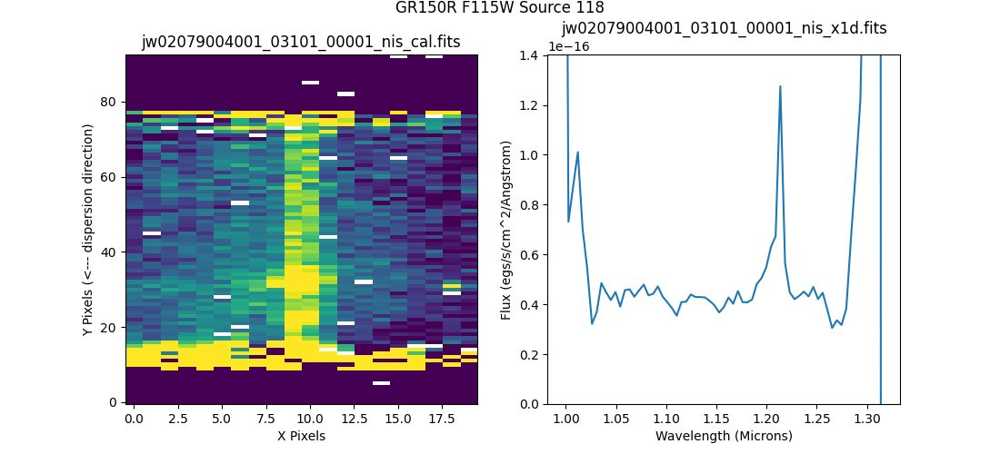

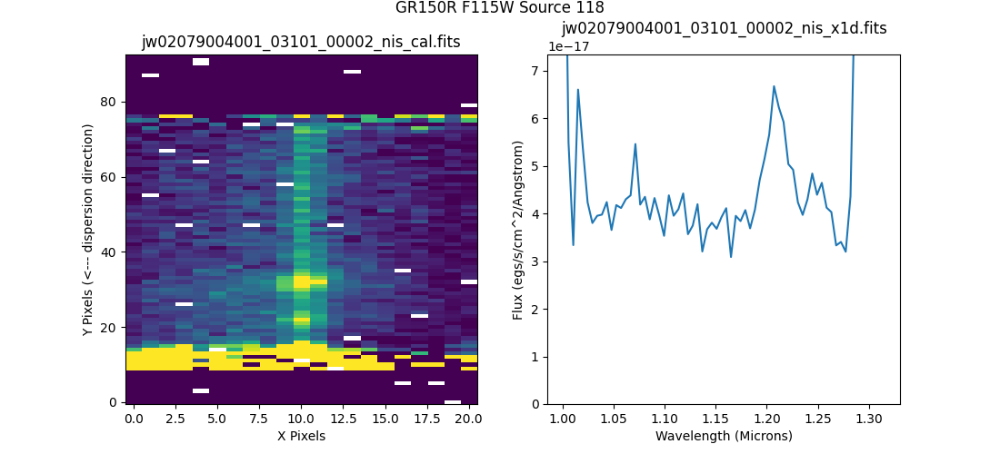

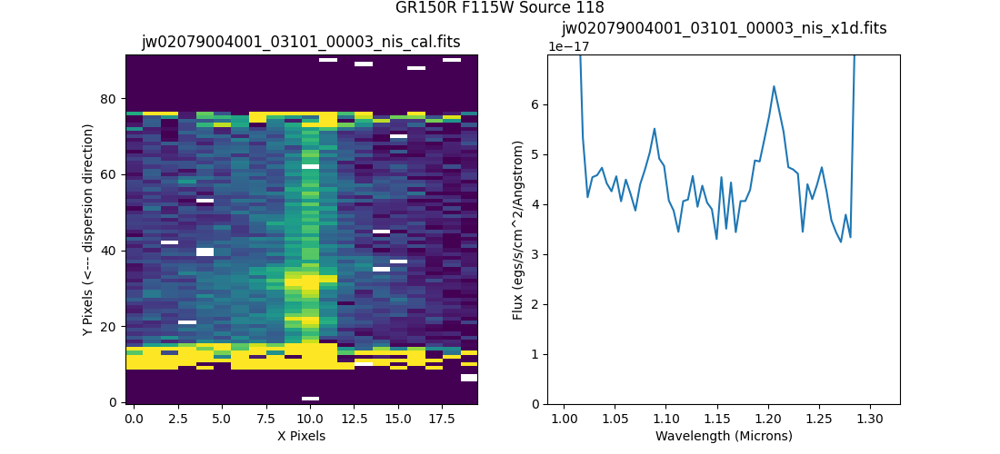

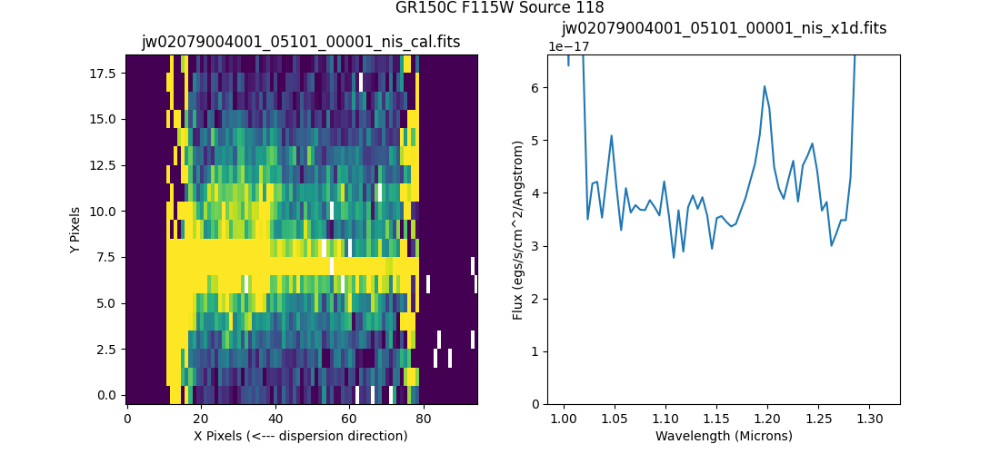

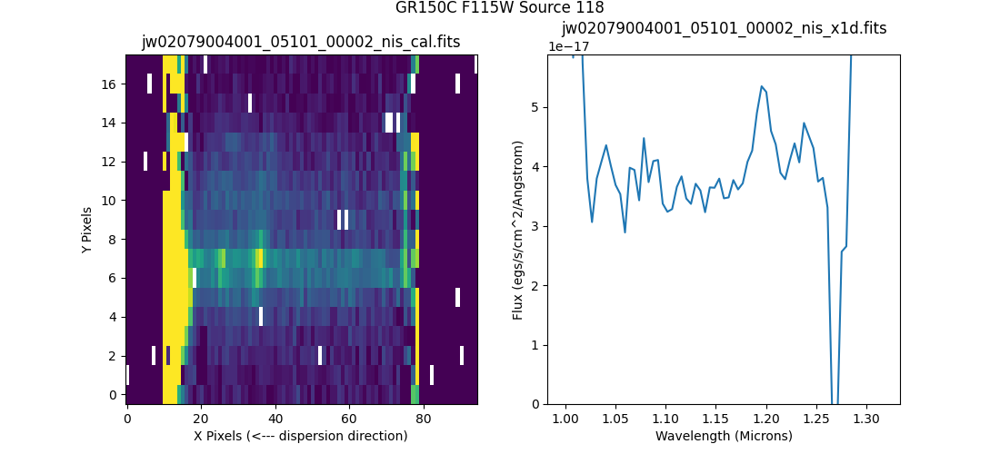

...

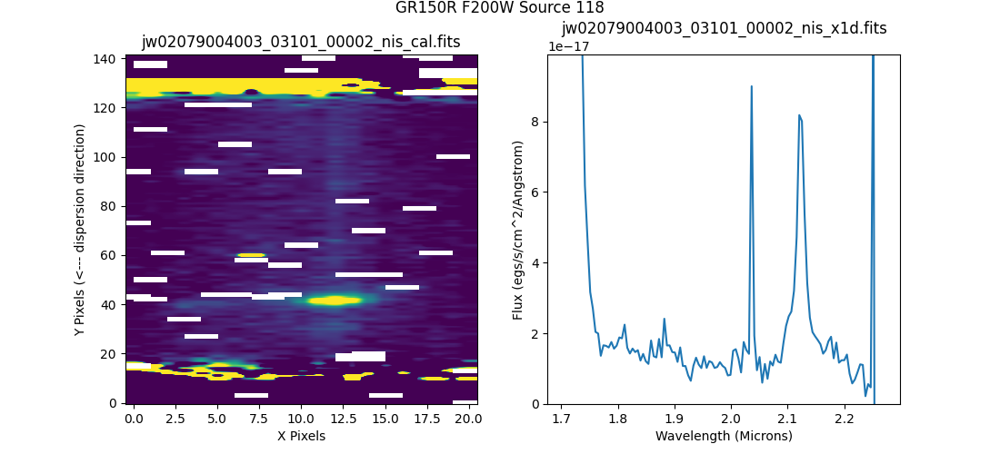

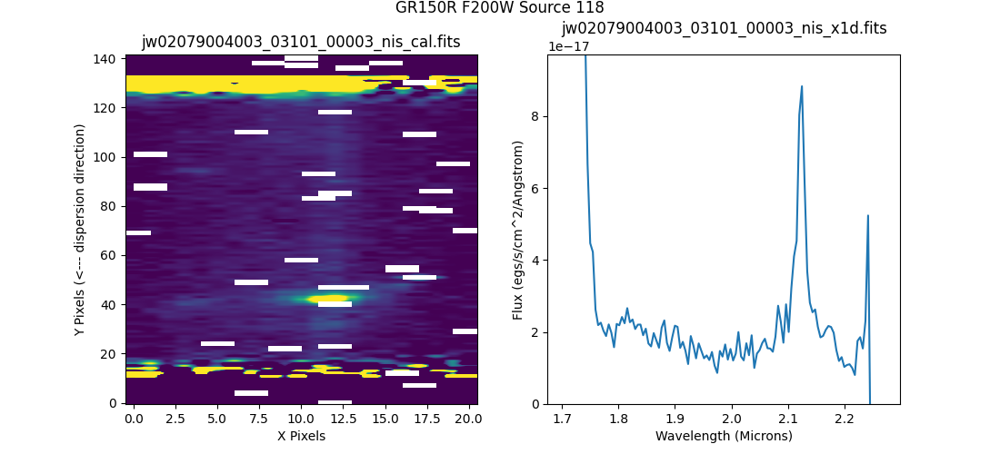

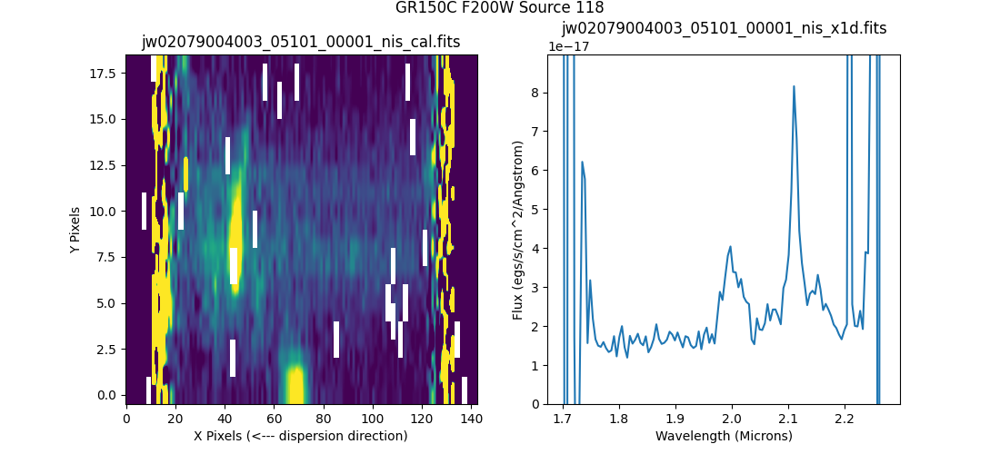

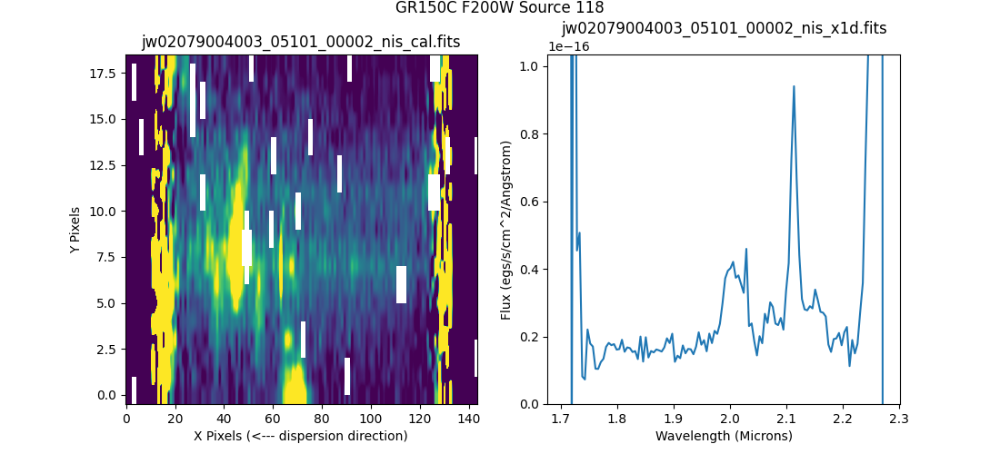

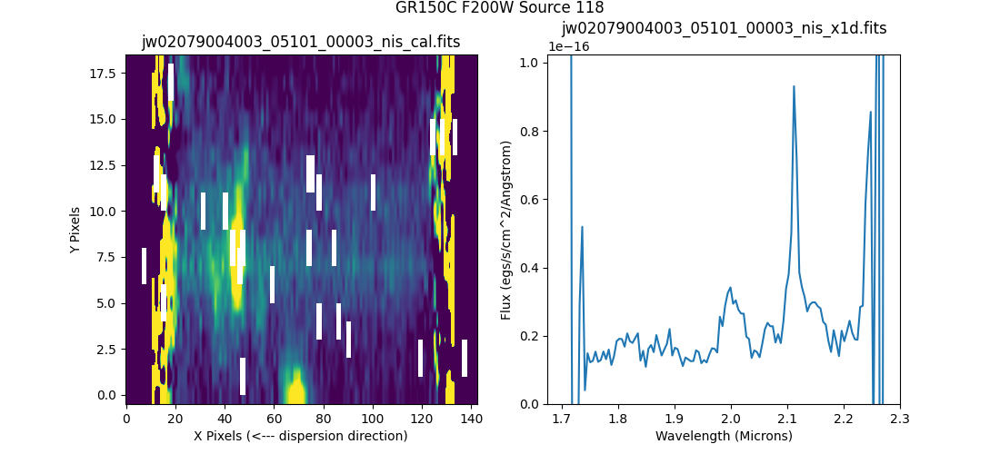

In [39]:
# Explore the new Data
x1ds = np.sort(glob.glob(os.path.join(source_outdir, "*x1d.fits")))

# get a list of all of the source IDs from the first file to look at for this example
sources = [fits.getval(x1ds[0], 'SOURCEID', ext=ext) for ext in range(len(fits.open(x1ds[0])))[1:-1]]
source_id = 118

# plot each x1d/cal file
for i, x1d_file in enumerate(x1ds):
    cal_file = x1d_file.replace('x1d.fits', 'cal.fits')
    with fits.open(x1d_file) as x1d_hdu, fits.open(cal_file) as cal_hdu:

        try:
            wh_x1d, wh_cal = find_source_ext(x1d_hdu, cal_hdu, source_id, info=False)
        except IndexError:
            # this means the source isn't in this observation
            continue

        x1d_data = x1d_hdu[wh_x1d].data 
        cal_data = cal_hdu[wh_cal].data

    plot_cutout_and_spectrum(cal_data, x1d_data, cal_file, x1d_file, source_id)

Overplot these files on top of each other to compare. The two grisms will be different line styles to draw attention to any differences that could be due to the calibration, including contamination, and each blocking filter will be a different color.

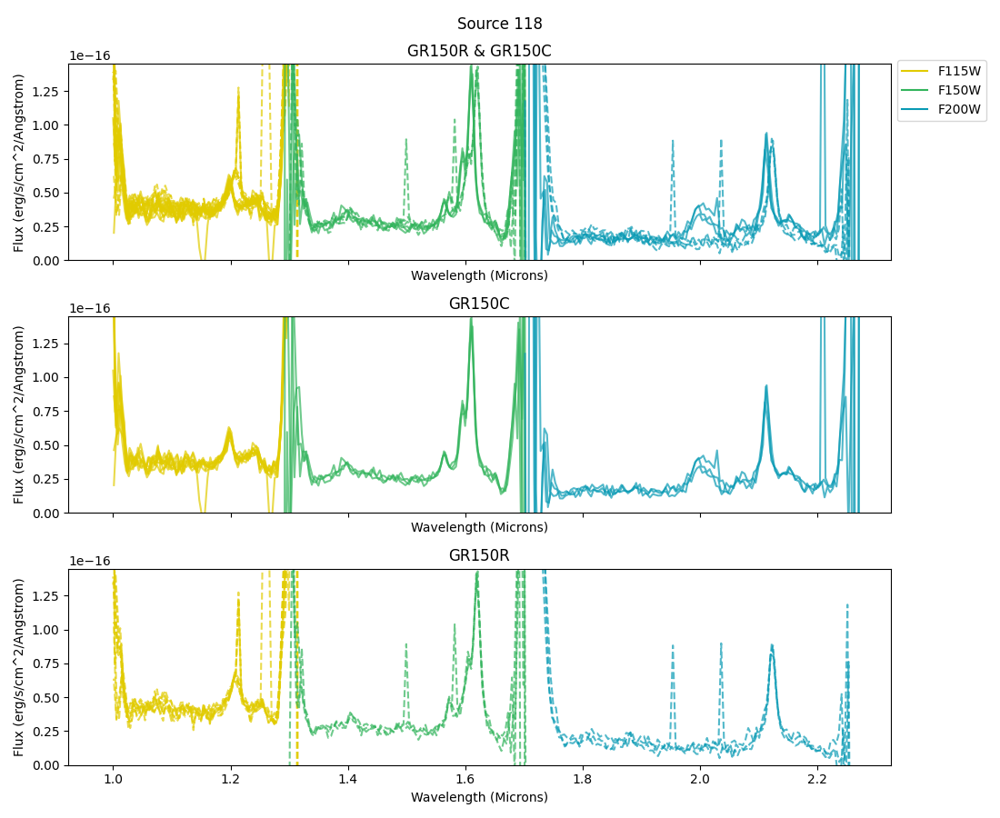

In [40]:
# Overplot the different grisms on top of each other for the same source
x1ds = np.sort(glob.glob(os.path.join(source_outdir, "*x1d.fits")))

# get a list of all of the source IDs from the first file to look at for this example
sources = [fits.getval(x1ds[0], 'SOURCEID', ext=ext) for ext in range(len(fits.open(x1ds[0])))[1:-1]]
source_id = 118

# create a figure with three panels
src118_fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(11, 9), sharex=True, sharey=True)

ls_dict = {'GR150R': '--',
           'GR150C': '-',
           }

color_dict = {'F115W': '#e1cb00',
              'F150W': '#32b45c',
              'F200W': '#099ab4',
              }

max_fluxes = []
all_waves = []
# plot each x1d file
for i, x1d_file in enumerate(x1ds):
    with fits.open(x1d_file) as x1d_hdu:
        try:
            wh_x1d, wh_cal = find_source_ext(x1d_hdu, cal_hdu, source_id, info=False)
        except IndexError:
            # this means the source isn't in this observation
            continue

        x1d_data = x1d_hdu[wh_x1d].data 
        grism = x1d_hdu[0].header['FILTER']
        filter = x1d_hdu[0].header['PUPIL']

    wave = x1d_data['WAVELENGTH'].ravel()
    flux = x1d_data['FLUX'].ravel()

    flux = Fnu_to_Flam(wave, flux)
    fluxunits = 'erg/s/cm^2/Angstrom'

    ax1.plot(wave, flux, color=color_dict[filter], ls=ls_dict[grism], alpha=0.7)
    if grism == 'GR150C':
        ax2.plot(wave, flux, color=color_dict[filter], ls=ls_dict[grism], alpha=0.7)
    else:
        ax3.plot(wave, flux, color=color_dict[filter], ls=ls_dict[grism], alpha=0.7)

    # save the maximum fluxes for plotting, removing any edge effects
    edge_buffer = int(len(flux) * .25)
    max_fluxes.append(np.nanmax(flux[edge_buffer:edge_buffer*-1]))
    all_waves.extend(wave)

# plot limits & labels
ax1.set_ylim(0, np.max(max_fluxes))
ax1.set_xlim(np.min(all_waves), np.max(all_waves))

src118_fig.suptitle(f'Source {source_id}')
ax1.set_title('GR150R & GR150C')
ax2.set_title('GR150C')
ax3.set_title('GR150R')

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel('Wavelength (Microns)')
    ax.set_ylabel(f'Flux ({fluxunits})')

# label for each of the filters
for filt, color in color_dict.items():
    ax1.plot(0, 0, color=color, label=filt)

ax1.legend(bbox_to_anchor=(1, 1.05))
src118_fig.tight_layout()

##### Look at all of the sources for a single file

Note that some sources might not actually be extracting anything interesting. If this is the case, go back to your source catalog and images to ensure that you have the correct source identified and the target is centered in the cutout. This notebook uses simple examples to create and limit the source catalog, so it might not always show the most scientifically interesting sources.

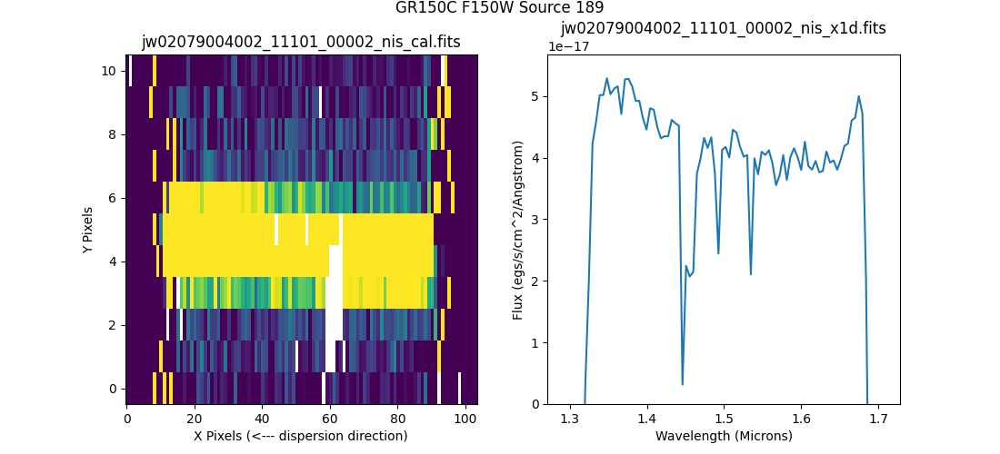

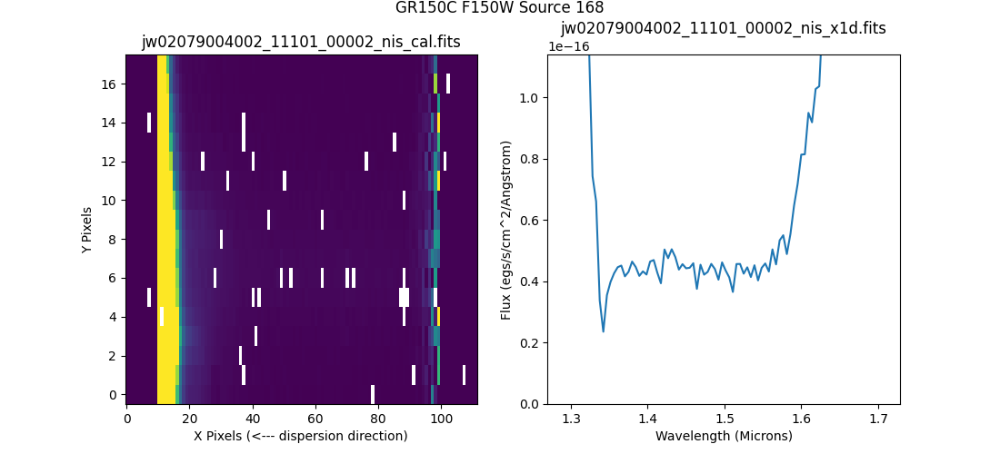

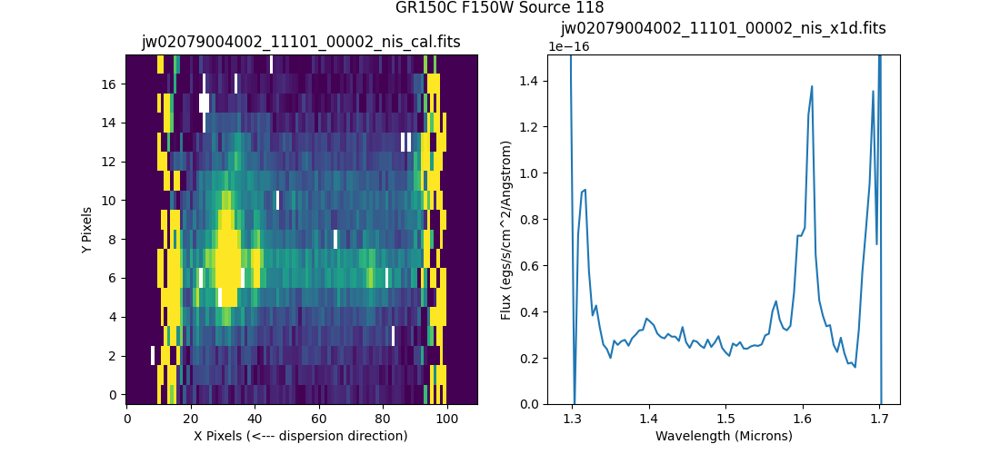

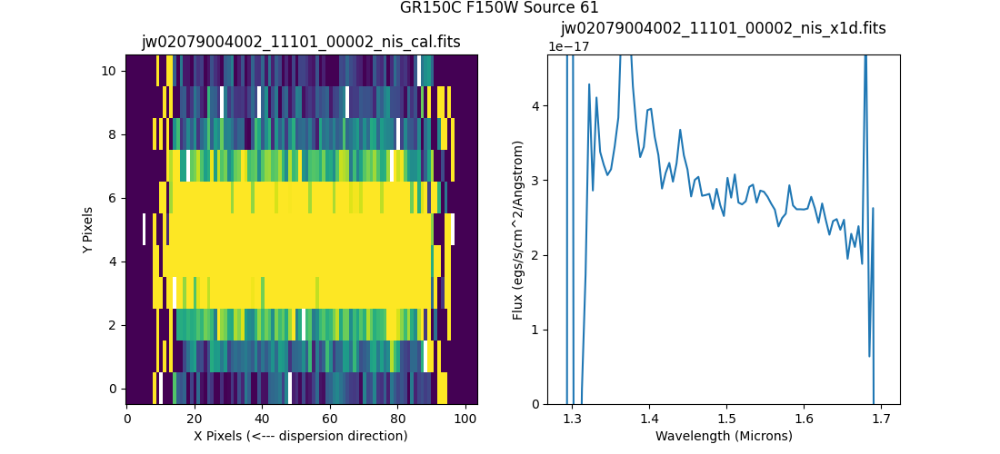

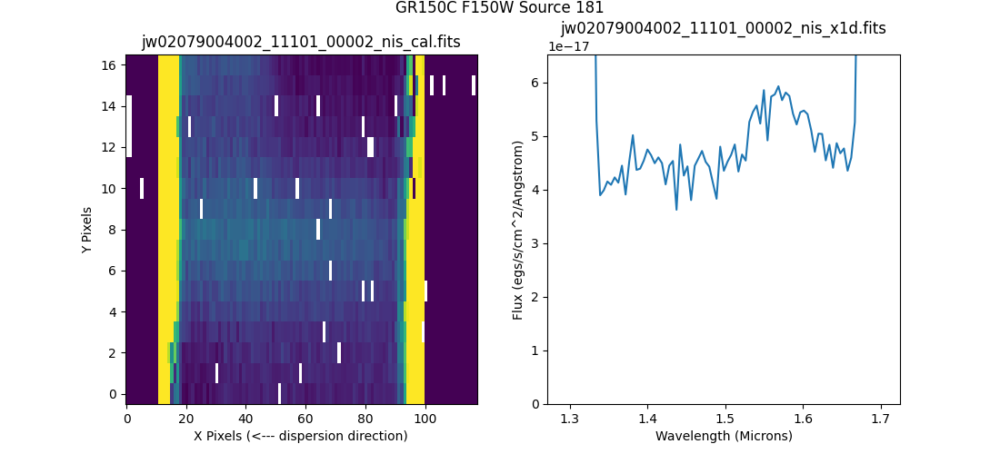

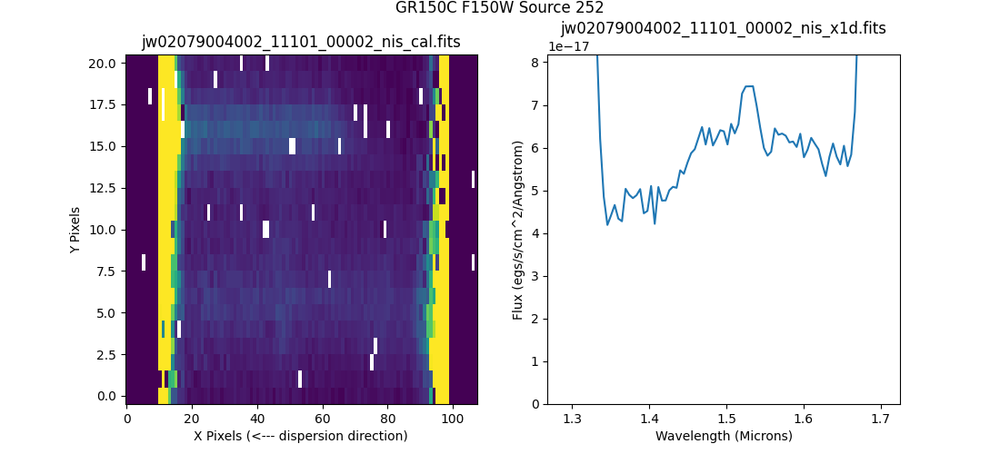

In [41]:
x1d_file = os.path.join(source_outdir, 'jw02079004002_11101_00002_nis_x1d.fits') # this is a nice spectrum of 118 above
cal_file = x1d_file.replace('x1d.fits', 'cal.fits')
with fits.open(x1d_file) as x1d_hdu, fits.open(cal_file) as cal_hdu:

    for ext in range(len(x1d_hdu))[1:-1]:

        source_id = x1d_hdu[ext].header['SOURCEID']

        try:
            wh_x1d, wh_cal = find_source_ext(x1d_hdu, cal_hdu, source_id, info=False)
        except IndexError:
            # this means the source isn't in this observation
            continue
    
        x1d_data = x1d_hdu[wh_x1d].data 
        cal_data = cal_hdu[wh_cal].data
    
        plot_cutout_and_spectrum(cal_data, x1d_data, cal_file, x1d_file, source_id)

##### Visualize where the extracted sources are on the dispersed image, and how that compares to the direct image

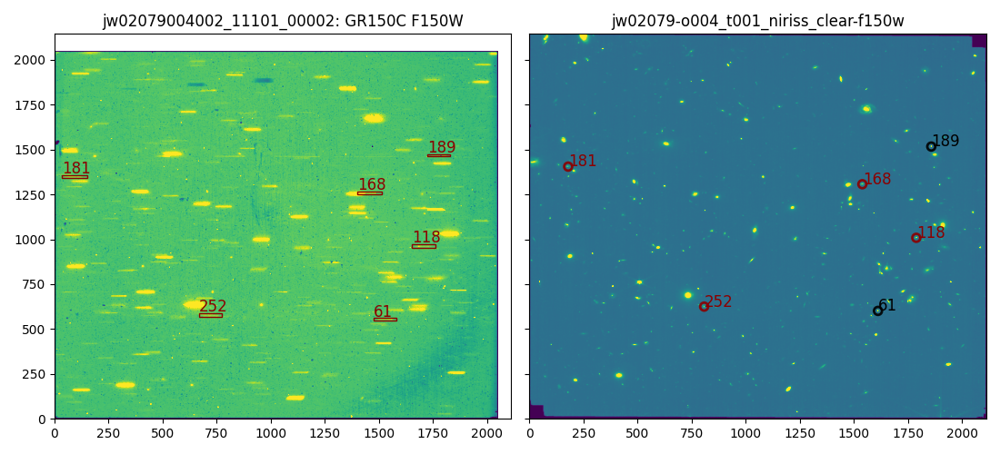

In [42]:
# setting up the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5), sharex=True, sharey=True)

# **grism data

# for the dispersed image plot
# x1d_file and cal_file use the same root as we are looking at for a single source
rate_file = os.path.basename(x1d_file.replace('x1d.fits', 'rate.fits'))

# fill in the nan values from the bad pixels with zero to make it easier to look at
with fits.open(rate_file) as rate_hdu:
    rate_data = rate_hdu[1].data
rate_data[np.isnan(rate_data)] = 0

# plot the rate file and the extraction box
ax1.imshow(rate_data, origin='lower', vmin=0, vmax=np.nanmax(rate_data)*0.01, aspect='auto')

with fits.open(x1d_file) as x1d_hdu, fits.open(cal_file) as cal_hdu:

    for ext in range(len(x1d_hdu))[1:-1]:

        source_id = x1d_hdu[ext].header['SOURCEID']

        try:
            wh_x1d, wh_cal = find_source_ext(x1d_hdu, cal_hdu, source_id, info=False)
        except IndexError:
            # this means the source isn't in this observation
            continue
    
        x1d_data = x1d_hdu[wh_x1d].data 
        cal_data = cal_hdu[wh_cal].data
    
        # extraction box parameters from the header of the cal data:
        cal_header = cal_hdu[wh_cal].header
        sx_left = cal_header['SLTSTRT1']
        swidth = cal_header['SLTSIZE1']
        sx_right = cal_header['SLTSTRT1'] + swidth
        sy_bottom = cal_header['SLTSTRT2']
        sheight = cal_header['SLTSIZE2']
        sy_top = cal_header['SLTSTRT2'] + sheight
        
        rectangle = patches.Rectangle((sx_left, sy_bottom), swidth, sheight, edgecolor='darkred', facecolor="None", linewidth=1)
        ax1.add_patch(rectangle)
        ax1.text(sx_left, sy_top+10, source_id, fontsize=12, color='darkred')
        
    ax1.set_title(f"{os.path.basename(x1d_file).split('_nis')[0]}: {cal_hdu[0].header['FILTER']} {cal_hdu[0].header['PUPIL']}")

# **imaging data
asn_data = json.load(open(fits.getval(x1d_file, 'ASNTABLE')))
i2d_name = asn_data['products'][0]['members'][1]['expname']
cat_name = asn_data['products'][0]['members'][2]['expname']
with fits.open(os.path.join('../../', data_dir, custom_run_image3, i2d_name)) as i2d:
    ax2.imshow(i2d[1].data, origin='lower', aspect='auto', vmin=0, vmax=np.nanmax(i2d[1].data)*0.01)
    ax2.set_title(f"{os.path.basename(i2d_name).split('_i2d')[0]}")

# also plot the associated catalog
cat = Table.read(cat_name)
extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source

for color, sources in zip(['darkred', 'black'], [extended_sources, point_sources]):
    # plotting the sources
    ax2.scatter(sources['xcentroid'], sources['ycentroid'], s=40, facecolors='None', edgecolors=color, alpha=0.9, lw=2)

    # adding source labels 
    for i, source_num in enumerate(sources['label']):
        ax2.annotate(source_num, 
                     (sources['xcentroid'][i]+0.5, sources['ycentroid'][i]+0.5), 
                     fontsize=12,
                     color=color)

fig.tight_layout()

Continue to explore further, including using the [spec3 stage](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_spec3.html) of the pipeline!

<img style="float: right;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>